# Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import Libraries

In [ ]:
pip install keras-tuner

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 5.4 MB/s eta 0:00:00


In [ ]:
import random
import math
import numpy as np
from sklearn import preprocessing

import os
import pandas as pd
import zipfile

from datetime import datetime, timedelta
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import KNNImputer

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

import seaborn as sns
import matplotlib.pyplot as plt

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from keras_tuner import Hyperband, BayesianOptimization
from keras_tuner.engine.hyperparameters import HyperParameters
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

In [ ]:
import os
import random
import math
import numpy as np
from sklearn import preprocessing


import pandas as pd
import zipfile

import pandas as pd
from datetime import datetime, timedelta
import numpy as np

from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import KNNImputer

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

import seaborn as sns
import matplotlib.pyplot as plt


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam


import tensorflow as tf


from keras_tuner import Hyperband, BayesianOptimization
from keras_tuner.engine.hyperparameters import HyperParameters

from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error




import random
import math
import numpy as np
from sklearn import preprocessing


import pandas as pd
import zipfile

import pandas as pd
from datetime import datetime, timedelta


from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import KNNImputer

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

import seaborn as sns
import matplotlib.pyplot as plt


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Dense, Dropout, Concatenate, Bidirectional, LSTM






# Load the data

In [ ]:
# bh=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/27.420177_72.070427_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
# ch=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/23.902077_71.19477_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
# dh=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/26.793418_72.009013_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
# kam=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/9.415969_78.248047_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
# kaz=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/32.2275_78.07099_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
# kur=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Kurnool/15.855387_78.065199_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
# man=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/23.986373_75.32641_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
# pava=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/14.138196_77.314631_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
# pha=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/27.294_72.365_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
# rew=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/24.630418_81.537174_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
# sak=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Sakri Solar Plant/21.085624_74.352948_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
# tan=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Tangste Solar Plant/33.9608_78.0579_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)

In [ ]:
pava_val=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/14.1077_77.3497_2019.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
pha_val=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/27.1333_72.3667_2019.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
rew_val=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/24.5333_81.3_2019.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)

In [ ]:
pava_val

,PeriodStart,AirTemp,Azimuth,CloudOpacity,Ghi,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,AlbedoDaily
0,2018-12-31T00:00:00Z,18.0,-111,0.0,0,14.3,92.7,951.2,102,2.3,106,0.2
1,2018-12-31T00:15:00Z,18.0,-111,0.0,0,14.2,92.7,951.4,101,2.3,102,0.2
2,2018-12-31T00:30:00Z,17.9,-112,0.0,0,14.1,92.7,951.7,99,2.3,99,0.2
3,2018-12-31T00:45:00Z,17.9,-113,0.0,0,14.1,92.7,952.0,98,2.3,96,0.2
4,2018-12-31T01:00:00Z,18.0,-113,0.0,0,14.0,92.1,952.2,97,2.4,92,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...
35227,2020-01-01T22:45:00Z,21.3,-109,0.0,0,32.2,84.2,948.3,119,2.5,123,0.2
35228,2020-01-01T23:00:00Z,21.4,-109,0.0,0,32.2,83.8,948.4,119,2.5,120,0.2
35229,2020-01-01T23:15:00Z,21.6,-109,0.0,0,32.2,83.1,948.5,119,2.5,116,0.2
35230,2020-01-01T23:30:00Z,21.9,-109,0.0,0,32.1,82.5,948.7,119,2.5,113,0.2


In [ ]:
pha_val

,PeriodStart,AirTemp,Azimuth,CloudOpacity,Ghi,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,AlbedoDaily
0,2018-12-31T00:00:00Z,7.8,-105,0.0,0,7.6,48.8,992.7,93,2.4,114,0.29
1,2018-12-31T00:15:00Z,7.7,-106,0.0,0,7.6,49.3,992.8,94,2.4,111,0.29
2,2018-12-31T00:30:00Z,7.7,-107,0.0,0,7.6,49.8,993.0,95,2.5,108,0.29
3,2018-12-31T00:45:00Z,7.6,-109,0.0,0,7.6,50.4,993.2,96,2.5,105,0.29
4,2018-12-31T01:00:00Z,7.6,-110,0.0,0,7.7,51.1,993.3,98,2.5,101,0.29
...,...,...,...,...,...,...,...,...,...,...,...,...
35227,2020-01-01T22:45:00Z,8.5,-98,0.0,0,16.5,86.6,992.1,70,4.1,131,0.29
35228,2020-01-01T23:00:00Z,8.5,-99,0.0,0,16.7,86.7,992.1,70,4.0,127,0.29
35229,2020-01-01T23:15:00Z,8.5,-101,0.0,0,16.8,86.9,992.1,69,4.0,124,0.29
35230,2020-01-01T23:30:00Z,8.4,-102,0.0,0,17.0,87.0,992.1,69,4.0,121,0.29


In [ ]:
rew_val

,PeriodStart,AirTemp,Azimuth,CloudOpacity,Ghi,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,AlbedoDaily
0,2018-12-31T00:00:00Z,6.9,-109,0.0,0,9.8,84.5,982.1,264,2.2,106,0.19
1,2018-12-31T00:15:00Z,7.0,-110,0.0,0,9.7,84.3,982.2,262,2.2,103,0.19
2,2018-12-31T00:30:00Z,7.0,-111,0.0,0,9.7,84.0,982.3,260,2.2,99,0.19
3,2018-12-31T00:45:00Z,7.1,-113,0.0,0,9.7,83.7,982.4,258,2.2,96,0.19
4,2018-12-31T01:00:00Z,7.2,-114,0.0,0,9.7,82.9,982.6,256,2.1,93,0.19
...,...,...,...,...,...,...,...,...,...,...,...,...
35227,2020-01-01T22:45:00Z,11.7,-103,0.0,0,25.4,97.8,980.7,117,1.6,122,0.18
35228,2020-01-01T23:00:00Z,11.6,-104,0.0,0,25.4,97.6,980.8,118,1.6,119,0.18
35229,2020-01-01T23:15:00Z,11.8,-105,0.0,0,25.2,96.8,980.8,116,1.6,116,0.18
35230,2020-01-01T23:30:00Z,11.8,-106,0.0,0,25.1,96.0,980.9,113,1.6,112,0.18


# Data Processing

In [ ]:
class DateTimeConverter:
    def __init__(self, data):
        self.data = data
    def add_month_hour_columns(self):
      self.data['Month']=pd.to_datetime(self.data['PeriodStart']).dt.month
      self.data['Hour']=pd.to_datetime(self.data['PeriodStart']).dt.hour
    def add_features(self):
      self.data = pd.get_dummies(self.data, columns=['Month'])
      self.data['sin_hour'] = np.sin(2*np.pi*self.data['Hour'].astype(int)/24)
      self.data['cos_hour'] = np.cos(2*np.pi*self.data['Hour'].astype(int)/24)
    def visualize_transformations(self):
      fig, ax = plt.subplots()
      ax.plot(self.data['Hour'].iloc[:96], self.data['Ghi'].iloc[:96]/1000, label='Solar Irradiance')
      ax.plot(self.data['Hour'].iloc[:96], self.data['sin_hour'].iloc[:96], label='Sine of Hour')
      ax.plot(self.data['Hour'].iloc[:96], self.data['cos_hour'].iloc[:96], label='Cosine of Hour')
      ax.set_xlabel('Hour of Day')
      ax.set_ylabel('Value')
      ax.set_title('Solar Irradiance and Time of Day Transformations')
      ax.legend()
      plt.show()

    def remove_features(self):
      self.data.drop(['Year', 'Day', 'Minute', 'Hour','Clearsky GHI', 'DHI', 'DNI', 'Clearsky DHI', 'Clearsky DNI','Fill Flag'],inplace=True,axis=1)
    
    def get_data(self):
      return self.data



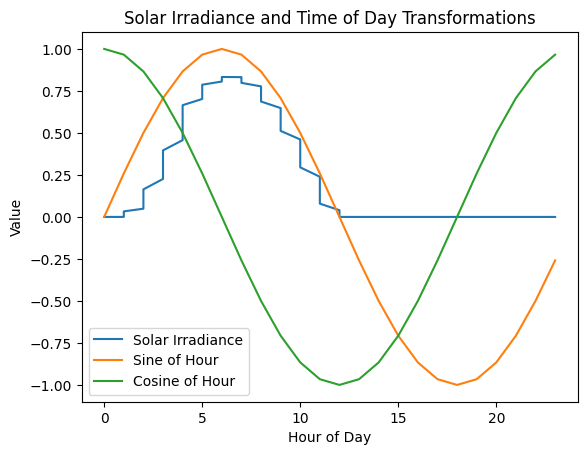

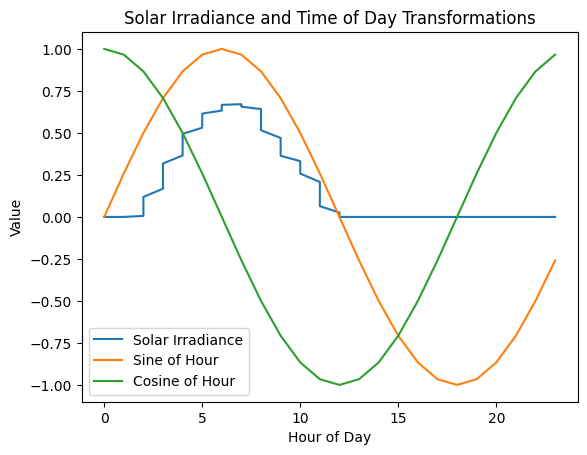

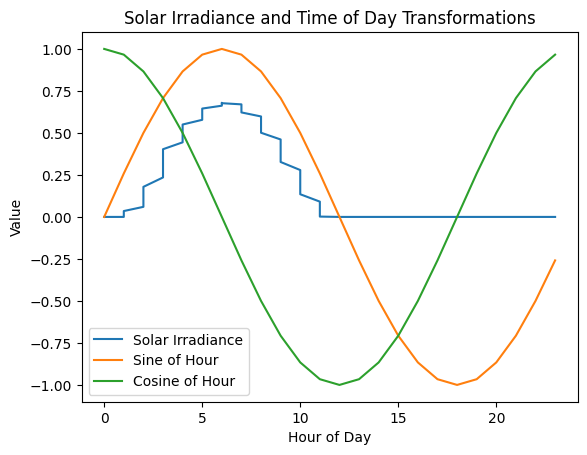

In [ ]:
# pava_val
dt_converter = DateTimeConverter(pava_val)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
pava_val=dt_converter.get_data()
# pha_val
dt_converter = DateTimeConverter(pha_val)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
pha_val=dt_converter.get_data()

# rew_val
dt_converter = DateTimeConverter(rew_val)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
rew_val=dt_converter.get_data()



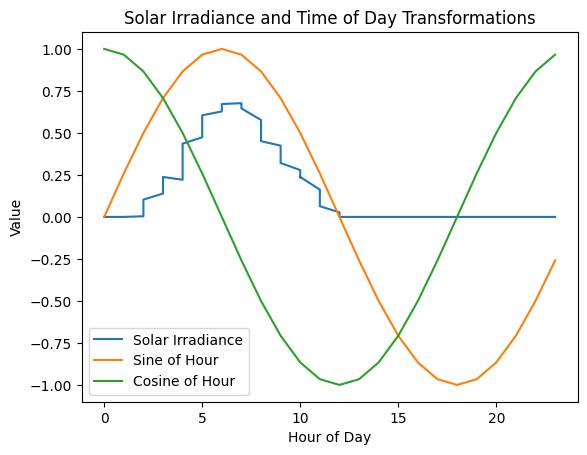

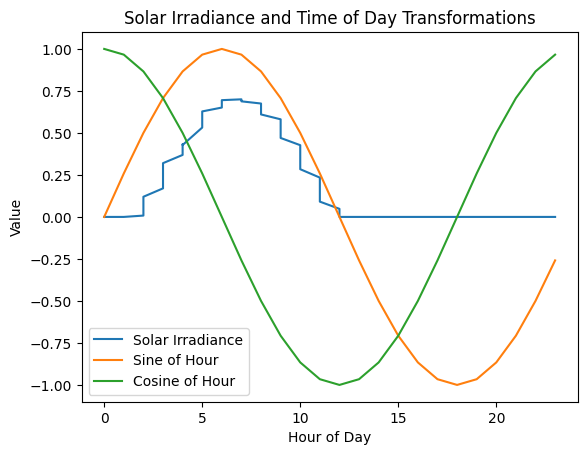

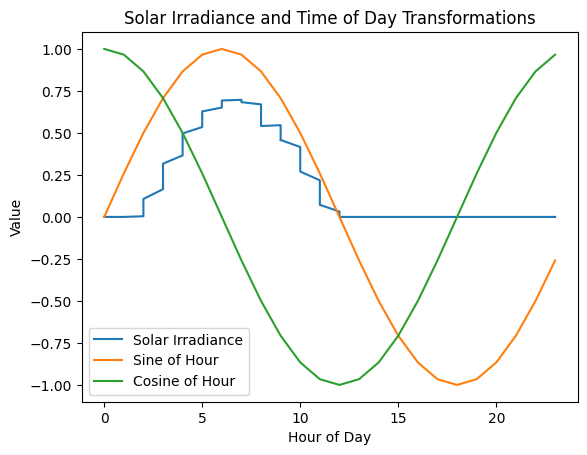

NameError: ignored

In [ ]:
# bh
dt_converter = DateTimeConverter(bh)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
bh=dt_converter.get_data()
# ch
dt_converter = DateTimeConverter(ch)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
ch=dt_converter.get_data()
# dh
dt_converter = DateTimeConverter(dh)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
dh=dt_converter.get_data()
# kam
dt_converter = DateTimeConverter(kam)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
kam=dt_converter.get_data()
# kaz
dt_converter = DateTimeConverter(kaz)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
kaz=dt_converter.get_data()
# kur
dt_converter = DateTimeConverter(kur)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
kur=dt_converter.get_data()
# man
dt_converter = DateTimeConverter(man)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
man=dt_converter.get_data()
# pava
dt_converter = DateTimeConverter(pava)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
pava=dt_converter.get_data()
# pha
dt_converter = DateTimeConverter(pha)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
pha=dt_converter.get_data()
# rew
dt_converter = DateTimeConverter(rew)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
rew=dt_converter.get_data()
# sak
dt_converter = DateTimeConverter(sak)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
sak=dt_converter.get_data()
# tan
dt_converter = DateTimeConverter(tan)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
tan=dt_converter.get_data()


# Checking the variance of the data

In [ ]:
class SolarIrradianceMetrics:
    def __init__(self, data_file):
        self.data = data_file
        self.Irradiance = self.data['Ghi']

    def get_mean(self):
        return np.mean(self.Irradiance)

    def get_iqr(self):
        q1 = np.percentile(self.Irradiance, 25)
        q3 = np.percentile(self.Irradiance, 75)
        return q3 - q1

    def get_std_dev(self):
        return np.std(self.Irradiance)

    def plot_histogram(self):
        plt.hist(self.Irradiance, bins=50)
        plt.title('Distribution of Solar Irradiance Data')
        plt.xlabel('Irradiance (w/m^2)')
        plt.ylabel('Frequency')
        plt.show()

    def plot_boxplot(self):
        plt.boxplot(self.Irradiance)
        plt.title('Boxplot of Solar Irradiance Data')
        plt.xlabel('Irradiance (w/m^2)')
        plt.show()

    def plot_stats(self):
        mean = self.get_mean()
        iqr = self.get_iqr()
        std_dev = self.get_std_dev()

        fig, ax = plt.subplots()
        ax.bar(['Mean', 'IQR', 'Std. Dev.'], [mean, iqr, std_dev])
        ax.set_title('Statistics of Solar Irradiance Data')
        ax.set_ylabel('Irradiance (W/m^2)')
        plt.show()


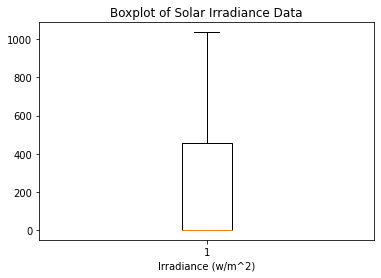

Stnadard Deviation :- 300.776681824732
Inter-quartile Range :- 455.0
Mean :- 220.87882733585857


In [ ]:
sm=SolarIrradianceMetrics(bh)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

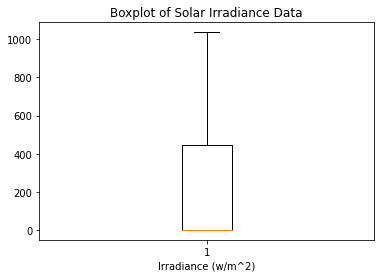

Stnadard Deviation :- 299.4462966874787
Inter-quartile Range :- 443.25
Mean :- 218.87026515151516


In [ ]:
sm=SolarIrradianceMetrics(ch)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

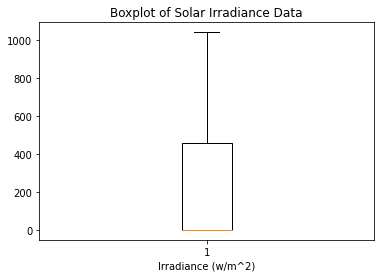

Stnadard Deviation :- 303.24702833181635
Inter-quartile Range :- 456.0
Mean :- 222.03224957912457


In [ ]:
sm=SolarIrradianceMetrics(dh)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

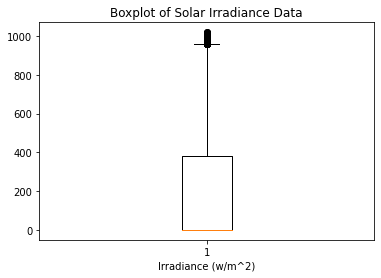

Stnadard Deviation :- 290.02785081617975
Inter-quartile Range :- 383.0
Mean :- 204.68711858164983


In [ ]:
sm=SolarIrradianceMetrics(kam)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

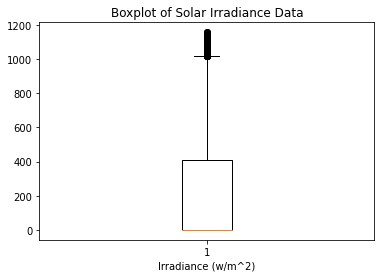

Stnadard Deviation :- 310.9372758982954
Inter-quartile Range :- 407.0
Mean :- 221.69787720959596


In [ ]:
sm=SolarIrradianceMetrics(kaz)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

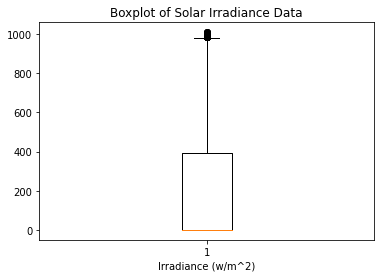

Stnadard Deviation :- 292.4554611962433
Inter-quartile Range :- 393.0
Mean :- 207.43233112373738


In [ ]:
sm=SolarIrradianceMetrics(kur)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

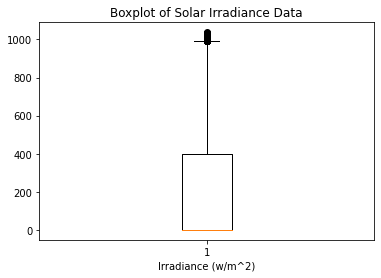

Stnadard Deviation :- 293.2598505729882
Inter-quartile Range :- 397.0
Mean :- 206.58691077441077


In [ ]:
sm=SolarIrradianceMetrics(man)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

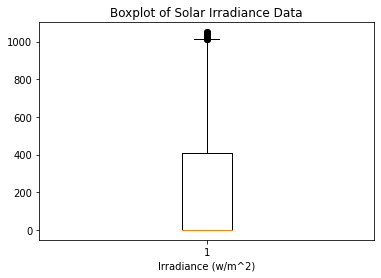

Stnadard Deviation :- 300.8688450373308
Inter-quartile Range :- 406.25
Mean :- 214.91398358585857


In [ ]:
sm=SolarIrradianceMetrics(pava)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

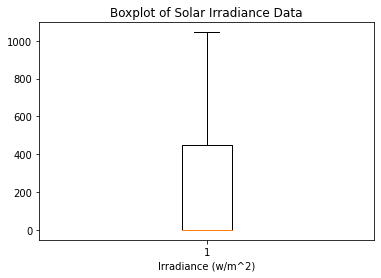

Stnadard Deviation :- 300.6777040313171
Inter-quartile Range :- 451.0
Mean :- 220.29261363636363


In [ ]:
sm=SolarIrradianceMetrics(pha)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

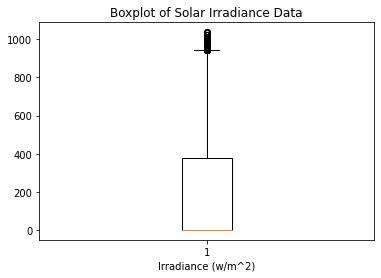

Stnadard Deviation :- 283.85183627053846
Inter-quartile Range :- 378.0
Mean :- 198.93054240319864


In [ ]:
sm=SolarIrradianceMetrics(rew)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

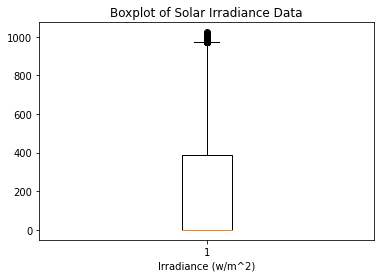

Stnadard Deviation :- 288.5697624045657
Inter-quartile Range :- 389.0
Mean :- 204.15330387205387


In [ ]:
sm=SolarIrradianceMetrics(sak)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

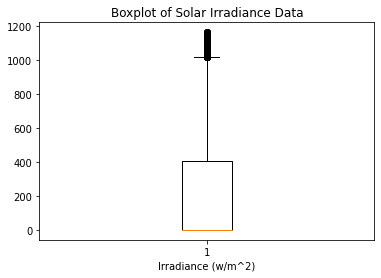

Stnadard Deviation :- 305.13550593345474
Inter-quartile Range :- 407.0
Mean :- 220.37240898569024


In [ ]:
sm=SolarIrradianceMetrics(tan)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

# Finding Optimal Time steps Lags

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

class AutocorrelationAnalyzer:
    def __init__(self, data, column_name):
        self.data = data
        self.column_name = column_name

    def calculate_acf(self, lags=None):
        if lags is None:
            lags = len(self.data) - 1
        acf_values = pd.Series(self.data[self.column_name]).autocorr(lag=lags)
        return acf_values

    def plot_acf(self, lags=None):
        if lags is None:
            lags = len(self.data) - 1
        fig, ax = plt.subplots(figsize=(10, 6))
        plot_acf(self.data[self.column_name], lags=lags, ax=ax)
        plt.xlabel('Lag')
        plt.ylabel('Autocorrelation')
        plt.title('Autocorrelation Function')
        plt.show()

Autocorrelation at lag 4: 0.930416574132719


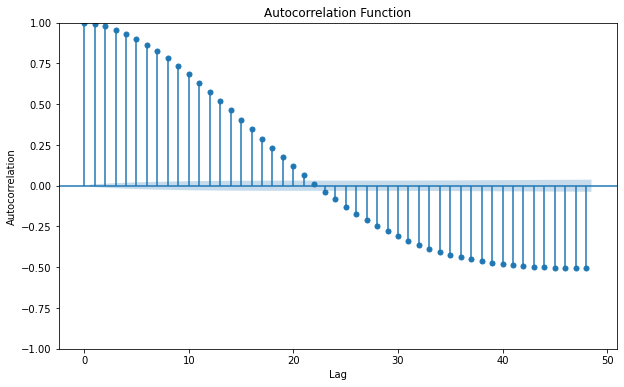

In [ ]:




# Replace 'irradiance' with the name of the column containing your irradiance data
column_name = 'Ghi'

# Create an AutocorrelationAnalyzer instance
analyzer = AutocorrelationAnalyzer(kaz, column_name)

# Calculate and print the autocorrelation for a specific lag (e.g., 4)
lag = 4
print(f"Autocorrelation at lag {lag}: {analyzer.calculate_acf(lag)}")

# Plot the autocorrelation function for the time series
lags_to_plot = 48  # Adjust this value as needed
analyzer.plot_acf(lags_to_plot)

In [ ]:
lag = 96
print(f"Autocorrelation at lag {lag}: {analyzer.calculate_acf(lag)}")

Autocorrelation at lag 96: 0.912113197760655


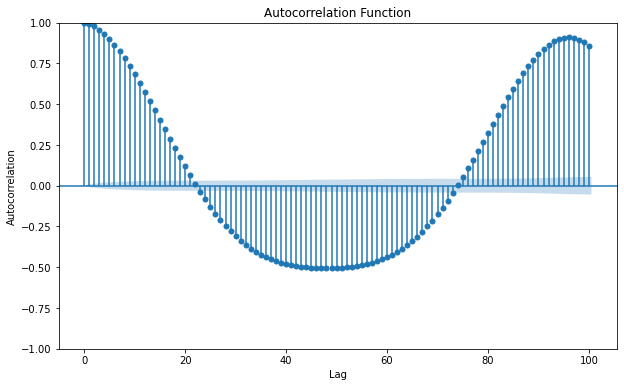

In [ ]:
# Plot the autocorrelation function for the time series
lags_to_plot = 100  # Adjust this value as needed
analyzer.plot_acf(lags_to_plot)

# Data Spliting

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

class SplitData:

    def __init__(self,data,n_timesteps, n_outputs, only_production=False):
        # Read data from csv
        self.df=data
        # self.train=train
        # self.test=test

        self.train = None
        self.test = None

        self.x_train = None
        self.y_train = None

        self.x_test = None
        self.y_test = None

        self.only_production = only_production
        self.lag = n_timesteps

        self.n_features = None
        self.num_of_outputs = n_outputs
        
        self.cols = self.df.columns


    def split_sequences(self, sequences):
        X, y = list(), list()
        for i in range(len(sequences)):
            # find the end of this pattern 
            end_ix = i + self.lag
            # check if we are beyond the dataset
            if end_ix > len(sequences):
                break
            # gather input and output parts of the pattern
            if self.only_production:
                seq_x, seq_y = sequences[i:end_ix, -1], sequences[end_ix:(end_ix+self.num_of_outputs), -1]
            else:
                seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:(end_ix+self.num_of_outputs),-1]
            X.append(seq_x)
            y.append(seq_y)
        return (np.array(X), np.array(y))

    def unique_shapes(self,x, y, lag_, n_features_, num_of_outputs_, only_production):
        uniuqe_shapes = []
        for k in range(len(x)):
            if only_production==True:
                if (x[k].shape == (lag_,)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)
            else:
                if (x[k].shape == (lag_, n_features_)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)       
        x = x[uniuqe_shapes]
        y = y[uniuqe_shapes]
        x = np.stack(x)
        y = np.stack(y)
        return (x, y)
    def preprocess_data(self):
        # Select non-correlated variables and perform One-Hot-Encoding to Months and Sin-Cos Similarities to Hours
        self.n_features = len(self.cols)

        feature_index = self.df.columns.get_loc('Ghi')

        # Pop the feature from its current position
        df_feature = self.df.pop('Ghi')

        # Insert the feature at the last index
        self.df.insert(len(self.df.columns), 'Ghi', df_feature)

        # Set the training data range

        train_start_4 = "2022-07-31T00:00:00Z"
        train_end_4 = "2022-12-31T23:45:00Z"

        # Set the training data range
        train_start_8 = "2022-03-31T00:00:00Z"
        train_end_8 = "2022-12-31T23:45:00Z"

        # Set the training data range
        train_start_12 = "2021-12-31T00:00:00Z"
        train_end_12 = "2022-12-31T23:45:00Z"


        # Set the test data range
        test_start = "2022-12-31T23:45:00Z"

        # Convert the 'PeriodStart' column to a datetime format
        self.df['PeriodStart'] = pd.to_datetime(self.df['PeriodStart'])

        # Split the data into train and test sets based on the date and time range
        self.train_4 = self.df[(self.df['PeriodStart'] >= train_start_4) & (self.df['PeriodStart'] <= train_end_4)]
        self.train_8 = self.df[(self.df['PeriodStart'] >= train_start_8) & (self.df['PeriodStart'] <= train_end_8)]
        self.train_12 = self.df[(self.df['PeriodStart'] >= train_start_12) & (self.df['PeriodStart'] <= train_end_12)]
        self.test = self.df[self.df['PeriodStart'] >= test_start]

        self.x_train_4, self.y_train_4 = self.split_sequences(self.train_4.values)
        self.x_train_8, self.y_train_8 = self.split_sequences(self.train_8.values)
        self.x_train_12, self.y_train_12 = self.split_sequences(self.train_12.values)
        self.x_test, self.y_test = self.split_sequences(self.test.values)

        self.x_train_4, self.y_train_4 = self.unique_shapes(self.x_train_4, self.y_train_4, self.lag, self.n_features, self.num_of_outputs, self.only_production)
        self.x_train_8, self.y_train_8 = self.unique_shapes(self.x_train_8, self.y_train_8, self.lag, self.n_features, self.num_of_outputs, self.only_production)
        self.x_train_12, self.y_train_12 = self.unique_shapes(self.x_train_12, self.y_train_12, self.lag, self.n_features, self.num_of_outputs, self.only_production)
        self.x_test, self.y_test   = self.unique_shapes(self.x_test,  self.y_test,  self.lag, self.n_features, self.num_of_outputs,self.only_production)

        return ((self.x_train_4[:, :, 1:],self.y_train_4),(self.x_train_8[:, :, 1:],self.y_train_8),(self.x_train_12[:, :, 1:],self.y_train_12),(self.x_test[:, :, 1:],self.y_test))

In [ ]:
len(bh.columns)-1

26

In [ ]:
n_timesteps=96
n_features=26
n_outputs=1

## PAVA

In [ ]:
sd1=SplitData(pava,n_timesteps,n_outputs,only_production=False)
pava_train_4,pava_train_8,pava_train_12,pava_test=sd1.preprocess_data()
X_train_pava_4,y_train_pava_4=pava_train_4
X_train_pava_8,y_train_pava_8=pava_train_8
X_train_pava_12,y_train_pava_12=pava_train_12
X_test_pava,y_test_pava=pava_test

<ipython-input-8-4d81ce585261>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
df_pava=pava.copy()

df_train_4_date_pava=pd.DataFrame()
df_train_8_date_pava=pd.DataFrame()
df_train_12_date_pava=pd.DataFrame()
df_test_date_pava=pd.DataFrame()

train_start_4 = "2022-07-31T00:00:00Z"
train_end_4 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_8 = "2022-03-31T00:00:00Z"
train_end_8 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_12 = "2021-12-31T00:00:00Z"
train_end_12 = "2022-12-31T23:45:00Z"


# Set the test data range
test_start = "2022-12-31T23:45:00Z"

# Convert the 'PeriodStart' column to a datetime format
df_pava['PeriodStart'] = pd.to_datetime(df_pava['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_train_4_date_pava['Date'] = df_pava[(df_pava['PeriodStart'] >= train_start_4) & (df_pava['PeriodStart'] <= train_end_4)]['PeriodStart']
df_train_8_date_pava['Date'] = df_pava[(df_pava['PeriodStart'] >= train_start_8) & (df_pava['PeriodStart'] <= train_end_8)]['PeriodStart']
df_train_12_date_pava['Date']= df_pava[(df_pava['PeriodStart'] >= train_start_12) & (df_pava['PeriodStart'] <= train_end_12)]['PeriodStart']
df_test_date_pava['Date']= df_pava[(df_pava['PeriodStart'] >= test_start)]['PeriodStart']

df_train_4_date_pava=df_train_4_date_pava.iloc[-len(X_train_pava_4):]
df_train_8_date_pava=df_train_8_date_pava.iloc[-len(X_train_pava_8):]
df_train_12_date_pava=df_train_12_date_pava.iloc[-len(X_train_pava_12):]
df_test_date_pava=df_test_date_pava.iloc[-len(X_test_pava):]

## pha

In [ ]:
sd2=SplitData(pha,n_timesteps,n_outputs,only_production=False)
pha_train_4,pha_train_8,pha_train_12,pha_test=sd2.preprocess_data()
X_train_pha_4,y_train_pha_4=pha_train_4
X_train_pha_8,y_train_pha_8=pha_train_8
X_train_pha_12,y_train_pha_12=pha_train_12
X_test_pha,y_test_pha=pha_test

<ipython-input-8-4d81ce585261>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
df_pha=pha.copy()

df_train_4_date_pha=pd.DataFrame()
df_train_8_date_pha=pd.DataFrame()
df_train_12_date_pha=pd.DataFrame()
df_test_date_pha=pd.DataFrame()

train_start_4 = "2022-07-31T00:00:00Z"
train_end_4 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_8 = "2022-03-31T00:00:00Z"
train_end_8 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_12 = "2021-12-31T00:00:00Z"
train_end_12 = "2022-12-31T23:45:00Z"


# Set the test data range
test_start = "2022-12-31T23:45:00Z"

# Convert the 'PeriodStart' column to a datetime format
df_pha['PeriodStart'] = pd.to_datetime(df_pha['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_train_4_date_pha['Date'] = df_pha[(df_pha['PeriodStart'] >= train_start_4) & (df_pha['PeriodStart'] <= train_end_4)]['PeriodStart']
df_train_8_date_pha['Date'] = df_pha[(df_pha['PeriodStart'] >= train_start_8) & (df_pha['PeriodStart'] <= train_end_8)]['PeriodStart']
df_train_12_date_pha['Date']= df_pha[(df_pha['PeriodStart'] >= train_start_12) & (df_pha['PeriodStart'] <= train_end_12)]['PeriodStart']
df_test_date_pha['Date']= df_pha[(df_pha['PeriodStart'] >= test_start)]['PeriodStart']

df_train_4_date_pha=df_train_4_date_pha.iloc[-len(X_train_pha_4):]
df_train_8_date_pha=df_train_8_date_pha.iloc[-len(X_train_pha_8):]
df_train_12_date_pha=df_train_12_date_pha.iloc[-len(X_train_pha_12):]
df_test_date_pha=df_test_date_pha.iloc[-len(X_test_pha):]

## rew

In [ ]:
sd3=SplitData(rew,n_timesteps,n_outputs,only_production=False)
rew_train_4,rew_train_8,rew_train_12,rew_test=sd3.preprocess_data()
X_train_rew_4,y_train_rew_4=rew_train_4
X_train_rew_8,y_train_rew_8=rew_train_8
X_train_rew_12,y_train_rew_12=rew_train_12
X_test_rew,y_test_rew=rew_test

<ipython-input-8-4d81ce585261>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
df_rew=rew.copy()

df_train_4_date_rew=pd.DataFrame()
df_train_8_date_rew=pd.DataFrame()
df_train_12_date_rew=pd.DataFrame()
df_test_date_rew=pd.DataFrame()

train_start_4 = "2022-07-31T00:00:00Z"
train_end_4 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_8 = "2022-03-31T00:00:00Z"
train_end_8 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_12 = "2021-12-31T00:00:00Z"
train_end_12 = "2022-12-31T23:45:00Z"


# Set the test data range
test_start = "2022-12-31T23:45:00Z"

# Convert the 'PeriodStart' column to a datetime format
df_rew['PeriodStart'] = pd.to_datetime(df_rew['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_train_4_date_rew['Date'] = df_rew[(df_rew['PeriodStart'] >= train_start_4) & (df_rew['PeriodStart'] <= train_end_4)]['PeriodStart']
df_train_8_date_rew['Date'] = df_rew[(df_rew['PeriodStart'] >= train_start_8) & (df_rew['PeriodStart'] <= train_end_8)]['PeriodStart']
df_train_12_date_rew['Date']= df_rew[(df_rew['PeriodStart'] >= train_start_12) & (df_rew['PeriodStart'] <= train_end_12)]['PeriodStart']
df_test_date_rew['Date']= df_rew[(df_rew['PeriodStart'] >= test_start)]['PeriodStart']

df_train_4_date_rew=df_train_4_date_rew.iloc[-len(X_train_rew_4):]
df_train_8_date_rew=df_train_8_date_rew.iloc[-len(X_train_rew_8):]
df_train_12_date_rew=df_train_12_date_rew.iloc[-len(X_train_rew_12):]
df_test_date_rew=df_test_date_rew.iloc[-len(X_test_rew):]

# Data Scaling

In [ ]:
X_train_pava_4 = X_train_pava_4.astype('float32')
y_train_pava_4 = y_train_pava_4.astype('float32')

X_train_pava_8 = X_train_pava_8.astype('float32')
y_train_pava_8 = y_train_pava_8.astype('float32')

X_train_pava_12 = X_train_pava_12.astype('float32')
y_train_pava_12 = y_train_pava_12.astype('float32')

X_test_pava = X_test_pava.astype('float32')
y_test_pava = y_test_pava.astype('float32')

In [ ]:
X_train_pha_4 = X_train_pha_4.astype('float32')
y_train_pha_4 = y_train_pha_4.astype('float32')

X_train_pha_8 = X_train_pha_8.astype('float32')
y_train_pha_8 = y_train_pha_8.astype('float32')

X_train_pha_12 = X_train_pha_12.astype('float32')
y_train_pha_12 = y_train_pha_12.astype('float32')

X_test_pha = X_test_pha.astype('float32')
y_test_pha = y_test_pha.astype('float32')

In [ ]:
X_train_rew_4 = X_train_rew_4.astype('float32')
y_train_rew_4 = y_train_rew_4.astype('float32')

X_train_rew_8 = X_train_rew_8.astype('float32')
y_train_rew_8 = y_train_rew_8.astype('float32')

X_train_rew_12 = X_train_rew_12.astype('float32')
y_train_rew_12 = y_train_rew_12.astype('float32')

X_test_rew = X_test_rew.astype('float32')
y_test_rew = y_test_rew.astype('float32')

## PAVA

In [ ]:
# Flatten X_train and X_test to 2 dimensions
X_train_flat_pava_4 = X_train_pava_4.reshape(X_train_pava_4.shape[0], -1)
X_train_flat_pava_8= X_train_pava_8.reshape(X_train_pava_8.shape[0], -1)
X_train_flat_pava_12 = X_train_pava_12.reshape(X_train_pava_12.shape[0], -1)
X_test_flat_pava = X_test_pava.reshape(X_test_pava.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler_pava = MinMaxScaler(feature_range=(0,1))
X_train_scaled_pava_4 = scaler_pava.fit_transform(X_train_flat_pava_4)
X_train_scaled_pava_8 = scaler_pava.fit_transform(X_train_flat_pava_8)
X_train_scaled_pava_12 = scaler_pava.fit_transform(X_train_flat_pava_12)
X_test_scaled_pava = scaler_pava.transform(X_test_flat_pava)

# Reshape back to original shape
X_train_pava_4= X_train_scaled_pava_4.reshape(X_train_pava_4.shape)
X_train_pava_8= X_train_scaled_pava_8.reshape(X_train_pava_8.shape)
X_train_pava_12= X_train_scaled_pava_12.reshape(X_train_pava_12.shape)
X_test_pava= X_test_scaled_pava.reshape(X_test_pava.shape)


scaler_y_pava = MinMaxScaler(feature_range=(0,1))
y_train_pava_4 = scaler_y_pava.fit_transform(y_train_pava_4)
y_train_pava_8 = scaler_y_pava.fit_transform(y_train_pava_8)
y_train_pava_12 = scaler_y_pava.fit_transform(y_train_pava_12)
y_test_pava=scaler_y_pava.transform(y_test_pava)

## PHA

In [ ]:
# Flatten X_train and X_test to 2 dimensions
X_train_flat_pha_4 = X_train_pha_4.reshape(X_train_pha_4.shape[0], -1)
X_train_flat_pha_8= X_train_pha_8.reshape(X_train_pha_8.shape[0], -1)
X_train_flat_pha_12 = X_train_pha_12.reshape(X_train_pha_12.shape[0], -1)
X_test_flat_pha = X_test_pha.reshape(X_test_pha.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler_pha = MinMaxScaler(feature_range=(0,1))
X_train_scaled_pha_4 = scaler_pha.fit_transform(X_train_flat_pha_4)
X_train_scaled_pha_8 = scaler_pha.fit_transform(X_train_flat_pha_8)
X_train_scaled_pha_12 = scaler_pha.fit_transform(X_train_flat_pha_12)
X_test_scaled_pha = scaler_pha.transform(X_test_flat_pha)

# Reshape back to original shape
X_train_pha_4= X_train_scaled_pha_4.reshape(X_train_pha_4.shape)
X_train_pha_8= X_train_scaled_pha_8.reshape(X_train_pha_8.shape)
X_train_pha_12= X_train_scaled_pha_12.reshape(X_train_pha_12.shape)
X_test_pha= X_test_scaled_pha.reshape(X_test_pha.shape)


scaler_y_pha = MinMaxScaler(feature_range=(0,1))
y_train_pha_4 = scaler_y_pha.fit_transform(y_train_pha_4)
y_train_pha_8 = scaler_y_pha.fit_transform(y_train_pha_8)
y_train_pha_12 = scaler_y_pha.fit_transform(y_train_pha_12)
y_test_pha=scaler_y_pha.transform(y_test_pha)

## REW

In [ ]:
# Flatten X_train and X_test to 2 dimensions
X_train_flat_rew_4 = X_train_rew_4.reshape(X_train_rew_4.shape[0], -1)
X_train_flat_rew_8= X_train_rew_8.reshape(X_train_rew_8.shape[0], -1)
X_train_flat_rew_12 = X_train_rew_12.reshape(X_train_rew_12.shape[0], -1)
X_test_flat_rew = X_test_rew.reshape(X_test_rew.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler_rew = MinMaxScaler(feature_range=(0,1))
X_train_scaled_rew_4 = scaler_rew.fit_transform(X_train_flat_rew_4)
X_train_scaled_rew_8 = scaler_rew.fit_transform(X_train_flat_rew_8)
X_train_scaled_rew_12 = scaler_rew.fit_transform(X_train_flat_rew_12)
X_test_scaled_rew = scaler_rew.transform(X_test_flat_rew)

# Reshape back to original shape
X_train_rew_4= X_train_scaled_rew_4.reshape(X_train_rew_4.shape)
X_train_rew_8= X_train_scaled_rew_8.reshape(X_train_rew_8.shape)
X_train_rew_12= X_train_scaled_rew_12.reshape(X_train_rew_12.shape)
X_test_rew= X_test_scaled_rew.reshape(X_test_rew.shape)


scaler_y_rew = MinMaxScaler(feature_range=(0,1))
y_train_rew_4 = scaler_y_rew.fit_transform(y_train_rew_4)
y_train_rew_8 = scaler_y_rew.fit_transform(y_train_rew_8)
y_train_rew_12 = scaler_y_rew.fit_transform(y_train_rew_12)
y_test_rew=scaler_y_rew.transform(y_test_rew)

# Solar Irradiance Forecasting Transfer-Learning Model

In [ ]:
from keras.layers import Reshape
class TransferLearningModel:

    def __init__(self, base_model_path, target_regions, n_timesteps, n_features, n_outputs):
        self.base_model_path = base_model_path
        self.target_regions = target_regions
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = None
        self.history = None

    def build_model_strategy_1(self):
        # Load base model and freeze all layers except last one
        self.model = load_model(self.base_model_path)
        for layer in self.model.layers[:-1]:
            layer.trainable = False

    def build_model_strategy_2(self):
    # Load base model and use it as weight initialization for TL model
      self.model = load_model(self.base_model_path)
    def build_model_strategy_3(self):
    # Load base model and freeze initial layers, add new output layer
      self.model = load_model(self.base_model_path)
      for layer in self.model.layers[:-1]:
          layer.trainable = False
      self.model.layers[-2].trainable = True
      self.model.pop()
      x = self.model.layers[-1].output
      x = Dense(self.n_outputs)(x)
      self.model = Model(inputs=self.model.input, outputs=x)
    def compile_model(self, learning_rate=0.001):
        optimizer = Adam(learning_rate=learning_rate)
        self.model.compile(optimizer=optimizer, loss='mse')
        self.model.summary()

    def fit_model(self, train_data, train_labels, val_data, val_labels, batch_size=128 ,epochs=250, patience=10, verbose=1,
                checkpoint_path=None):
        # Define early stopping and model checkpoint callbacks
        early_stopping = EarlyStopping(monitor='val_loss', patience=patience, verbose=verbose, mode='min', restore_best_weights=True)
        if checkpoint_path is not None:
            model_checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=verbose, save_best_only=True, mode='min')

        # Fit the model
        if checkpoint_path is not None:
            self.history = self.model.fit(train_data, train_labels, validation_split=0.2, batch_size=batch_size, epochs=epochs,
                                        callbacks=[ model_checkpoint,early_stopping], verbose=verbose)
        else:
            self.history = self.model.fit(train_data, train_labels, validation_split=0.2, batch_size=batch_size, epochs=epochs,
                                        callbacks=[model_checkpoint,early_stopping], verbose=verbose)
    def load_trained_model(self, path):
      self.model = load_model(path)

    def plot_loss_history(self):
        train_loss = self.history.history['loss']
        val_loss = self.history.history['val_loss']
        epochs = range(1, len(train_loss) + 1)
        plt.plot(epochs, train_loss, 'bo', label='Training loss')
        plt.plot(epochs, val_loss, 'b', label='Validation loss')
        plt.title('Training and validation loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()
    def save_trained(self,path):
      self.model.save(path)
    def predict(self, data):
        return self.model.predict(data)


# PAVA

## Bi-LSTM

In [ ]:
from tensorflow.keras.layers import Bidirectional, LSTM

class SolarPowerForecastingModel:

    def __init__(self, n_timesteps, n_features, n_outputs,Model=None):
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = Model
        
    def build_model(self):
        self.model = Sequential()
        self.model.add(Bidirectional(LSTM(units=640,return_sequences=True,input_shape=(self.n_timesteps, self.n_features))))
        self.model.add(Bidirectional(LSTM(units=64)))
        self.model.add(Dense(self.n_outputs))
        self.model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.001), metrics=['mae'])
        return self.model
    def train_model(self, X_train, y_train, X_test, y_test, epochs, batch_size):
        mc = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=2, mode='min', restore_best_weights=True)
        self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[early_stopping,mc])

    def load_trained_model(self, path):
        self.model = load_model(path)

    def save_trained_model(self, path):
        self.model.save(path)
    
    def predict(self, X):
        return self.model.predict(X)


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_pava_4, y_train_pava_4, X_test_pava, y_test_pava, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0351 - mae: 0.0966
Epoch 1: val_loss improved from inf to 0.00401, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5
92/92 [==============================] - 27s 155ms/step - loss: 0.0351 - mae: 0.0966 - val_loss: 0.0040 - val_mae: 0.0539
Epoch 2/250
92/92 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.0361
Epoch 2: val_loss did not improve from 0.00401
92/92 [==============================] - 12s 129ms/step - loss: 0.0028 - mae: 0.0361 - val_loss: 0.0050 - val_mae: 0.0625
Epoch 3/250
92/92 [==============================] - ETA: 0s - loss: 0.0019 - mae: 0.0284
Epoch 3: val_loss improved from 0.00401 to 0.00071, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5
92/92 [==============================] - 13s 138ms/step - loss: 0.0019 - mae: 0.0284 - val_loss: 7.1290e-04 - val_mae: 0.01

181/181 [==============================] - 6s 19ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

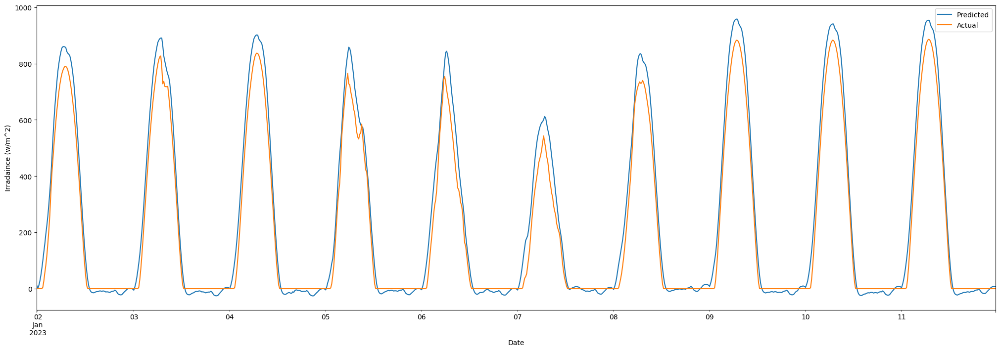

In [ ]:
df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(best_model.predict(X_test_pava))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9815739407052637
Root Mean Sqaured Error 48.85062
Mean Absolute Error 37.84195


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_pava_8, y_train_pava_8, X_test_pava, y_test_pava, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 0.0336 - mae: 0.0782
Epoch 1: val_loss improved from inf to 0.00314, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5
165/165 [==============================] - 41s 155ms/step - loss: 0.0336 - mae: 0.0782 - val_loss: 0.0031 - val_mae: 0.0417
Epoch 2/250
165/165 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.0291
Epoch 2: val_loss improved from 0.00314 to 0.00145, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5
165/165 [==============================] - 23s 139ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0015 - val_mae: 0.0279
Epoch 3/250
165/165 [==============================] - ETA: 0s - loss: 0.0016 - mae: 0.0247
Epoch 3: val_loss improved from 0.00145 to 0.00131, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5


181/181 [==============================] - 5s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

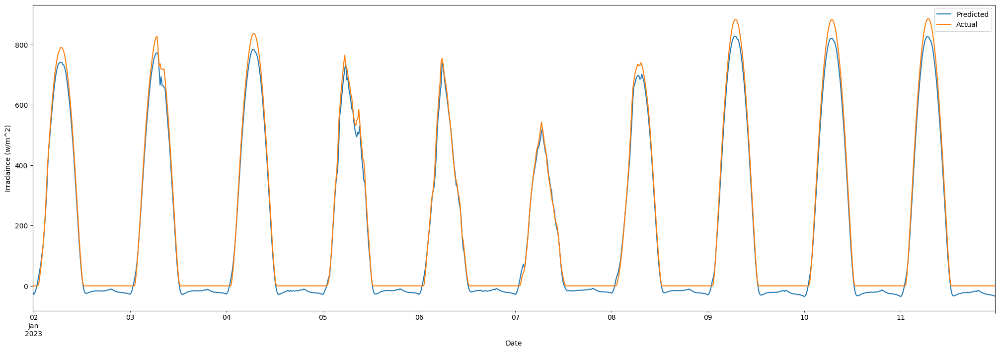

In [ ]:
df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(best_model.predict(X_test_pava))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9865648806386028
Root Mean Sqaured Error 37.756176
Mean Absolute Error 33.62141


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_pava_12, y_train_pava_12, X_test_pava, y_test_pava, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 0.0183 - mae: 0.0575
Epoch 1: val_loss improved from inf to 0.00129, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5
219/219 [==============================] - 40s 143ms/step - loss: 0.0183 - mae: 0.0575 - val_loss: 0.0013 - val_mae: 0.0259
Epoch 2/250
219/219 [==============================] - ETA: 0s - loss: 0.0014 - mae: 0.0230
Epoch 2: val_loss improved from 0.00129 to 0.00101, saving model to /content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/Bi-LSTM/Best_base.h5
219/219 [==============================] - 29s 133ms/step - loss: 0.0014 - mae: 0.0230 - val_loss: 0.0010 - val_mae: 0.0232
Epoch 3/250
219/219 [==============================] - ETA: 0s - loss: 0.0012 - mae: 0.0208
Epoch 3: val_loss did not improve from 0.00101
219/219 [==============================] - 28s 127ms/step - loss: 0.0012 - mae: 0.0208 - val_loss: 0.0012 - val_m

181/181 [==============================] - 4s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

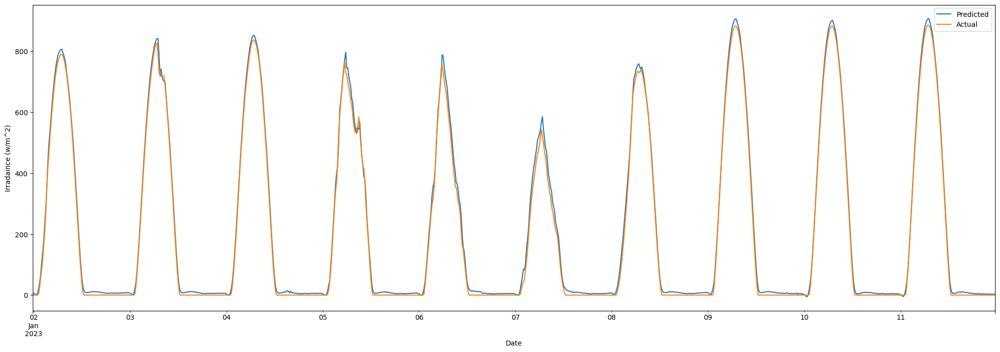

In [ ]:
df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(best_model.predict(X_test_pava))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9986966296807313
Root Mean Sqaured Error 12.260171
Mean Absolute Error 9.22475


## Persistance model

In [ ]:
pava

,PeriodStart,AirTemp,Azimuth,CloudOpacity,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,...,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,sin_hour,cos_hour,Ghi
0,2020-12-31 00:00:00+00:00,20.2,-110,49.1,38.4,88.2,943.2,95,3.4,106,...,0,0,0,0,0,0,1,0.000000,1.000000,0
1,2020-12-31 00:15:00+00:00,20.3,-111,50.9,38.5,87.9,943.4,94,3.4,103,...,0,0,0,0,0,0,1,0.000000,1.000000,0
2,2020-12-31 00:30:00+00:00,20.3,-112,61.1,38.6,87.6,943.6,94,3.3,99,...,0,0,0,0,0,0,1,0.000000,1.000000,0
3,2020-12-31 00:45:00+00:00,20.4,-112,55.7,38.7,87.3,943.8,94,3.3,96,...,0,0,0,0,0,0,1,0.000000,1.000000,0
4,2020-12-31 01:00:00+00:00,20.5,-113,38.2,38.7,86.7,944.0,93,3.4,92,...,0,0,0,0,0,0,1,0.258819,0.965926,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76027,2023-03-02 22:45:00+00:00,18.5,-90,0.0,10.2,48.0,947.7,151,2.1,124,...,0,0,0,0,0,0,0,-0.500000,0.866025,0
76028,2023-03-02 23:00:00+00:00,18.7,-91,0.0,10.2,48.3,947.8,153,2.1,120,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76029,2023-03-02 23:15:00+00:00,19.0,-91,0.0,10.2,48.7,947.9,153,2.1,116,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76030,2023-03-02 23:30:00+00:00,19.3,-92,0.0,10.3,49.1,948.0,154,2.1,113,...,0,0,0,0,0,0,0,-0.258819,0.965926,0


In [ ]:
per_start = "2023-01-01T23:45:00Z"
# Convert the 'PeriodStart' column to a datetime format
# pava['PeriodStart'] = pd.to_datetime(df_pava['PeriodStart'])
df_per_pava =pd.DataFrame()
# Split the data into train and test sets based on the date and time range
df_per_pava = pava[pava['PeriodStart'] > test_start][['PeriodStart','Ghi']]

In [ ]:
df_per_pava

,PeriodStart,Ghi
70176,2023-01-01 00:00:00+00:00,0
70177,2023-01-01 00:15:00+00:00,0
70178,2023-01-01 00:30:00+00:00,0
70179,2023-01-01 00:45:00+00:00,0
70180,2023-01-01 01:00:00+00:00,0
...,...,...
76027,2023-03-02 22:45:00+00:00,0
76028,2023-03-02 23:00:00+00:00,0
76029,2023-03-02 23:15:00+00:00,0
76030,2023-03-02 23:30:00+00:00,0


In [ ]:
import pandas as pd

def persistence_model(data, look_back=1, horizon=1):
    """
    Implementation of the Persistence model for solar irradiance forecasting.
    
    Parameters:
    data (pd.Series): A pandas Series containing the solar irradiance time series data.
    look_back (int): The number of previous time steps to use for the prediction (default: 1).
    horizon (int): The number of time steps ahead to predict (default: 1).
    
    Returns:
    pd.Series: A pandas Series containing the solar irradiance forecast.
    """
    return data.shift(horizon * look_back)

# Load your solar irradiance time series data into a pandas Series
# data = pd.read_csv('your_data_file.csv', index_col='timestamp', parse_dates=True, squeeze=True)

# Example solar irradiance data
data =df_per_pava
# Apply the Persistence model
forecast = persistence_model(data)



In [ ]:
df_per_pava['Forecast']=forecast['Ghi']

<Axes: xlabel='PeriodStart'>

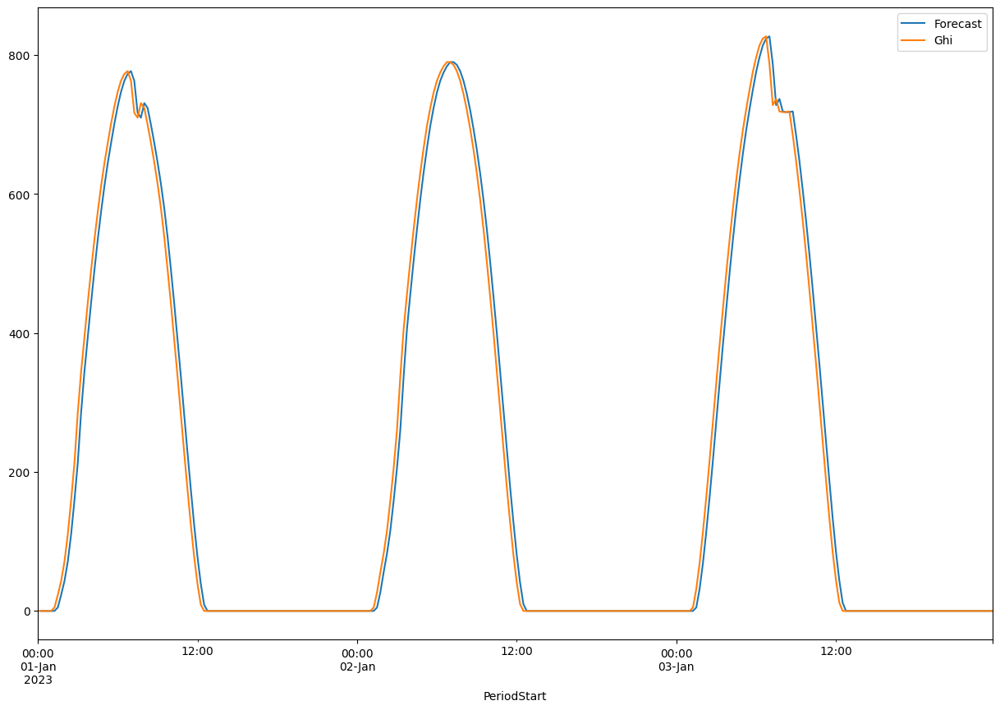

In [ ]:
df_per_pava.set_index('PeriodStart')[['Forecast','Ghi']].iloc[0:96*3].plot(figsize=(15,10))

In [ ]:
df_per_pava.dropna(inplace=True)

In [ ]:
print("r2_Score",r2_score(df_per_pava['Forecast'],df_per_pava['Ghi']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_per_pava['Forecast'],df_per_pava['Ghi'])))
print("Mean Absolute Error",mean_absolute_error(df_per_pava['Forecast'],df_per_pava['Ghi']))

r2_Score 0.9918715537097281
Root Mean Sqaured Error 30.442700021984297
Mean Absolute Error 18.879931682322802


## Transfer_Learning

### S1

#### 4

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_pava_4,y_train_pava_4,X_test_pava,y_test_pava,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S1_4.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 8.3008e-04
Epoch 1: val_loss improved from inf to 0.00028, saving model to /content/drive/MyDrive/Generali

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9979982296548264
Root Mean Sqaured Error 15.610186
Mean Absolute Error 11.69918


Text(0, 0.5, 'Irradiance (W/m^2)')

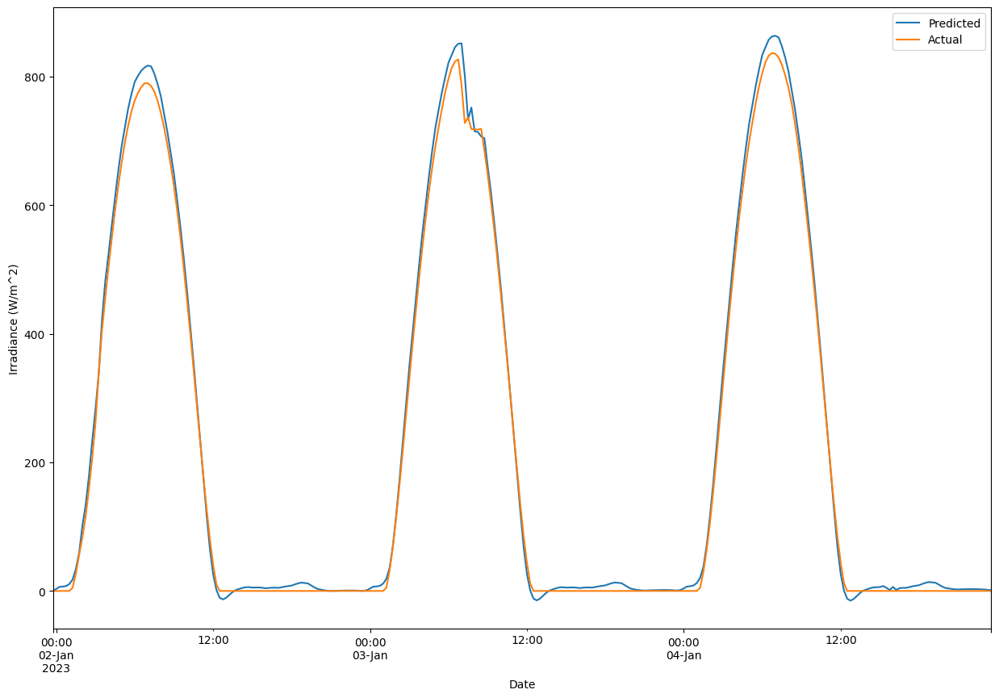

In [ ]:
df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(p3_1.predict(X_test_pava))
print("r2_Score",r2_score(p3_1.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_pava_8,y_train_pava_8,X_test_pava,y_test_pava,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S1_8.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
163/165 [============================>.] - ETA: 0s - loss: 7.2053e-04
Epoch 1: val_loss improved from inf to 0.00039, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9988215722325839
Root Mean Sqaured Error 11.724902
Mean Absolute Error 8.7046


Text(0, 0.5, 'Irradiance (W/m^2)')

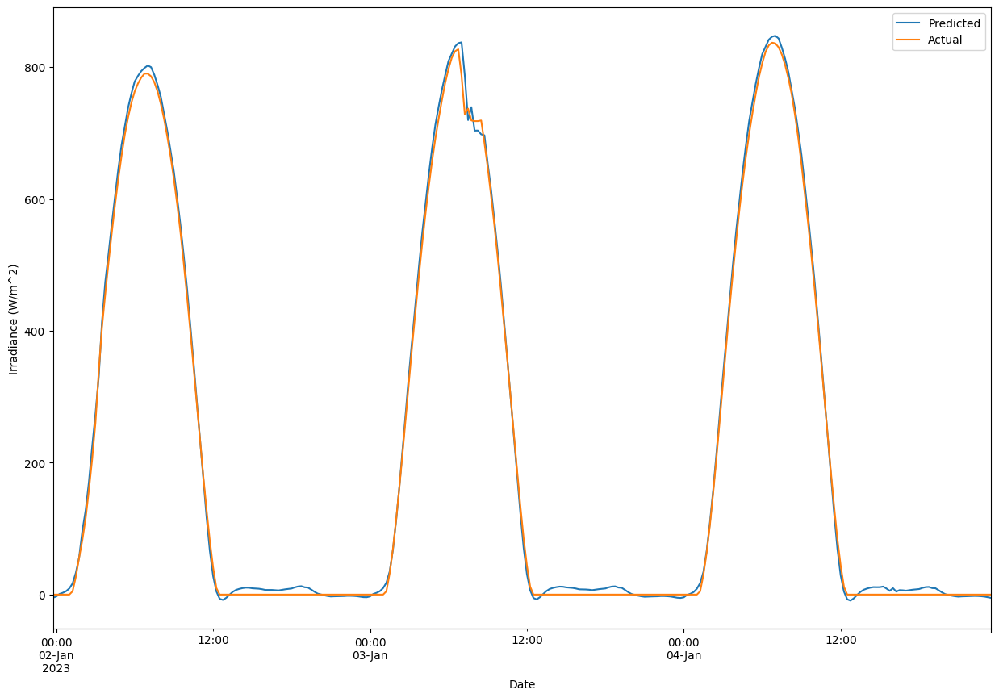

In [ ]:
df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(p3_1.predict(X_test_pava))
print("r2_Score",r2_score(p3_1.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_pava_12,y_train_pava_12,X_test_pava,y_test_pava,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S1_12.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
217/219 [============================>.] - ETA: 0s - loss: 5.6760e-04
Epoch 1: val_loss improved from inf to 0.00036, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9990725062384694
Root Mean Sqaured Error 10.373828
Mean Absolute Error 6.8269587


Text(0, 0.5, 'Irradiance (W/m^2)')

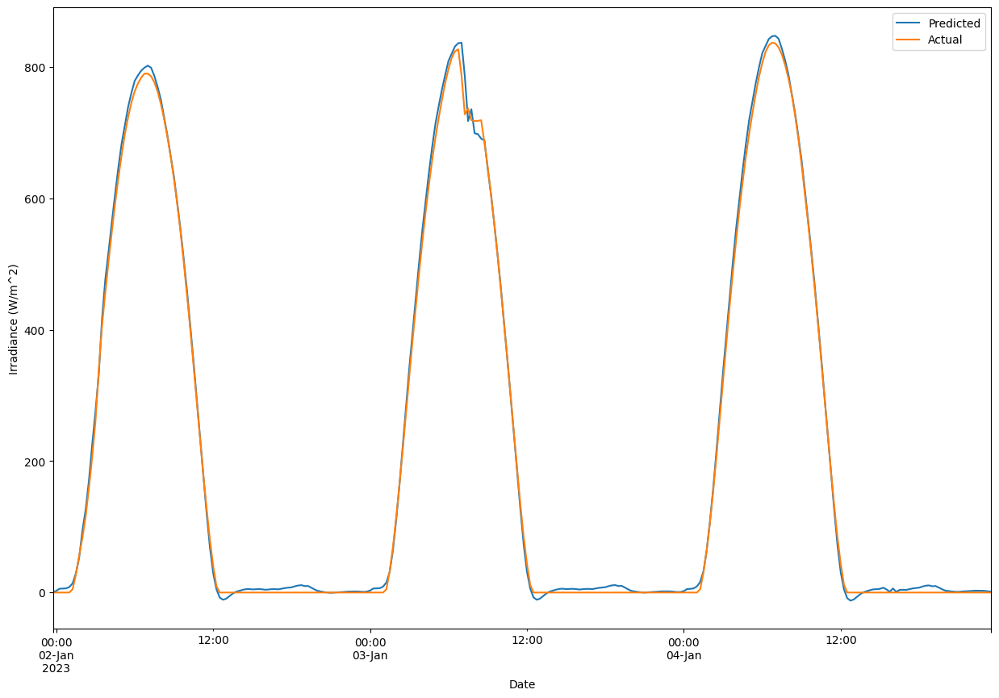

In [ ]:
df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(p3_1.predict(X_test_pava))
print("r2_Score",r2_score(p3_1.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S2

#### 4

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_pava_4,y_train_pava_4,X_test_pava,y_test_pava,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S2_4.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
91/92 [============================>.] - ETA: 0s - loss: 0.0011
Epoch 1: val_loss improved from inf to 0.00044, saving model to /content/drive/MyDrive/Generalizatio

181/181 [==============================] - 1s 8ms/step
r2_Score 0.9981523443954309
Root Mean Sqaured Error 14.478039
Mean Absolute Error 11.34769


Text(0, 0.5, 'Irradiance (W/m^2)')

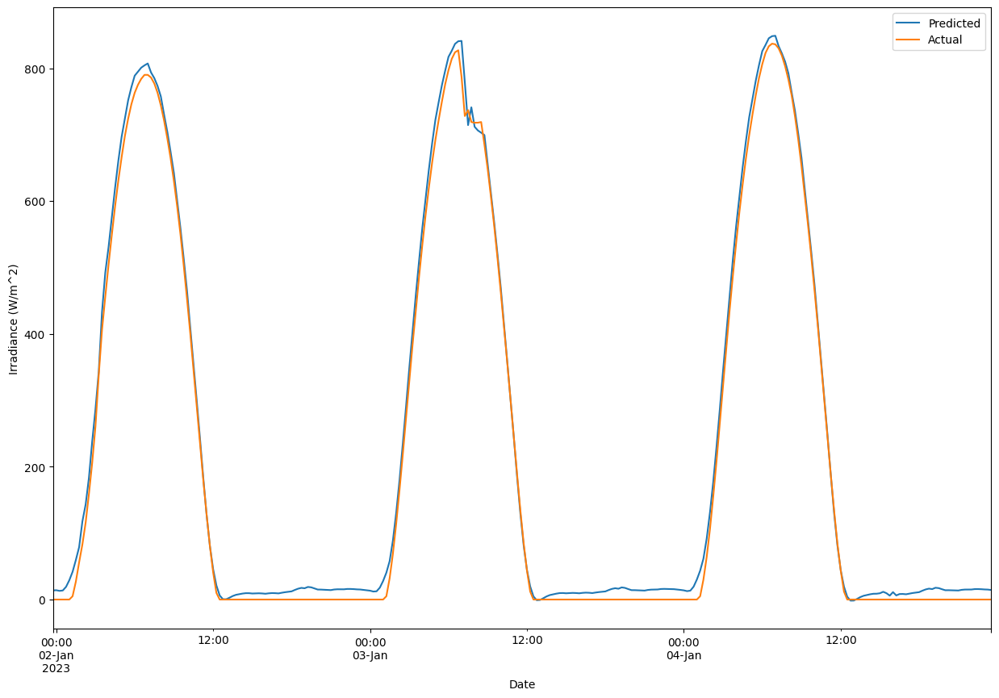

In [ ]:

df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(p3_2.predict(X_test_pava))
print("r2_Score",r2_score(p3_2.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_pava_8,y_train_pava_8,X_test_pava,y_test_pava,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S2_8.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
164/165 [============================>.] - ETA: 0s - loss: 8.7590e-04
Epoch 1: val_loss improved from inf to 0.00035, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9988578354360798
Root Mean Sqaured Error 11.39493
Mean Absolute Error 7.5812926


Text(0, 0.5, 'Irradiance (W/m^2)')

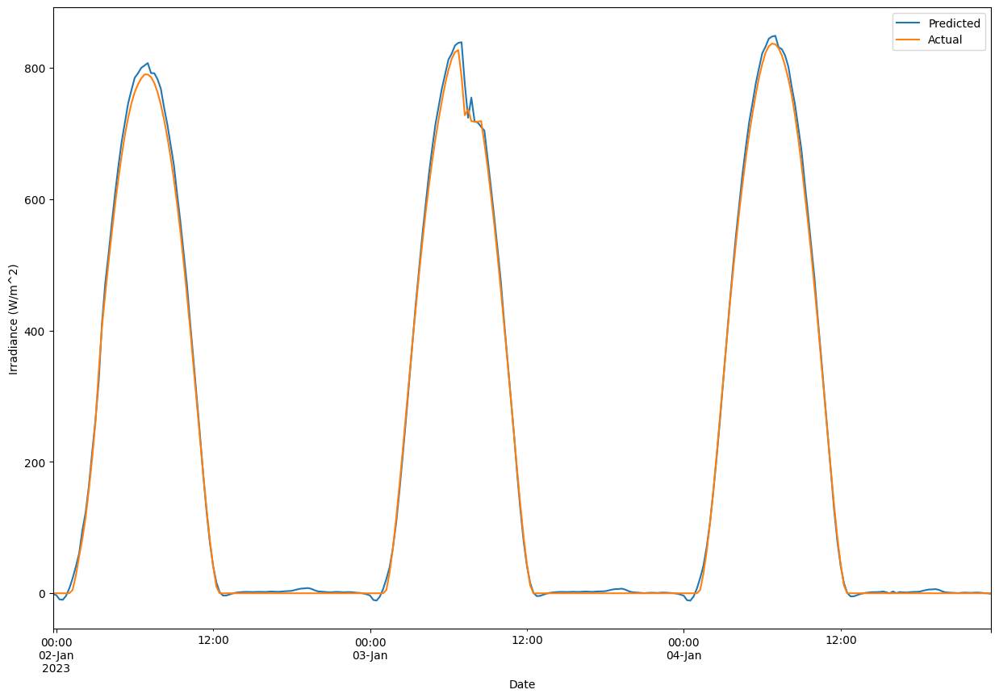

In [ ]:
df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(p3_2.predict(X_test_pava))
print("r2_Score",r2_score(p3_2.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_pava_12,y_train_pava_12,X_test_pava,y_test_pava,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S2_12.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
218/219 [============================>.] - ETA: 0s - loss: 6.6935e-04
Epoch 1: val_loss improved from inf to 0.00031, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 1s 8ms/step
r2_Score 0.9992797328103915
Root Mean Sqaured Error 9.149243
Mean Absolute Error 5.7501087


Text(0, 0.5, 'Irradiance (W/m^2)')

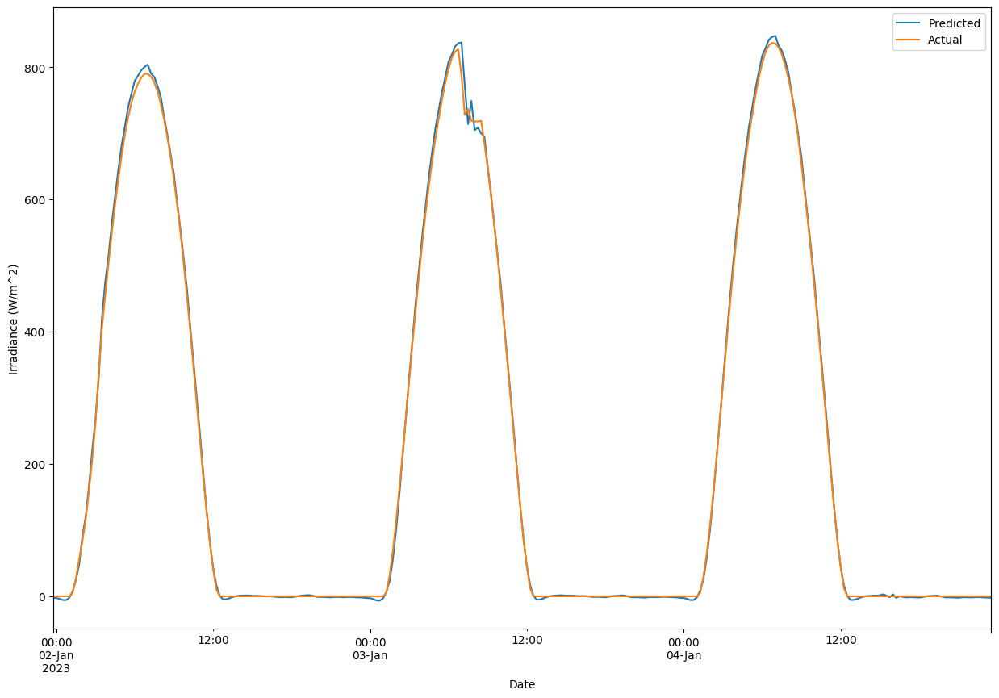

In [ ]:
df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(p3_2.predict(X_test_pava))
print("r2_Score",r2_score(p3_2.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S3

#### 4

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_pava_4,y_train_pava_4,X_test_pava,y_test_pava,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S3_4.h5')

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_______________________________________________

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9923220947374577
Root Mean Sqaured Error 29.875484
Mean Absolute Error 27.1004


Text(0, 0.5, 'Irradiance (W/m^2)')

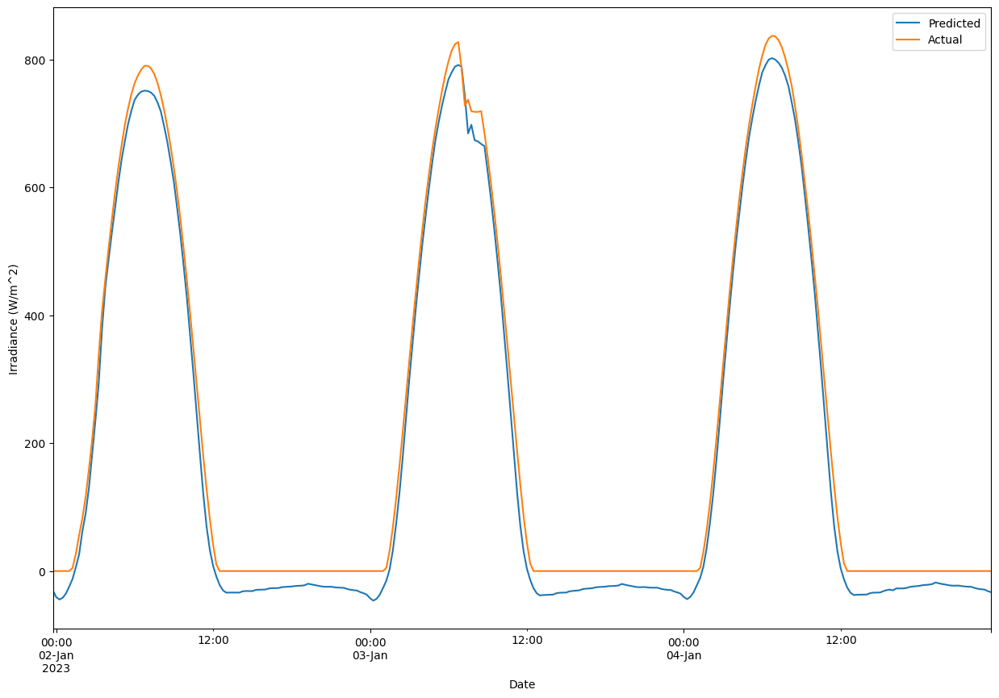

In [ ]:
df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(p3_3.predict(X_test_pava))
print("r2_Score",r2_score(p3_3.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_pava_8,y_train_pava_8,X_test_pava,y_test_pava,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S3_8.h5')

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 1s 8ms/step
r2_Score 0.9986562228158107
Root Mean Sqaured Error 12.497681
Mean Absolute Error 8.685504


Text(0, 0.5, 'Irradiance (W/m^2)')

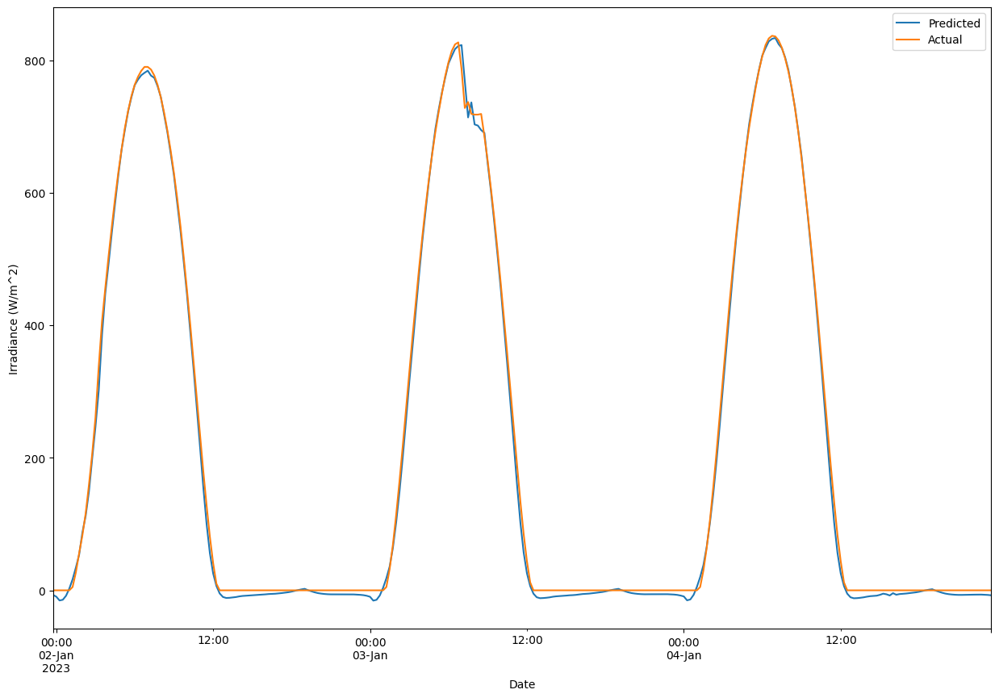

In [ ]:
df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(p3_3.predict(X_test_pava))
print("r2_Score",r2_score(p3_3.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_pava_12,y_train_pava_12,X_test_pava,y_test_pava,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S3_12.h5')

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_6 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 1s 8ms/step
r2_Score 0.9993193008029134
Root Mean Sqaured Error 8.794142
Mean Absolute Error 5.042962


Text(0, 0.5, 'Irradiance (W/m^2)')

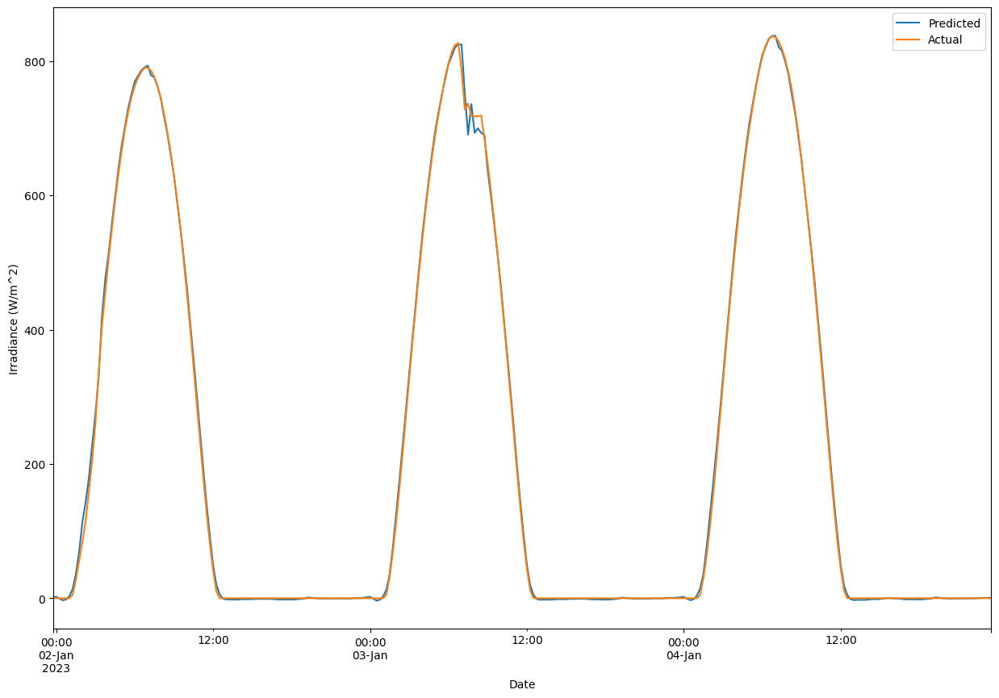

In [ ]:
df_test_date_pava['Actual']=scaler_y_pava.inverse_transform(y_test_pava)
df_test_date_pava['Predicted']=scaler_y_pava.inverse_transform(p3_3.predict(X_test_pava))
print("r2_Score",r2_score(p3_3.predict(X_test_pava),y_test_pava))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pava['Actual'],df_test_date_pava['Predicted']))
df_test_date_pava.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# PHA

## Bi-LSTM

In [ ]:
from tensorflow.keras.layers import Bidirectional, LSTM

class SolarPowerForecastingModel:

    def __init__(self, n_timesteps, n_features, n_outputs,Model=None):
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = Model
        
    def build_model(self):
        self.model = Sequential()
        self.model.add(Bidirectional(LSTM(units=640,return_sequences=True,input_shape=(self.n_timesteps, self.n_features))))
        self.model.add(Bidirectional(LSTM(units=64)))
        self.model.add(Dense(self.n_outputs))
        self.model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.001), metrics=['mae'])
        return self.model
    def train_model(self, X_train, y_train, X_test, y_test, epochs, batch_size):
        mc = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/Bi-LSTM/Best_base.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=2, mode='min', restore_best_weights=True)
        self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[early_stopping,mc])

    def load_trained_model(self, path):
        self.model = load_model(path)

    def save_trained_model(self, path):
        self.model.save(path)
    
    def predict(self, X):
        return self.model.predict(X)


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_pha_4, y_train_pha_4, X_test_pha, y_test_pha, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0508 - mae: 0.1001
Epoch 1: val_loss improved from inf to 0.00192, saving model to /content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/Bi-LSTM/Best_base.h5
92/92 [==============================] - 27s 147ms/step - loss: 0.0508 - mae: 0.1001 - val_loss: 0.0019 - val_mae: 0.0352
Epoch 2/250
92/92 [==============================] - ETA: 0s - loss: 0.0019 - mae: 0.0259
Epoch 2: val_loss did not improve from 0.00192
92/92 [==============================] - 11s 124ms/step - loss: 0.0019 - mae: 0.0259 - val_loss: 0.0024 - val_mae: 0.0423
Epoch 3/250
92/92 [==============================] - ETA: 0s - loss: 0.0015 - mae: 0.0209
Epoch 3: val_loss improved from 0.00192 to 0.00166, saving model to /content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/Bi-LSTM/Best_base.h5
92/92 [==============================] - 12s 127ms/step - loss: 0.0015 - mae: 0.0209 - val_loss: 0.0017 - val_mae: 0.0347
Epo

181/181 [==============================] - 4s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

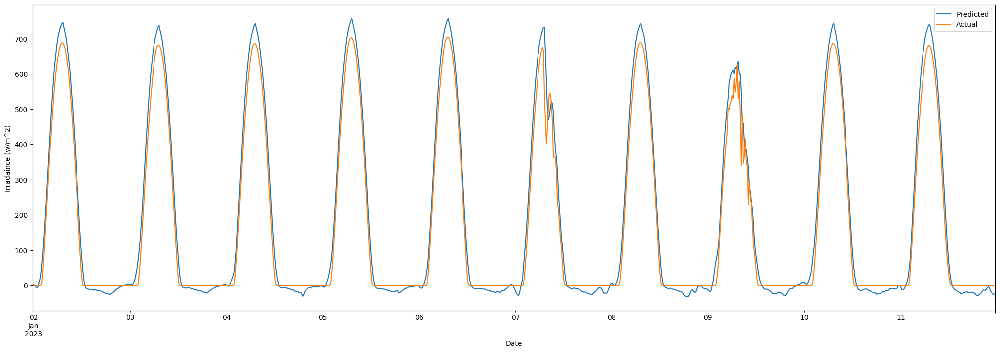

In [ ]:
df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(best_model.predict(X_test_pha))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9784183358826515
Root Mean Sqaured Error 45.12606
Mean Absolute Error 35.633255


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_pha_8, y_train_pha_8, X_test_pha, y_test_pha, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.0699
Epoch 1: val_loss improved from inf to 0.00097, saving model to /content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/Bi-LSTM/Best_base.h5
165/165 [==============================] - 32s 151ms/step - loss: 0.0292 - mae: 0.0699 - val_loss: 9.7435e-04 - val_mae: 0.0237
Epoch 2/250
165/165 [==============================] - ETA: 0s - loss: 0.0016 - mae: 0.0228
Epoch 2: val_loss improved from 0.00097 to 0.00085, saving model to /content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/Bi-LSTM/Best_base.h5
165/165 [==============================] - 23s 137ms/step - loss: 0.0016 - mae: 0.0228 - val_loss: 8.5413e-04 - val_mae: 0.0235
Epoch 3/250
165/165 [==============================] - ETA: 0s - loss: 0.0012 - mae: 0.0197
Epoch 3: val_loss improved from 0.00085 to 0.00065, saving model to /content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/Bi-LSTM/Best_bas

181/181 [==============================] - 5s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

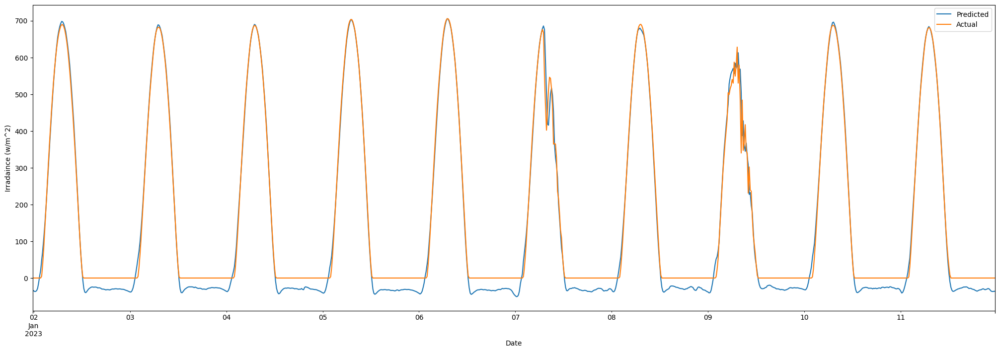

In [ ]:
df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(best_model.predict(X_test_pha))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9909577652571476
Root Mean Sqaured Error 27.74329
Mean Absolute Error 22.436842


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_pha_12, y_train_pha_12, X_test_pha, y_test_pha, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 0.0239 - mae: 0.0595
Epoch 1: val_loss improved from inf to 0.00091, saving model to /content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/Bi-LSTM/Best_base.h5
219/219 [==============================] - 39s 143ms/step - loss: 0.0239 - mae: 0.0595 - val_loss: 9.0575e-04 - val_mae: 0.0239
Epoch 2/250
219/219 [==============================] - ETA: 0s - loss: 0.0013 - mae: 0.0206
Epoch 2: val_loss improved from 0.00091 to 0.00087, saving model to /content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/Bi-LSTM/Best_base.h5
219/219 [==============================] - 29s 133ms/step - loss: 0.0013 - mae: 0.0206 - val_loss: 8.6975e-04 - val_mae: 0.0209
Epoch 3/250
219/219 [==============================] - ETA: 0s - loss: 9.7926e-04 - mae: 0.0179
Epoch 3: val_loss did not improve from 0.00087
219/219 [==============================] - 28s 127ms/step - loss: 9.7926e-04 - mae: 0.0179 - val_loss: 

181/181 [==============================] - 5s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

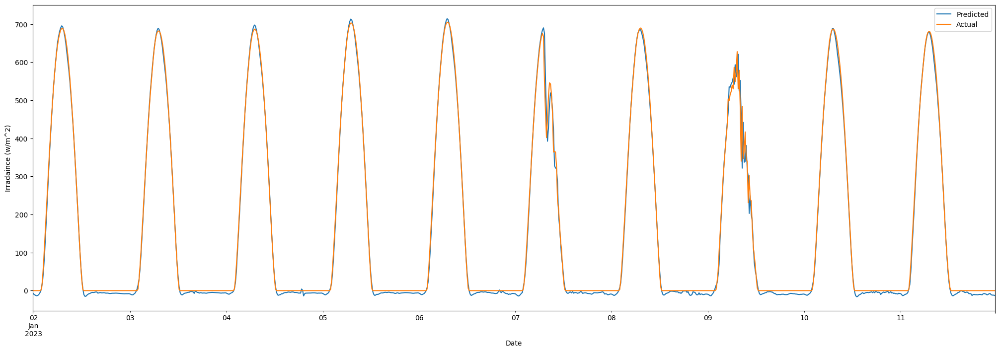

In [ ]:
df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(best_model.predict(X_test_pha))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9970580158327682
Root Mean Sqaured Error 15.03965
Mean Absolute Error 8.93921


## Persistance model

In [ ]:
pha

,PeriodStart,AirTemp,Azimuth,CloudOpacity,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,...,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,sin_hour,cos_hour,Ghi
0,2020-12-31 00:00:00+00:00,5.4,-105,3.0,6.5,80.4,995.8,62,3.1,114,...,0,0,0,0,0,0,1,0.000000,1.000000,0
1,2020-12-31 00:15:00+00:00,5.4,-106,3.0,6.5,80.2,995.8,63,3.1,111,...,0,0,0,0,0,0,1,0.000000,1.000000,0
2,2020-12-31 00:30:00+00:00,5.3,-107,3.0,6.5,80.1,995.8,65,3.1,108,...,0,0,0,0,0,0,1,0.000000,1.000000,0
3,2020-12-31 00:45:00+00:00,5.3,-109,3.0,6.6,79.9,995.8,66,3.0,105,...,0,0,0,0,0,0,1,0.000000,1.000000,0
4,2020-12-31 01:00:00+00:00,5.3,-110,7.7,6.6,79.9,995.9,68,3.0,102,...,0,0,0,0,0,0,1,0.258819,0.965926,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76027,2023-03-02 22:45:00+00:00,20.2,-78,11.8,25.0,69.2,995.7,32,4.4,127,...,0,0,0,0,0,0,0,-0.500000,0.866025,0
76028,2023-03-02 23:00:00+00:00,20.0,-80,14.5,24.9,69.5,995.8,31,4.3,124,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76029,2023-03-02 23:15:00+00:00,20.0,-83,14.5,24.9,69.9,995.8,31,4.3,120,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76030,2023-03-02 23:30:00+00:00,19.8,-84,13.1,24.8,70.4,995.9,30,4.3,117,...,0,0,0,0,0,0,0,-0.258819,0.965926,0


In [ ]:
per_start = "2023-01-01T23:45:00Z"
# Convert the 'PeriodStart' column to a datetime format
# sak['PeriodStart'] = pd.to_datetime(df_sak['PeriodStart'])
df_per_pha =pd.DataFrame()
# Split the data into train and test sets based on the date and time range
df_per_pha = pha[pha['PeriodStart'] > test_start][['PeriodStart','Ghi']]

In [ ]:
df_per_pha

,PeriodStart,Ghi
70176,2023-01-01 00:00:00+00:00,0
70177,2023-01-01 00:15:00+00:00,0
70178,2023-01-01 00:30:00+00:00,0
70179,2023-01-01 00:45:00+00:00,0
70180,2023-01-01 01:00:00+00:00,0
...,...,...
76027,2023-03-02 22:45:00+00:00,0
76028,2023-03-02 23:00:00+00:00,0
76029,2023-03-02 23:15:00+00:00,0
76030,2023-03-02 23:30:00+00:00,0


In [ ]:
import pandas as pd

def persistence_model(data, look_back=1, horizon=1):
    """
    Implementation of the Persistence model for solar irradiance forecasting.
    
    Parameters:
    data (pd.Series): A pandas Series containing the solar irradiance time series data.
    look_back (int): The number of previous time steps to use for the prediction (default: 1).
    horizon (int): The number of time steps ahead to predict (default: 1).
    
    Returns:
    pd.Series: A pandas Series containing the solar irradiance forecast.
    """
    return data.shift(horizon * look_back)

# Load your solar irradiance time series data into a pandas Series
# data = pd.read_csv('your_data_file.csv', index_col='timestamp', parse_dates=True, squeeze=True)

# Example solar irradiance data
data =df_per_pha
# Apply the Persistence model
forecast = persistence_model(data)



In [ ]:
df_per_pha['Forecast']=forecast['Ghi']

<Axes: xlabel='PeriodStart'>

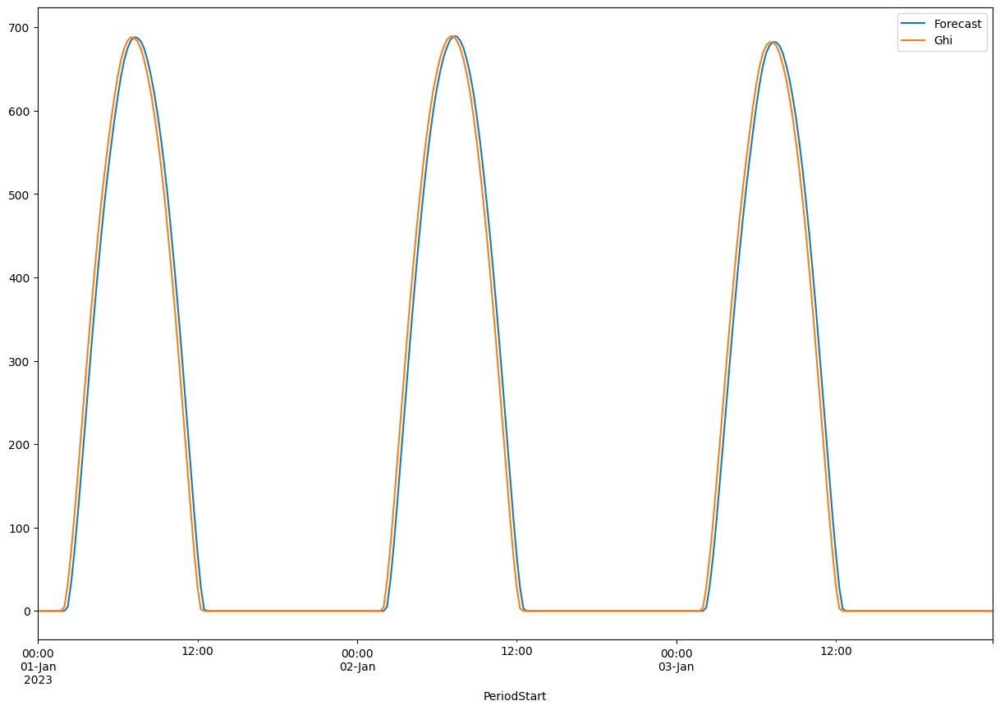

In [ ]:
df_per_pha.set_index('PeriodStart')[['Forecast','Ghi']].iloc[0:96*3].plot(figsize=(15,10))

In [ ]:
df_per_pha.dropna(inplace=True)

In [ ]:
print("r2_Score",r2_score(df_per_pha['Forecast'],df_per_pha['Ghi']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_per_pha['Forecast'],df_per_pha['Ghi'])))
print("Mean Absolute Error",mean_absolute_error(df_per_pha['Forecast'],df_per_pha['Ghi']))

r2_Score 0.98985136348669
Root Mean Sqaured Error 27.763568089598206
Mean Absolute Error 16.155764304013662


## Transfer_Learning

### S1

#### 4

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_pha_4,y_train_pha_4,X_test_pha,y_test_pha,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/S1_4.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 5.7541e-04
Epoch 1: val_loss improved from inf to 0.00014, saving model to /content/drive/MyDrive/Generali

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9968180367185638
Root Mean Sqaured Error 15.45105
Mean Absolute Error 9.036199


Text(0, 0.5, 'Irradiance (W/m^2)')

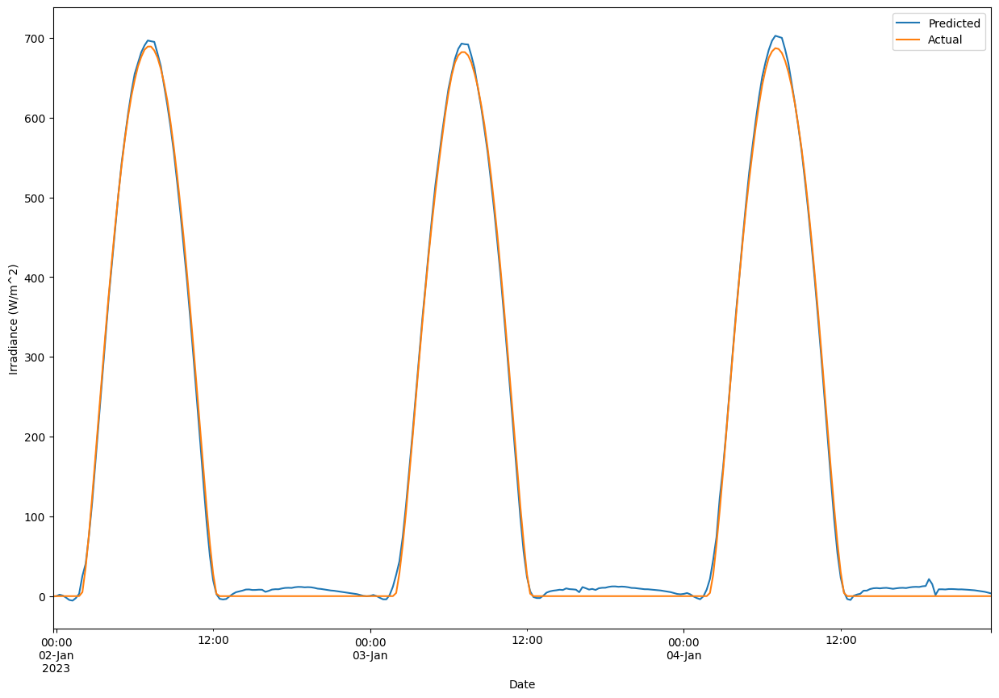

In [ ]:
df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(p3_1.predict(X_test_pha))
print("r2_Score",r2_score(p3_1.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_pha_8,y_train_pha_8,X_test_pha,y_test_pha,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/S1_8.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 6.0421e-04
Epoch 1: val_loss improved from inf to 0.00011, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9956867036634965
Root Mean Sqaured Error 17.998991
Mean Absolute Error 12.185733


Text(0, 0.5, 'Irradiance (W/m^2)')

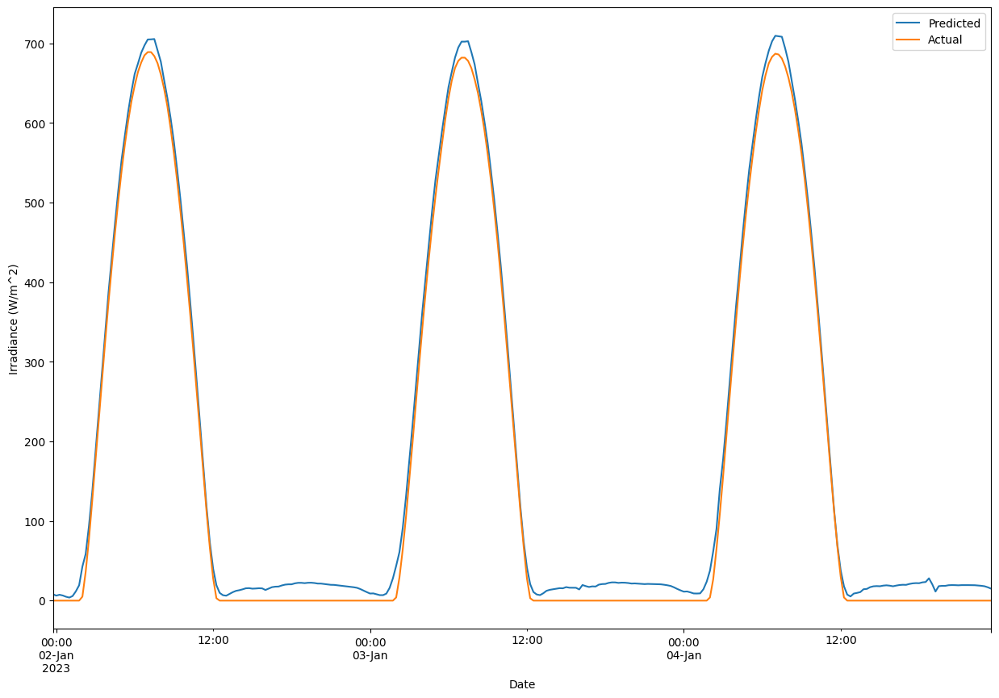

In [ ]:
df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(p3_1.predict(X_test_pha))
print("r2_Score",r2_score(p3_1.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_pha_12,y_train_pha_12,X_test_pha,y_test_pha,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/S1_12.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
218/219 [============================>.] - ETA: 0s - loss: 4.9290e-04
Epoch 1: val_loss improved from inf to 0.00011, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9968482918730054
Root Mean Sqaured Error 15.279156
Mean Absolute Error 8.804029


Text(0, 0.5, 'Irradiance (W/m^2)')

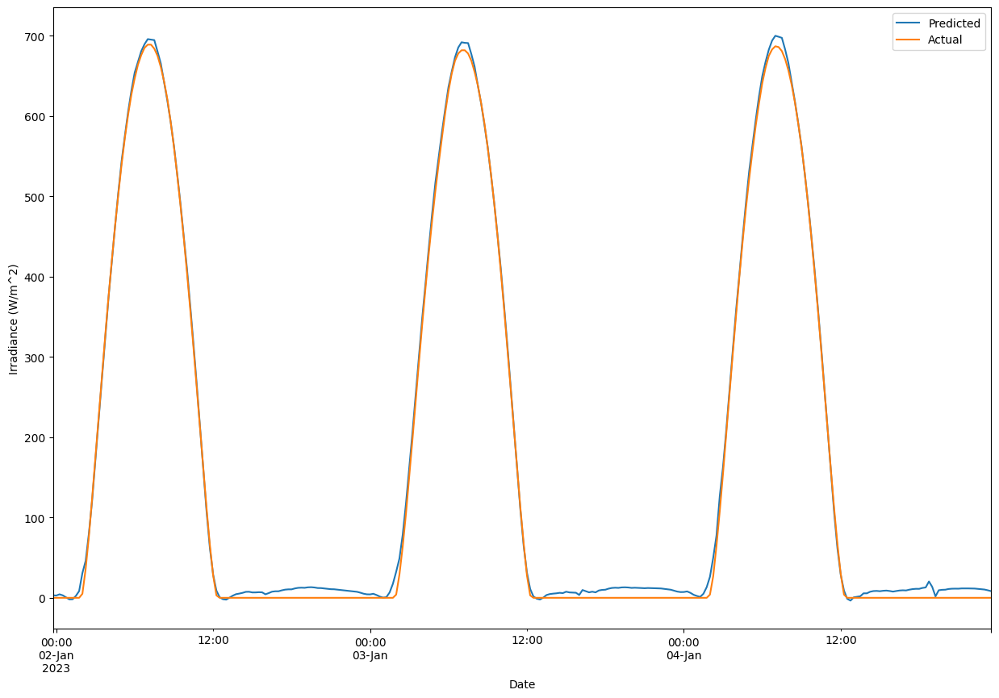

In [ ]:
df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(p3_1.predict(X_test_pha))
print("r2_Score",r2_score(p3_1.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S2

#### 4

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_pha_4,y_train_pha_4,X_test_pha,y_test_pha,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/S2_4.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 7.9602e-04
Epoch 1: val_loss improved from inf to 0.00016, saving model to /content/drive/MyDrive/Generaliz

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9974006145958555
Root Mean Sqaured Error 14.183295
Mean Absolute Error 6.8628955


Text(0, 0.5, 'Irradiance (W/m^2)')

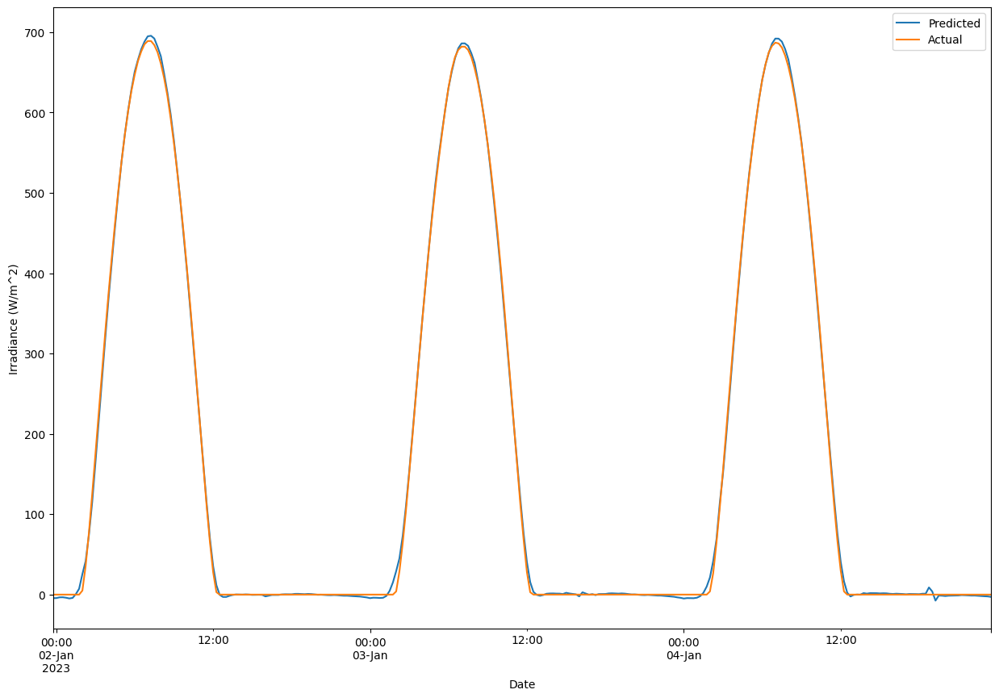

In [ ]:

df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(p3_2.predict(X_test_pha))
print("r2_Score",r2_score(p3_2.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_pha_8,y_train_pha_8,X_test_pha,y_test_pha,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/S2_8.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
164/165 [============================>.] - ETA: 0s - loss: 6.8206e-04
Epoch 1: val_loss improved from inf to 0.00018, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9970506304461841
Root Mean Sqaured Error 14.917859
Mean Absolute Error 8.383604


Text(0, 0.5, 'Irradiance (W/m^2)')

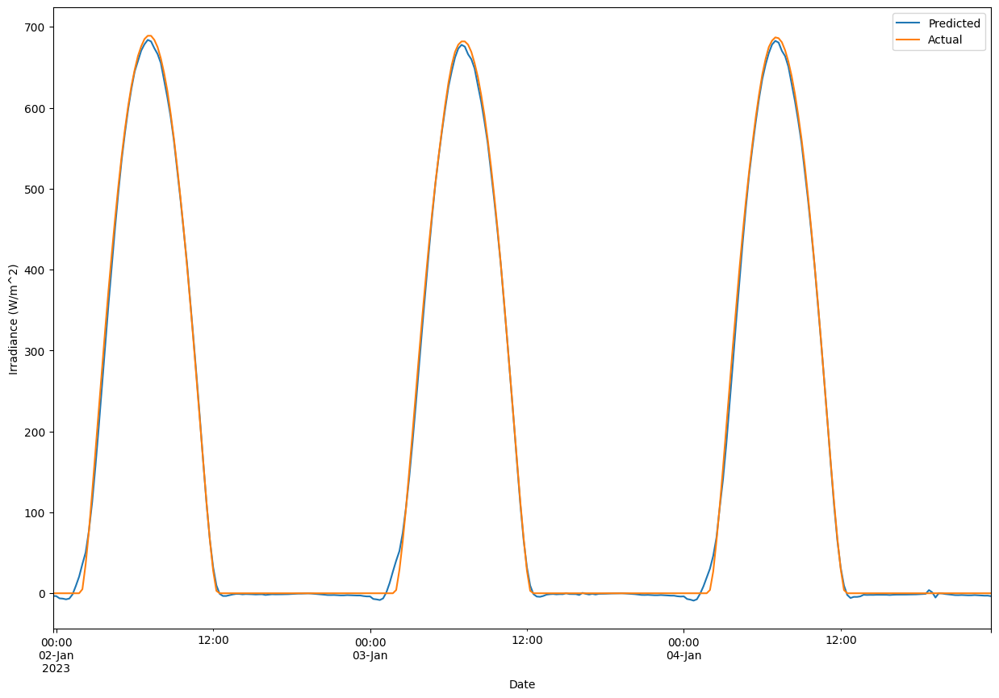

In [ ]:
df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(p3_2.predict(X_test_pha))
print("r2_Score",r2_score(p3_2.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_pha_12,y_train_pha_12,X_test_pha,y_test_pha,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/S2_12.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 5.5568e-04
Epoch 1: val_loss improved from inf to 0.00011, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 3s 14ms/step
r2_Score 0.9973994950568437
Root Mean Sqaured Error 14.129503
Mean Absolute Error 6.6150274


Text(0, 0.5, 'Irradiance (W/m^2)')

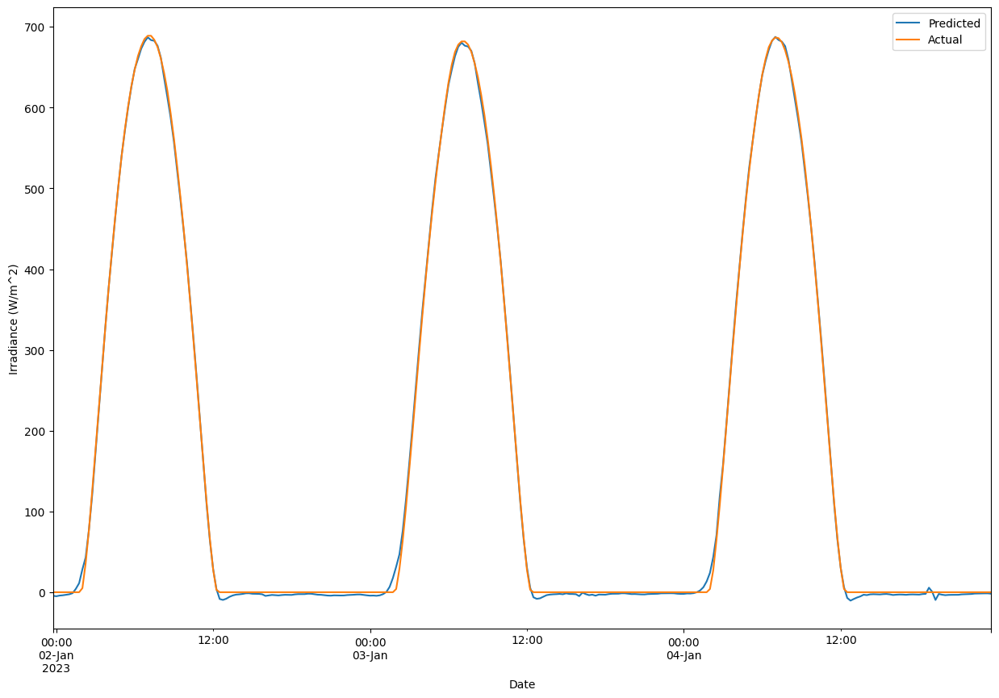

In [ ]:
df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(p3_2.predict(X_test_pha))
print("r2_Score",r2_score(p3_2.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S3

#### 4

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_pha_4,y_train_pha_4,X_test_pha,y_test_pha,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/S3_4.h5')

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_______________________________________________

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9925825029520042
Root Mean Sqaured Error 24.218906
Mean Absolute Error 18.267246


Text(0, 0.5, 'Irradiance (W/m^2)')

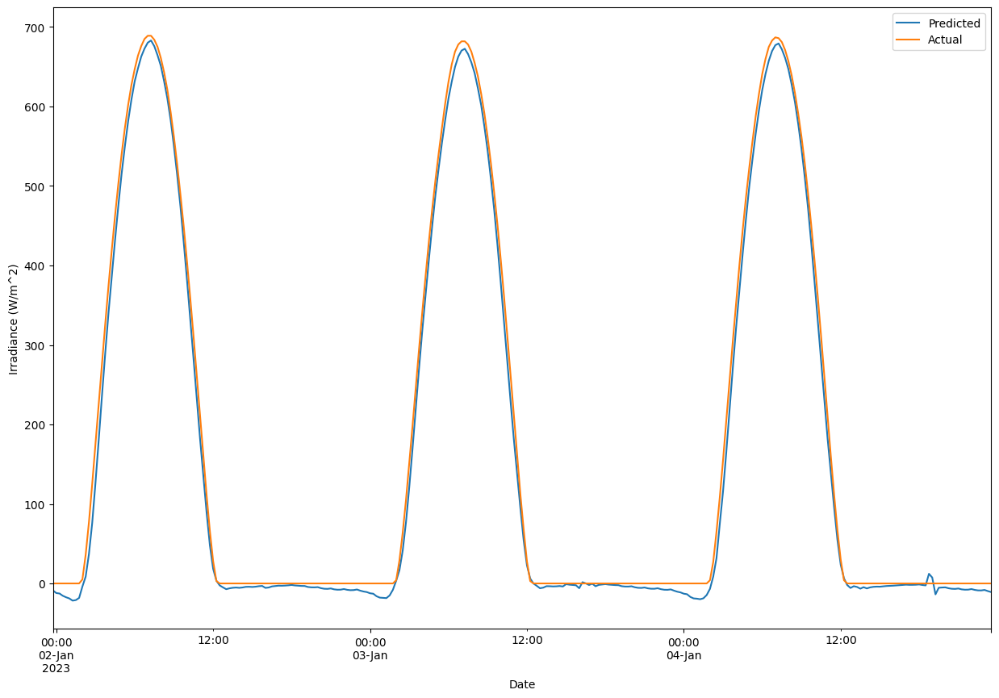

In [ ]:
df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(p3_3.predict(X_test_pha))
print("r2_Score",r2_score(p3_3.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_pha_8,y_train_pha_8,X_test_pha,y_test_pha,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/S3_8.h5')

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9910126802867284
Root Mean Sqaured Error 27.2013
Mean Absolute Error 18.572102


Text(0, 0.5, 'Irradiance (W/m^2)')

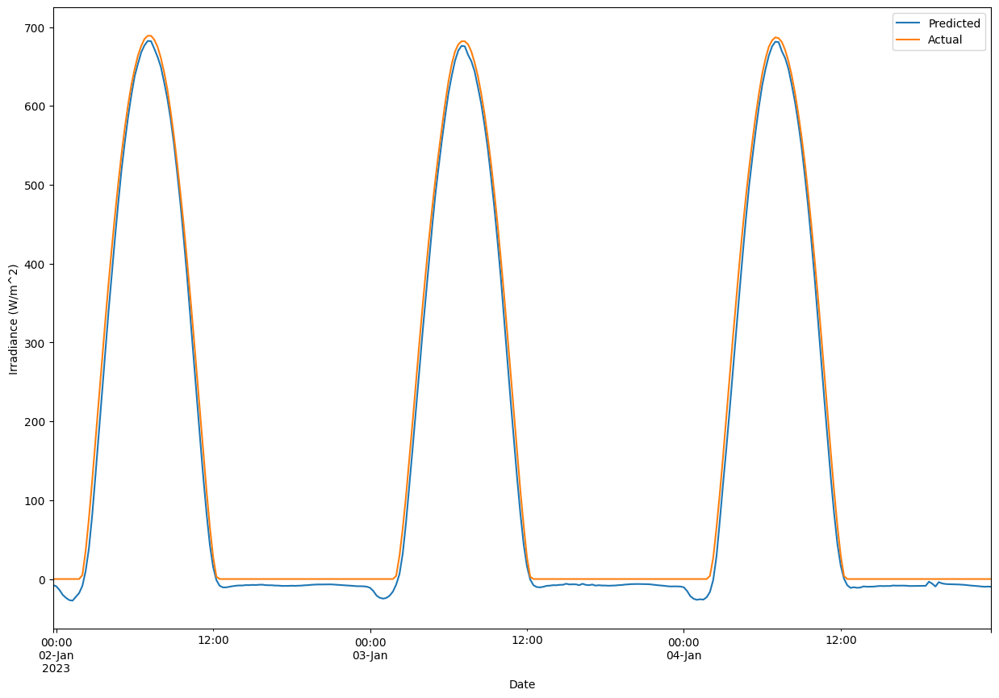

In [ ]:
df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(p3_3.predict(X_test_pha))
print("r2_Score",r2_score(p3_3.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_pha_12,y_train_pha_12,X_test_pha,y_test_pha,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/S3_12.h5')

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/S3_12.h5')

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9974527873199568
Root Mean Sqaured Error 13.8983
Mean Absolute Error 6.6201234


Text(0, 0.5, 'Irradiance (W/m^2)')

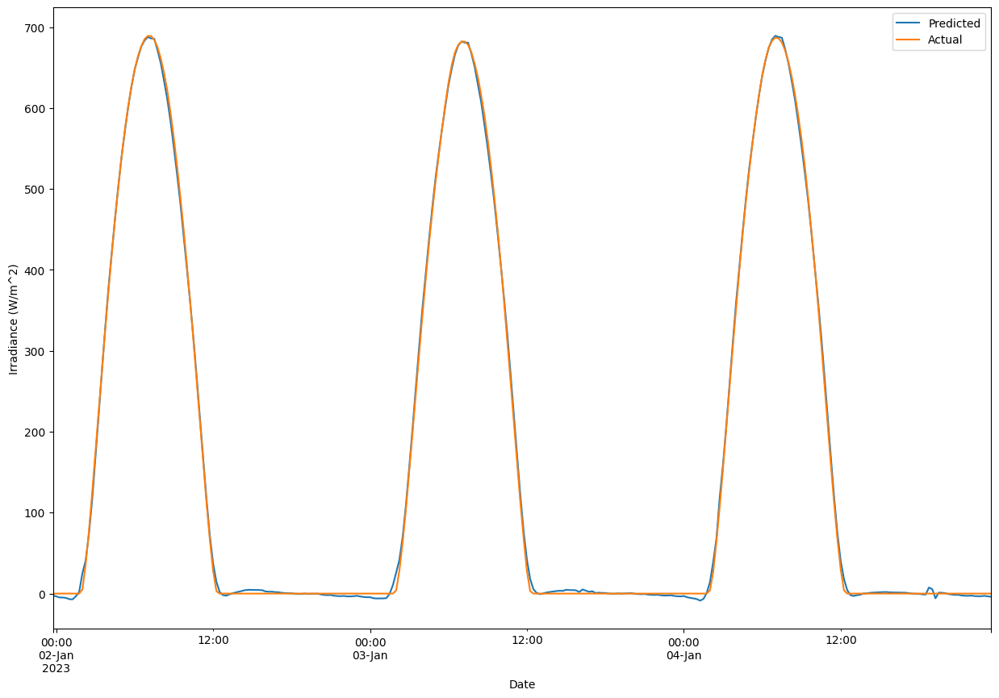

In [ ]:
df_test_date_pha['Actual']=scaler_y_pha.inverse_transform(y_test_pha)
df_test_date_pha['Predicted']=scaler_y_pha.inverse_transform(p3_3.predict(X_test_pha))
print("r2_Score",r2_score(p3_3.predict(X_test_pha),y_test_pha))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_pha['Actual'],df_test_date_pha['Predicted']))
df_test_date_pha.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# Rew

## Bi-LSTM

In [ ]:
from tensorflow.keras.layers import Bidirectional, LSTM

class SolarPowerForecastingModel:

    def __init__(self, n_timesteps, n_features, n_outputs,Model=None):
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = Model
        
    def build_model(self):
        self.model = Sequential()
        self.model.add(Bidirectional(LSTM(units=640,return_sequences=True,input_shape=(self.n_timesteps, self.n_features))))
        self.model.add(Bidirectional(LSTM(units=64)))
        self.model.add(Dense(self.n_outputs))
        self.model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.001), metrics=['mae'])
        return self.model
    def train_model(self, X_train, y_train, X_test, y_test, epochs, batch_size):
        mc = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/Bi-LSTM/Best_base.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=2, mode='min', restore_best_weights=True)
        self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[early_stopping,mc])

    def load_trained_model(self, path):
        self.model = load_model(path)

    def save_trained_model(self, path):
        self.model.save(path)
    
    def predict(self, X):
        return self.model.predict(X)


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_rew_4, y_train_rew_4, X_test_rew, y_test_rew, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0626 - mae: 0.1117
Epoch 1: val_loss improved from inf to 0.00565, saving model to /content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/Bi-LSTM/Best_base.h5
92/92 [==============================] - 27s 144ms/step - loss: 0.0626 - mae: 0.1117 - val_loss: 0.0057 - val_mae: 0.0693
Epoch 2/250
92/92 [==============================] - ETA: 0s - loss: 0.0031 - mae: 0.0351
Epoch 2: val_loss improved from 0.00565 to 0.00338, saving model to /content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/Bi-LSTM/Best_base.h5
92/92 [==============================] - 12s 133ms/step - loss: 0.0031 - mae: 0.0351 - val_loss: 0.0034 - val_mae: 0.0532
Epoch 3/250
92/92 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.0290
Epoch 3: val_loss did not improve from 0.00338
92/92 [==============================] - 11s 122ms/step - loss: 0.0024 - mae: 0.0290 - val_loss: 0.0034 - val_mae: 0.05

181/181 [==============================] - 4s 17ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

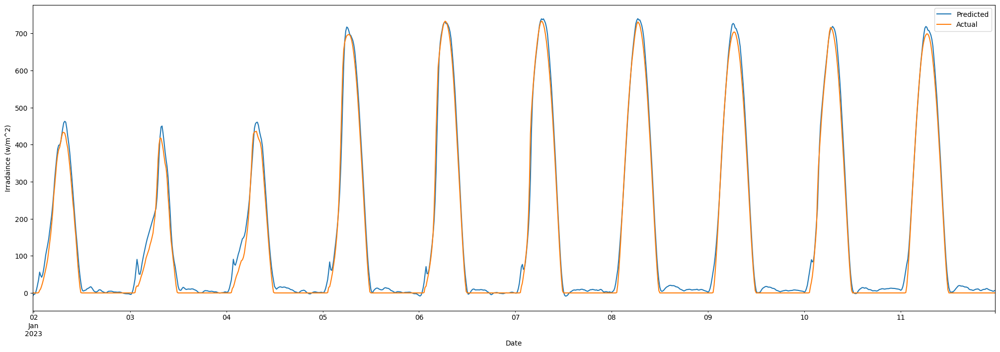

In [ ]:
df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(best_model.predict(X_test_rew))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.99177376284229
Root Mean Sqaured Error 25.124735
Mean Absolute Error 16.549332


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_rew_8, y_train_rew_8, X_test_rew, y_test_rew, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 0.0387 - mae: 0.0832
Epoch 1: val_loss improved from inf to 0.00135, saving model to /content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/Bi-LSTM/Best_base.h5
165/165 [==============================] - 32s 153ms/step - loss: 0.0387 - mae: 0.0832 - val_loss: 0.0013 - val_mae: 0.0292
Epoch 2/250
165/165 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.0314
Epoch 2: val_loss improved from 0.00135 to 0.00082, saving model to /content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/Bi-LSTM/Best_base.h5
165/165 [==============================] - 23s 139ms/step - loss: 0.0028 - mae: 0.0314 - val_loss: 8.1759e-04 - val_mae: 0.0234
Epoch 3/250
165/165 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.0273
Epoch 3: val_loss improved from 0.00082 to 0.00081, saving model to /content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/Bi-LSTM/Bes

181/181 [==============================] - 5s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

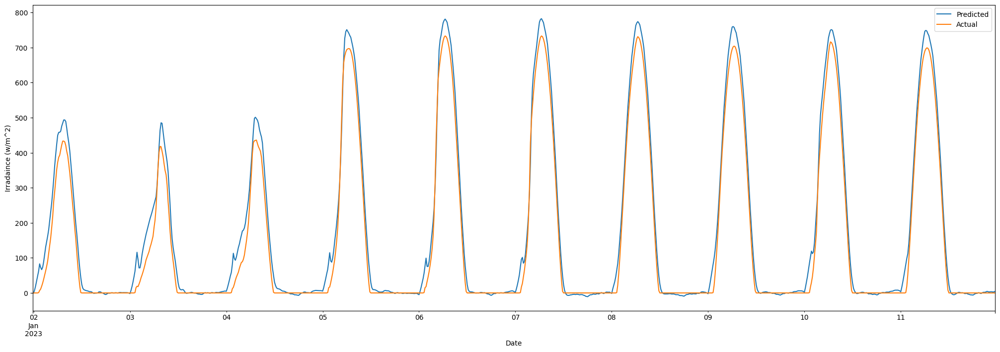

In [ ]:
df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(best_model.predict(X_test_rew))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9813096971799802
Root Mean Sqaured Error 38.61246
Mean Absolute Error 29.809114


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_rew_12, y_train_rew_12, X_test_rew, y_test_rew, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 0.0235 - mae: 0.0639
Epoch 1: val_loss improved from inf to 0.00216, saving model to /content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/Bi-LSTM/Best_base.h5
219/219 [==============================] - 39s 143ms/step - loss: 0.0235 - mae: 0.0639 - val_loss: 0.0022 - val_mae: 0.0357
Epoch 2/250
219/219 [==============================] - ETA: 0s - loss: 0.0020 - mae: 0.0260
Epoch 2: val_loss improved from 0.00216 to 0.00148, saving model to /content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/Bi-LSTM/Best_base.h5
219/219 [==============================] - 29s 134ms/step - loss: 0.0020 - mae: 0.0260 - val_loss: 0.0015 - val_mae: 0.0291
Epoch 3/250
219/219 [==============================] - ETA: 0s - loss: 0.0015 - mae: 0.0223
Epoch 3: val_loss improved from 0.00148 to 0.00121, saving model to /content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/Bi-LSTM/Best_ba

181/181 [==============================] - 5s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

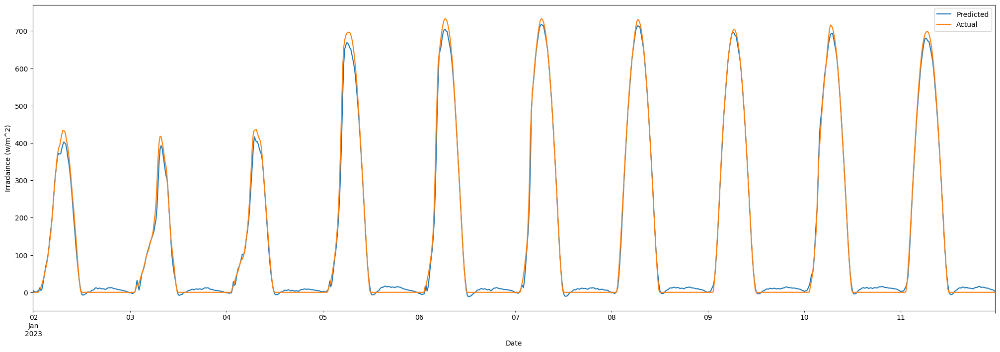

In [ ]:
df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(best_model.predict(X_test_rew))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))

181/181 [==============================] - 3s 17ms/step
r2_Score 0.996580496633684
Root Mean Sqaured Error 15.855062
Mean Absolute Error 9.778081


## Persistance model

In [ ]:
rew

,PeriodStart,AirTemp,Azimuth,CloudOpacity,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,...,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,sin_hour,cos_hour,Ghi
0,2020-12-31 00:00:00+00:00,12.8,-109,0.0,15.9,66.8,977.0,325,1.2,106,...,0,0,0,0,0,0,1,0.000000,1.000000,0
1,2020-12-31 00:15:00+00:00,12.8,-110,0.0,15.9,66.7,977.1,325,1.2,102,...,0,0,0,0,0,0,1,0.000000,1.000000,0
2,2020-12-31 00:30:00+00:00,12.8,-111,0.0,15.8,66.6,977.2,325,1.2,99,...,0,0,0,0,0,0,1,0.000000,1.000000,0
3,2020-12-31 00:45:00+00:00,12.8,-113,6.7,15.8,66.5,977.3,325,1.2,96,...,0,0,0,0,0,0,1,0.000000,1.000000,0
4,2020-12-31 01:00:00+00:00,12.7,-114,17.2,15.7,66.8,977.5,325,1.2,93,...,0,0,0,0,0,0,1,0.258819,0.965926,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76027,2023-03-02 22:45:00+00:00,18.9,-85,0.0,16.8,72.4,977.6,276,0.9,119,...,0,0,0,0,0,0,0,-0.500000,0.866025,0
76028,2023-03-02 23:00:00+00:00,18.8,-87,6.4,16.8,72.9,977.7,273,0.9,116,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76029,2023-03-02 23:15:00+00:00,19.0,-88,10.9,16.9,73.1,977.7,267,0.9,112,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76030,2023-03-02 23:30:00+00:00,19.0,-90,10.9,16.9,73.4,977.7,261,1.0,109,...,0,0,0,0,0,0,0,-0.258819,0.965926,0


In [ ]:
per_start = "2023-01-01T23:45:00Z"
# Convert the 'PeriodStart' column to a datetime format
# sak['PeriodStart'] = pd.to_datetime(df_sak['PeriodStart'])
df_per_rew=pd.DataFrame()
# Split the data into train and test sets based on the date and time range
df_per_rew= sak[sak['PeriodStart'] > test_start][['PeriodStart','Ghi']]

In [ ]:
import pandas as pd

def persistence_model(data, look_back=1, horizon=1):
    """
    Implementation of the Persistence model for solar irradiance forecasting.
    
    Parameters:
    data (pd.Series): A pandas Series containing the solar irradiance time series data.
    look_back (int): The number of previous time steps to use for the prediction (default: 1).
    horizon (int): The number of time steps ahead to predict (default: 1).
    
    Returns:
    pd.Series: A pandas Series containing the solar irradiance forecast.
    """
    return data.shift(horizon * look_back)

# Load your solar irradiance time series data into a pandas Series
# data = pd.read_csv('your_data_file.csv', index_col='timestamp', parse_dates=True, squeeze=True)

# Example solar irradiance data
data =df_per_rew
# Apply the Persistence model
forecast = persistence_model(data)



In [ ]:
df_per_rew['Forecast']=forecast['Ghi']

<Axes: xlabel='PeriodStart'>

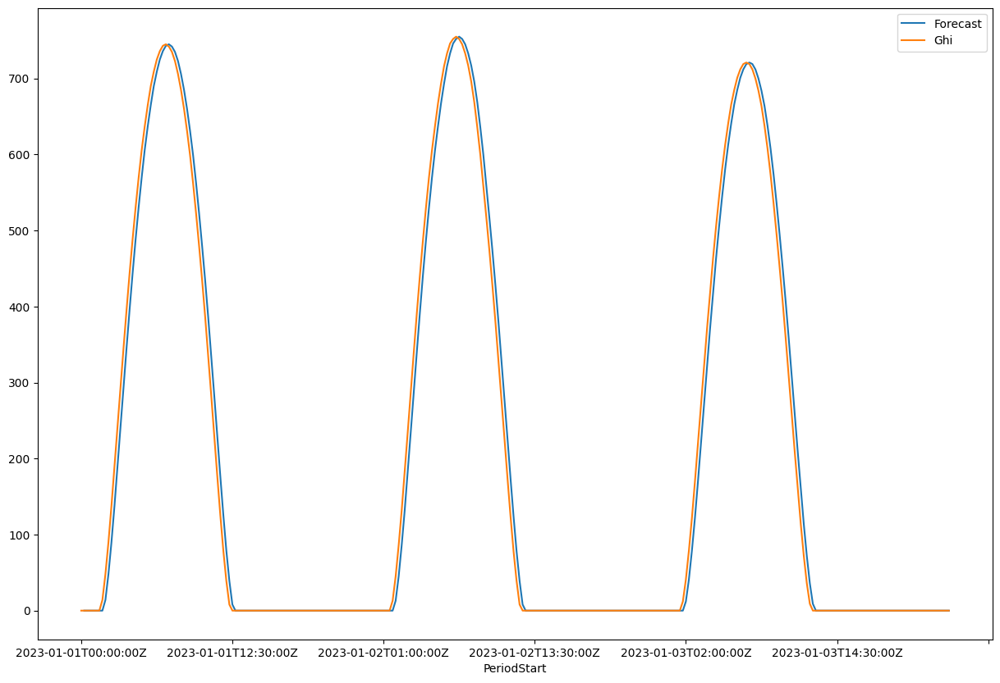

In [ ]:
df_per_rew.set_index('PeriodStart')[['Forecast','Ghi']].iloc[0:96*3].plot(figsize=(15,10))

In [ ]:
df_per_rew.dropna(inplace=True)

In [ ]:
print("r2_Score",r2_score(df_per_rew['Forecast'],df_per_rew['Ghi']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_per_rew['Forecast'],df_per_rew['Ghi'])))
print("Mean Absolute Error",mean_absolute_error(df_per_rew['Forecast'],df_per_rew['Ghi']))

r2_Score 0.9912337807214757
Root Mean Sqaured Error 27.89714547897903
Mean Absolute Error 16.944150298889838


## Transfer_Learning

### S1

#### 4

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_rew_4,y_train_rew_4,X_test_rew,y_test_rew,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/S1_4.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
91/92 [============================>.] - ETA: 0s - loss: 8.9363e-04
Epoch 1: val_loss improved from inf to 0.00017, saving model to /content/drive/MyDrive/Generali

181/181 [==============================] - 1s 8ms/step
r2_Score 0.9966860257215592
Root Mean Sqaured Error 15.829131
Mean Absolute Error 9.049061


Text(0, 0.5, 'Irradiance (W/m^2)')

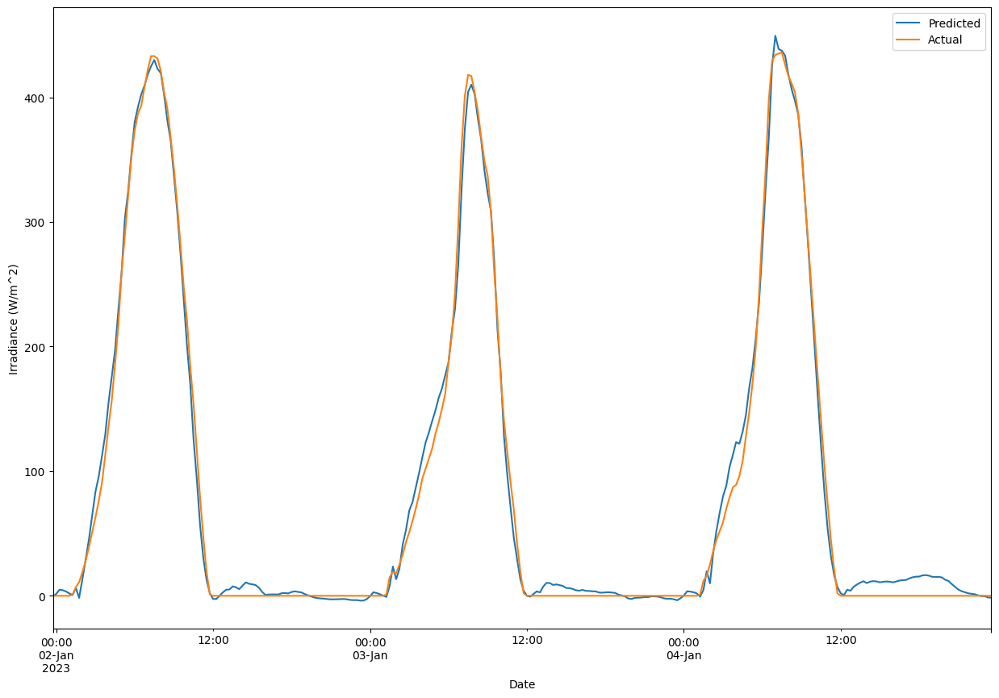

In [ ]:
df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(p3_1.predict(X_test_rew))
print("r2_Score",r2_score(p3_1.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_rew_8,y_train_rew_8,X_test_rew,y_test_rew,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/S1_8.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
163/165 [============================>.] - ETA: 0s - loss: 0.0010
Epoch 1: val_loss improved from inf to 0.00018, saving model to /content/drive/MyDrive/Generaliza

181/181 [==============================] - 1s 8ms/step
r2_Score 0.9924793863553599
Root Mean Sqaured Error 23.722103
Mean Absolute Error 17.46019


Text(0, 0.5, 'Irradiance (W/m^2)')

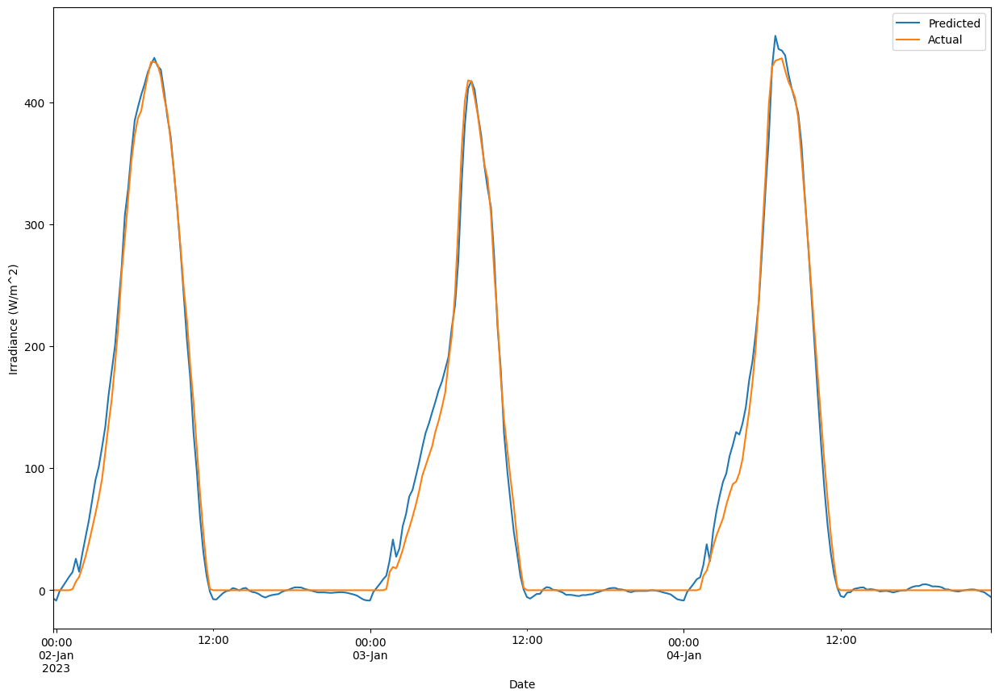

In [ ]:
df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(p3_1.predict(X_test_rew))
print("r2_Score",r2_score(p3_1.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_rew_12,y_train_rew_12,X_test_rew,y_test_rew,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/S1_12.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
218/219 [============================>.] - ETA: 0s - loss: 8.6227e-04
Epoch 1: val_loss improved from inf to 0.00015, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 1s 8ms/step
r2_Score 0.9970402672425392
Root Mean Sqaured Error 14.8006525
Mean Absolute Error 7.840703


Text(0, 0.5, 'Irradiance (W/m^2)')

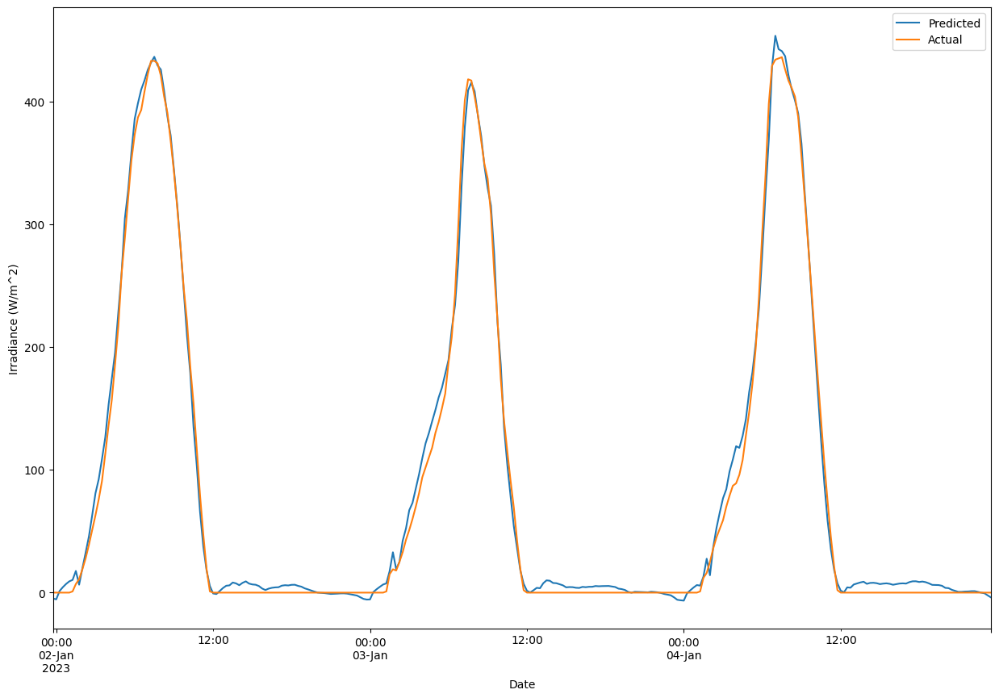

In [ ]:
df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(p3_1.predict(X_test_rew))
print("r2_Score",r2_score(p3_1.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S2

#### 4

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_rew_4,y_train_rew_4,X_test_rew,y_test_rew,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/S2_4.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0011
Epoch 1: val_loss improved from inf to 0.00022, saving model to /content/drive/MyDrive/Generalizatio

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9951582910749618
Root Mean Sqaured Error 18.602448
Mean Absolute Error 11.156608


Text(0, 0.5, 'Irradiance (W/m^2)')

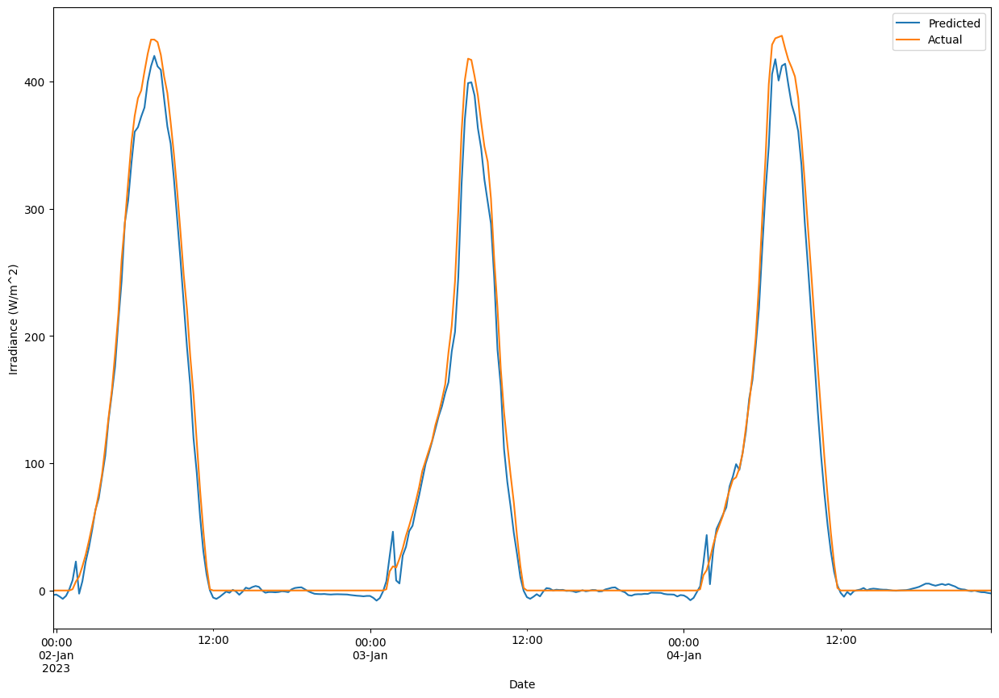

In [ ]:

df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(p3_2.predict(X_test_rew))
print("r2_Score",r2_score(p3_2.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_rew_8,y_train_rew_8,X_test_rew,y_test_rew,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/S2_8.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
164/165 [============================>.] - ETA: 0s - loss: 0.0012
Epoch 1: val_loss improved from inf to 0.00009, saving model to /content/drive/MyDrive/Generalizat

181/181 [==============================] - 2s 11ms/step
r2_Score 0.9964621152888831
Root Mean Sqaured Error 16.040674
Mean Absolute Error 8.340082


Text(0, 0.5, 'Irradiance (W/m^2)')

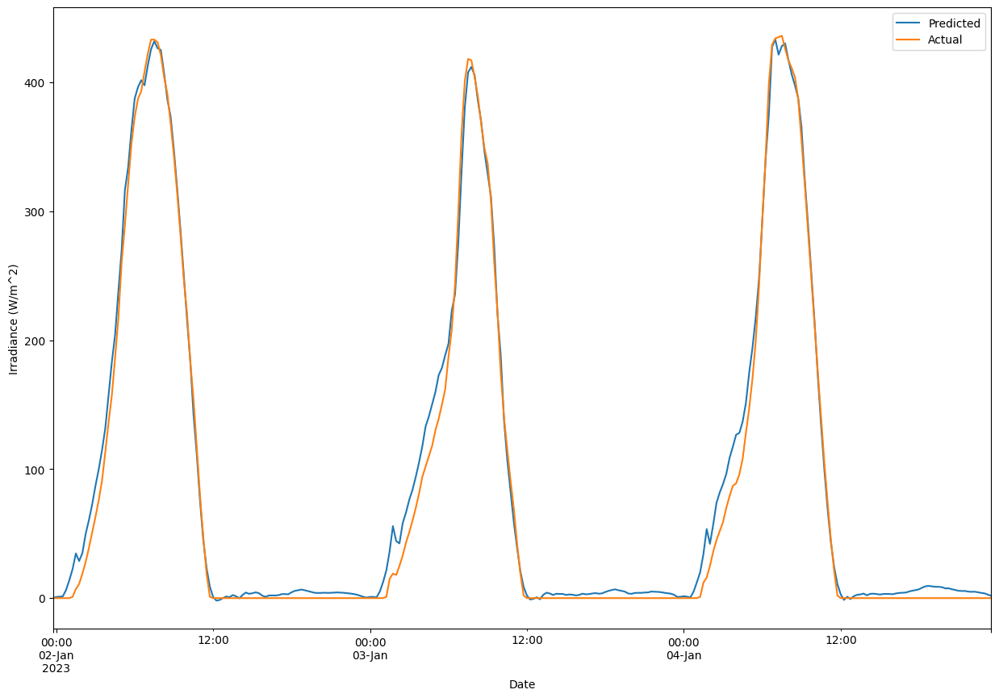

In [ ]:
df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(p3_2.predict(X_test_rew))
print("r2_Score",r2_score(p3_2.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_rew_12,y_train_rew_12,X_test_rew,y_test_rew,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/S2_12.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 9.9857e-04
Epoch 1: val_loss improved from inf to 0.00026, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 2s 11ms/step
r2_Score 0.9973384659714999
Root Mean Sqaured Error 14.002914
Mean Absolute Error 6.22699


Text(0, 0.5, 'Irradiance (W/m^2)')

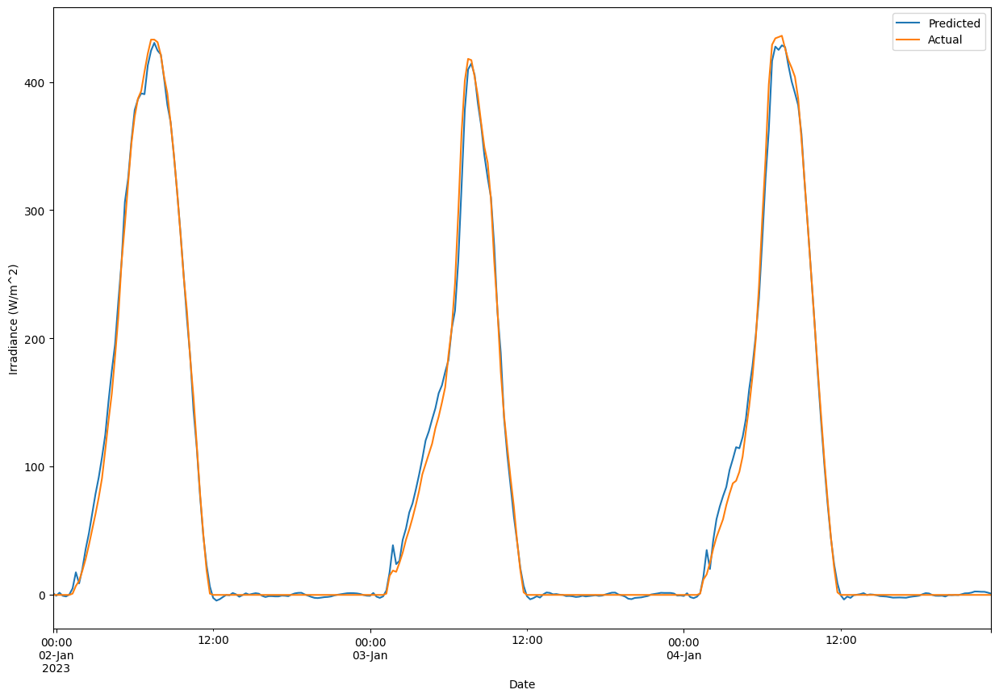

In [ ]:
df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(p3_2.predict(X_test_rew))
print("r2_Score",r2_score(p3_2.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S3

#### 4

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_rew_4,y_train_rew_4,X_test_rew,y_test_rew,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/S3_4.h5')

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_______________________________________________

181/181 [==============================] - 2s 9ms/step
r2_Score 0.993192511463317
Root Mean Sqaured Error 22.33031
Mean Absolute Error 15.197781


Text(0, 0.5, 'Irradiance (W/m^2)')

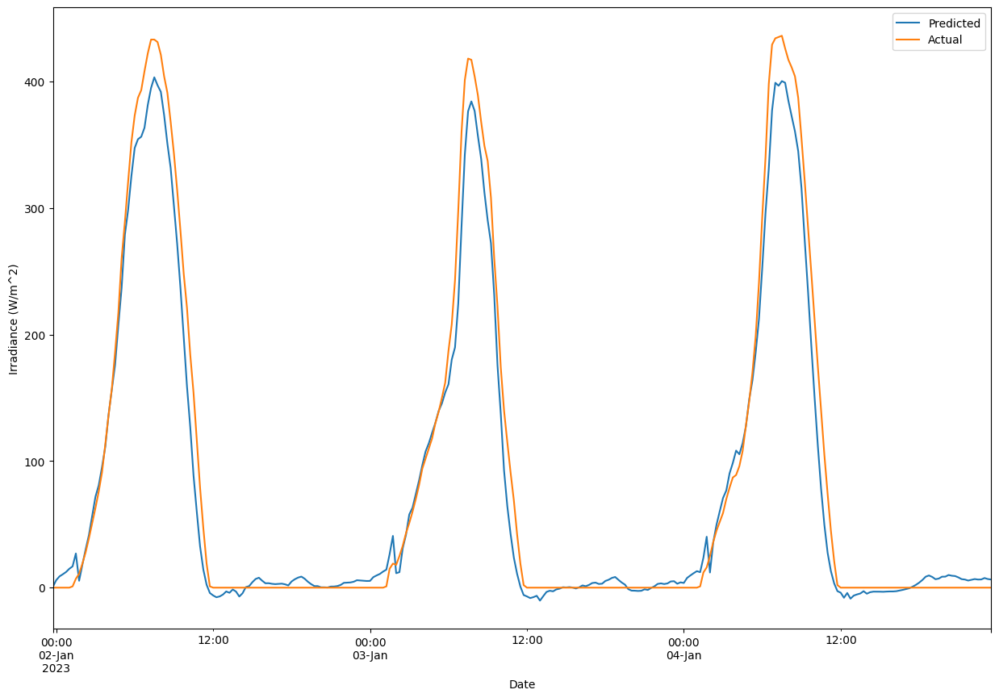

In [ ]:
df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(p3_3.predict(X_test_rew))
print("r2_Score",r2_score(p3_3.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_rew_8,y_train_rew_8,X_test_rew,y_test_rew,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/S3_8.h5')

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9890124358706831
Root Mean Sqaured Error 28.401953
Mean Absolute Error 22.23174


Text(0, 0.5, 'Irradiance (W/m^2)')

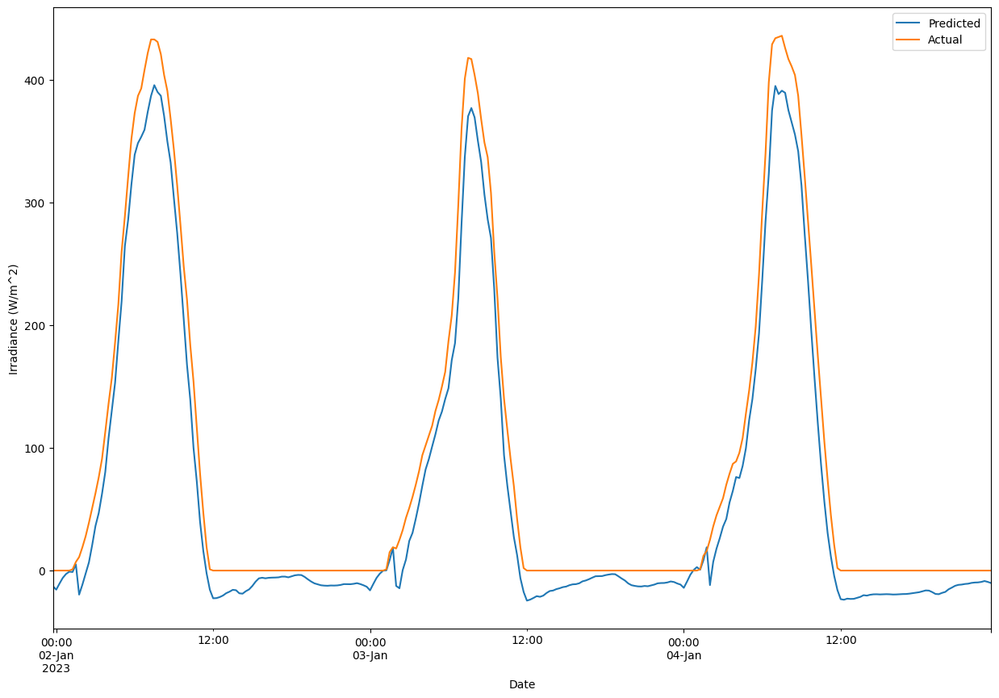

In [ ]:
df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(p3_3.predict(X_test_rew))
print("r2_Score",r2_score(p3_3.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_rew_12,y_train_rew_12,X_test_rew,y_test_rew,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/S3_12.h5')

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9972652562093961
Root Mean Sqaured Error 14.291252
Mean Absolute Error 7.448375


Text(0, 0.5, 'Irradiance (W/m^2)')

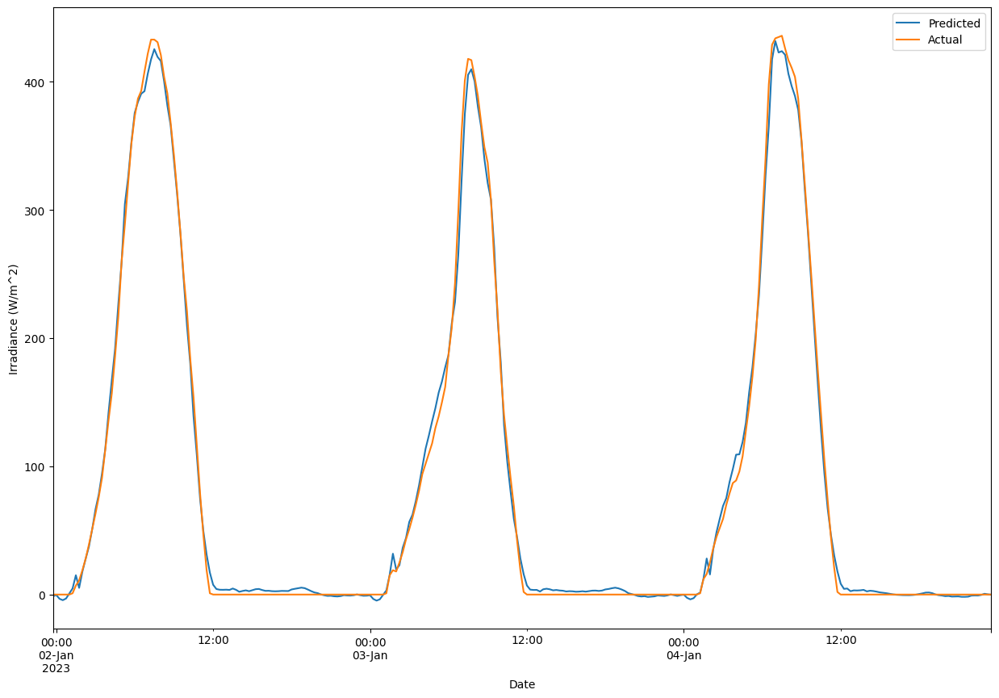

In [ ]:
df_test_date_rew['Actual']=scaler_y_rew.inverse_transform(y_test_rew)
df_test_date_rew['Predicted']=scaler_y_rew.inverse_transform(p3_3.predict(X_test_rew))
print("r2_Score",r2_score(p3_3.predict(X_test_rew),y_test_rew))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_rew['Actual'],df_test_date_rew['Predicted']))
df_test_date_rew.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# Models Validation

In [ ]:
pava_val_ns=pd.read_csv('/content/drive/MyDrive/Generalization_India_Models/NSRDB/pava.csv',skiprows=[0,1])
pha_val_ns=pd.read_csv('/content/drive/MyDrive/Generalization_India_Models/NSRDB/pha.csv',skiprows=[0,1])
rew_val_ns=pd.read_csv('/content/drive/MyDrive/Generalization_India_Models/NSRDB/rew.csv',skiprows=[0,1])

In [ ]:
pava_val_ns

,Year,Month,Day,Hour,Minute,GHI
0,2019,1,1,0,0,0
1,2019,1,1,0,15,0
2,2019,1,1,0,30,0
3,2019,1,1,0,45,0
4,2019,1,1,1,0,0
...,...,...,...,...,...,...
35035,2019,12,31,22,45,0
35036,2019,12,31,23,0,0
35037,2019,12,31,23,15,0
35038,2019,12,31,23,30,0


In [ ]:
def combine_date(year, month, day, hour, minute):
    return datetime(year, month, day, hour, minute)


In [ ]:
pava_val_ns['Date'] = pava_val_ns.apply(lambda row: combine_date(row['Year'], row['Month'], row['Day'], row['Hour'], row['Minute']), axis=1)
pha_val_ns['Date'] = pha_val_ns.apply(lambda row: combine_date(row['Year'], row['Month'], row['Day'], row['Hour'], row['Minute']), axis=1)
rew_val_ns['Date'] = rew_val_ns.apply(lambda row: combine_date(row['Year'], row['Month'], row['Day'], row['Hour'], row['Minute']), axis=1)

In [ ]:
cols = pava_val_ns.columns.tolist()
cols = ['Date'] + [col for col in cols if col != 'Date']
pava_val_ns = pava_val_ns[cols]
pava_val_ns = pava_val_ns.drop(columns=['Year', 'Month', 'Day', 'Hour', 'Minute'])


cols = pha_val_ns.columns.tolist()
cols = ['Date'] + [col for col in cols if col != 'Date']
pha_val_ns = pha_val_ns[cols]
pha_val_ns = pha_val_ns.drop(columns=['Year', 'Month', 'Day', 'Hour', 'Minute'])


cols = rew_val_ns.columns.tolist()
cols = ['Date'] + [col for col in cols if col != 'Date']
rew_val_ns = rew_val_ns[cols]
rew_val_ns = rew_val_ns.drop(columns=['Year', 'Month', 'Day', 'Hour', 'Minute'])


In [ ]:
n_timesteps=96
n_features=26
n_outputs=1

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

class SplitData:

    def __init__(self,data,n_timesteps, n_outputs, only_production=False):
        # Read data from csv
        self.df=data
        # self.train=train
        # self.test=test

        self.train = None
        self.test = None

        self.x_train = None
        self.y_train = None

        self.x_test = None
        self.y_test = None

        self.only_production = only_production
        self.lag = n_timesteps

        self.n_features = None
        self.num_of_outputs = n_outputs
        
        self.cols = self.df.columns


    def split_sequences(self, sequences):
        X, y = list(), list()
        for i in range(len(sequences)):
            # find the end of this pattern 
            end_ix = i + self.lag
            # check if we are beyond the dataset
            if end_ix > len(sequences):
                break
            # gather input and output parts of the pattern
            if self.only_production:
                seq_x, seq_y = sequences[i:end_ix, -1], sequences[end_ix:(end_ix+self.num_of_outputs), -1]
            else:
                seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:(end_ix+self.num_of_outputs),-1]
            X.append(seq_x)
            y.append(seq_y)
        return (np.array(X), np.array(y))

    def unique_shapes(self,x, y, lag_, n_features_, num_of_outputs_, only_production):
        uniuqe_shapes = []
        for k in range(len(x)):
            if only_production==True:
                if (x[k].shape == (lag_,)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)
            else:
                if (x[k].shape == (lag_, n_features_)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)       
        x = x[uniuqe_shapes]
        y = y[uniuqe_shapes]
        x = np.stack(x)
        y = np.stack(y)
        return (x, y)
    def preprocess_data(self):
        # Select non-correlated variables and perform One-Hot-Encoding to Months and Sin-Cos Similarities to Hours
        self.n_features = len(self.cols)

        feature_index = self.df.columns.get_loc('Ghi')

        # Pop the feature from its current position
        df_feature = self.df.pop('Ghi')

        # Insert the feature at the last index
        self.df.insert(len(self.df.columns), 'Ghi', df_feature)

        # Set the training data range

        train_start = "2018-12-31T00:00:00Z"
        train_end = "2019-12-31T23:45:00Z"

        # Convert the 'PeriodStart' column to a datetime format
        self.df['PeriodStart'] = pd.to_datetime(self.df['PeriodStart'])

        # Split the data into train and test sets based on the date and time range
        self.train = self.df[(self.df['PeriodStart'] >= train_start) & (self.df['PeriodStart'] <= train_end)]

        self.x, self.y = self.split_sequences(self.train.values)

        self.x, self.y = self.unique_shapes(self.x, self.y, self.lag, self.n_features, self.num_of_outputs, self.only_production)


        return (self.x[:, :, 1:],self.y)

In [ ]:
sd3=SplitData(pava_val,n_timesteps,n_outputs,only_production=False)
pava_val_x,pava_val_y=sd3.preprocess_data()

df_pava_val=pava_val.copy()

df_date_pava_val=pd.DataFrame()

train_start = "2018-12-31T00:00:00Z"
train_end = "2019-12-31T23:45:00Z"


# Convert the 'PeriodStart' column to a datetime format
df_pava_val['PeriodStart'] = pd.to_datetime(df_pava_val['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_date_pava_val['Date'] = df_pava_val[(df_pava_val['PeriodStart'] >= train_start) & (df_pava_val['PeriodStart'] <= train_end)]['PeriodStart']

df_date_pava_val=df_date_pava_val.iloc[-len(pava_val_x):]

<ipython-input-66-8a4883104105>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
pava_val_x.shape

(35040, 96, 26)

In [ ]:
pava_val_y.shape

(35040, 1)

In [ ]:
df_date_pava_val

,Date
96,2019-01-01 00:00:00+00:00
97,2019-01-01 00:15:00+00:00
98,2019-01-01 00:30:00+00:00
99,2019-01-01 00:45:00+00:00
100,2019-01-01 01:00:00+00:00
...,...
35131,2019-12-31 22:45:00+00:00
35132,2019-12-31 23:00:00+00:00
35133,2019-12-31 23:15:00+00:00
35134,2019-12-31 23:30:00+00:00


In [ ]:
sd3=SplitData(pha_val,n_timesteps,n_outputs,only_production=False)
pha_val_x,pha_val_y=sd3.preprocess_data()

df_pha_val=pha_val.copy()

df_date_pha_val=pd.DataFrame()

train_start = "2018-12-31T00:00:00Z"
train_end = "2019-12-31T23:45:00Z"


# Convert the 'PeriodStart' column to a datetime format
df_pha_val['PeriodStart'] = pd.to_datetime(df_pha_val['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_date_pha_val['Date'] = df_pha_val[(df_pha_val['PeriodStart'] >= train_start) & (df_pha_val['PeriodStart'] <= train_end)]['PeriodStart']

df_date_pha_val=df_date_pha_val.iloc[-len(pha_val_x):]

<ipython-input-66-8a4883104105>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
sd3=SplitData(rew_val,n_timesteps,n_outputs,only_production=False)
rew_val_x,rew_val_y=sd3.preprocess_data()

df_rew_val=rew_val.copy()

df_date_rew_val=pd.DataFrame()

train_start = "2018-12-31T00:00:00Z"
train_end = "2019-12-31T23:45:00Z"


# Convert the 'PeriodStart' column to a datetime format
df_rew_val['PeriodStart'] = pd.to_datetime(df_rew_val['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_date_rew_val['Date'] = df_rew_val[(df_rew_val['PeriodStart'] >= train_start) & (df_rew_val['PeriodStart'] <= train_end)]['PeriodStart']

df_date_rew_val=df_date_rew_val.iloc[-len(rew_val_x):]

<ipython-input-66-8a4883104105>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
pava_val_x = pava_val_x.astype('float32')
pava_val_y = pava_val_y.astype('float32')


pha_val_x = pha_val_x.astype('float32')
pha_val_y = pha_val_y.astype('float32')


rew_val_x = rew_val_x.astype('float32')
rew_val_y = rew_val_y.astype('float32')


In [ ]:
# Flatten X_train and X_test to 2 dimensions
pava_val_x_flat = pava_val_x.reshape(pava_val_x.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler = MinMaxScaler(feature_range=(0,1))
pava_val_x_scaled= scaler.fit_transform(pava_val_x_flat)


# Reshape back to original shape
pava_val_x= pava_val_x_scaled.reshape(pava_val_x.shape)



scaler_y = MinMaxScaler(feature_range=(0,1))
pava_val_y = scaler_y.fit_transform(pava_val_y)


In [ ]:
# Flatten X_train and X_test to 2 dimensions
pha_val_x_flat = pha_val_x.reshape(pha_val_x.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler = MinMaxScaler(feature_range=(0,1))
pha_val_x_scaled= scaler.fit_transform(pha_val_x_flat)


# Reshape back to original shape
pha_val_x= pha_val_x_scaled.reshape(pha_val_x.shape)



scaler_y = MinMaxScaler(feature_range=(0,1))
pha_val_y = scaler_y.fit_transform(pha_val_y)


In [ ]:
# Flatten X_train and X_test to 2 dimensions
rew_val_x_flat = rew_val_x.reshape(rew_val_x.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler = MinMaxScaler(feature_range=(0,1))
rew_val_x_scaled= scaler.fit_transform(rew_val_x_flat)


# Reshape back to original shape
rew_val_x= rew_val_x_scaled.reshape(rew_val_x.shape)



scaler_y = MinMaxScaler(feature_range=(0,1))
rew_val_y = scaler_y.fit_transform(rew_val_y)



# PAVA

In [ ]:
n_timesteps=96
n_features=26
n_outputs=1

# S1 validation

## s1_4

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S1_4.h5')

In [ ]:
df_date_pava_val['Actual']=scaler_y.inverse_transform(pava_val_y)
df_date_pava_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(pava_val_x))
print("r2_Score",r2_score(s1_4.predict(pava_val_x),pava_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

ValueError: ignored

In [ ]:
df_date_pava_val['NSRDB']=pava_val_ns['GHI'].to_list()

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['Error']=df_date_pava_val['Actual']-df_date_pava_val['NSRDB']

In [ ]:
df_date_pava_val['Predicted']=df_date_pava_val['Predicted']- df_date_pava_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S1_8.h5')

In [ ]:
df_date_pava_val['Actual']=scaler_y.inverse_transform(pava_val_y)
df_date_pava_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(pava_val_x))
print("r2_Score",r2_score(s1_4.predict(pava_val_x),pava_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['NSRDB']=pava_val_ns['GHI'].to_list()

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['Error']=df_date_pava_val['Actual']-df_date_pava_val['NSRDB']

In [ ]:
df_date_pava_val['Predicted']=df_date_pava_val['Predicted']- df_date_pava_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s1_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S1_12.h5')

In [ ]:
df_date_pava_val['Actual']=scaler_y.inverse_transform(pava_val_y)
df_date_pava_val['Predicted']=scaler_y.inverse_transform(s1_12.predict(pava_val_x))
print("r2_Score",r2_score(s1_12.predict(pava_val_x),pava_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['NSRDB']=pava_val_ns['GHI'].to_list()

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['Error']=df_date_pava_val['Actual']-df_date_pava_val['NSRDB']

In [ ]:
df_date_pava_val['Predicted']=df_date_pava_val['Predicted']- df_date_pava_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S2 validation

## S2_4

In [ ]:
s2_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S2_4.h5.h5')

In [ ]:
df_date_pava_val['Actual']=scaler_y.inverse_transform(pava_val_y)
df_date_pava_val['Predicted']=scaler_y.inverse_transform(s2_4.predict(pava_val_x))
print("r2_Score",r2_score(s2_4.predict(pava_val_x),pava_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['NSRDB']=pava_val_ns['GHI'].to_list()

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['Error']=df_date_pava_val['Actual']-df_date_pava_val['NSRDB']

In [ ]:
df_date_pava_val['Predicted']=df_date_pava_val['Predicted']- df_date_pava_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_8

In [ ]:
s2_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S2_8.h5.h5')

In [ ]:
df_date_pava_val['Actual']=scaler_y.inverse_transform(pava_val_y)
df_date_pava_val['Predicted']=scaler_y.inverse_transform(s2_8.predict(pava_val_x))
print("r2_Score",r2_score(s2_8.predict(pava_val_x),pava_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['NSRDB']=pava_val_ns['GHI'].to_list()

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['Error']=df_date_pava_val['Actual']-df_date_pava_val['NSRDB']

In [ ]:
df_date_pava_val['Predicted']=df_date_pava_val['Predicted']- df_date_pava_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S2_4.h5.h5')

In [ ]:
df_date_pava_val['Actual']=scaler_y.inverse_transform(pava_val_y)
df_date_pava_val['Predicted']=scaler_y.inverse_transform(s2_12.predict(pava_val_x))
print("r2_Score",r2_score(s2_12.predict(pava_val_x),pava_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['NSRDB']=pava_val_ns['GHI'].to_list()

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['Error']=df_date_pava_val['Actual']-df_date_pava_val['NSRDB']

In [ ]:
df_date_pava_val['Predicted']=df_date_pava_val['Predicted']- df_date_pava_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S3 validation

## S3_4

In [ ]:
s3_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S3_4.h5')

In [ ]:
df_date_pava_val['Actual']=scaler_y.inverse_transform(pava_val_y)
df_date_pava_val['Predicted']=scaler_y.inverse_transform(s3_4.predict(pava_val_x))
print("r2_Score",r2_score(s3_4.predict(pava_val_x),pava_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['NSRDB']=pava_val_ns['GHI'].to_list()

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['Error']=df_date_pava_val['Actual']-df_date_pava_val['NSRDB']

In [ ]:
df_date_pava_val['Predicted']=df_date_pava_val['Predicted']- df_date_pava_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_8 

In [ ]:
s3_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S3_8.h5')

In [ ]:
df_date_pava_val['Actual']=scaler_y.inverse_transform(pava_val_y)
df_date_pava_val['Predicted']=scaler_y.inverse_transform(s3_8.predict(pava_val_x))
print("r2_Score",r2_score(s3_8.predict(pava_val_x),pava_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['NSRDB']=pava_val_ns['GHI'].to_list()

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['Error']=df_date_pava_val['Actual']-df_date_pava_val['NSRDB']

In [ ]:
df_date_pava_val['Predicted']=df_date_pava_val['Predicted']- df_date_pava_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/S3_12.h5')

In [ ]:
df_date_pava_val['Actual']=scaler_y.inverse_transform(pava_val_y)
df_date_pava_val['Predicted']=scaler_y.inverse_transform(s3_12.predict(pava_val_x))
print("r2_Score",r2_score(s3_12.predict(pava_val_x),pava_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['Actual'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['NSRDB']=pava_val_ns['GHI'].to_list()

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val['Error']=df_date_pava_val['Actual']-df_date_pava_val['NSRDB']

In [ ]:
df_date_pava_val['Predicted']=df_date_pava_val['Predicted']- df_date_pava_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_pava_val['NSRDB'],df_date_pava_val['Predicted']))
df_date_pava_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_pava_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# PHA

# S1 validation

## s1_4

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S1_4.h5')

1095/1095 [==============================] - 11s 10ms/step
r2_Score 0.9946164415337398
Root Mean Sqaured Error 21.86364
Mean Absolute Error 13.102282


Text(0, 0.5, 'Irradiance (W/m^2)')

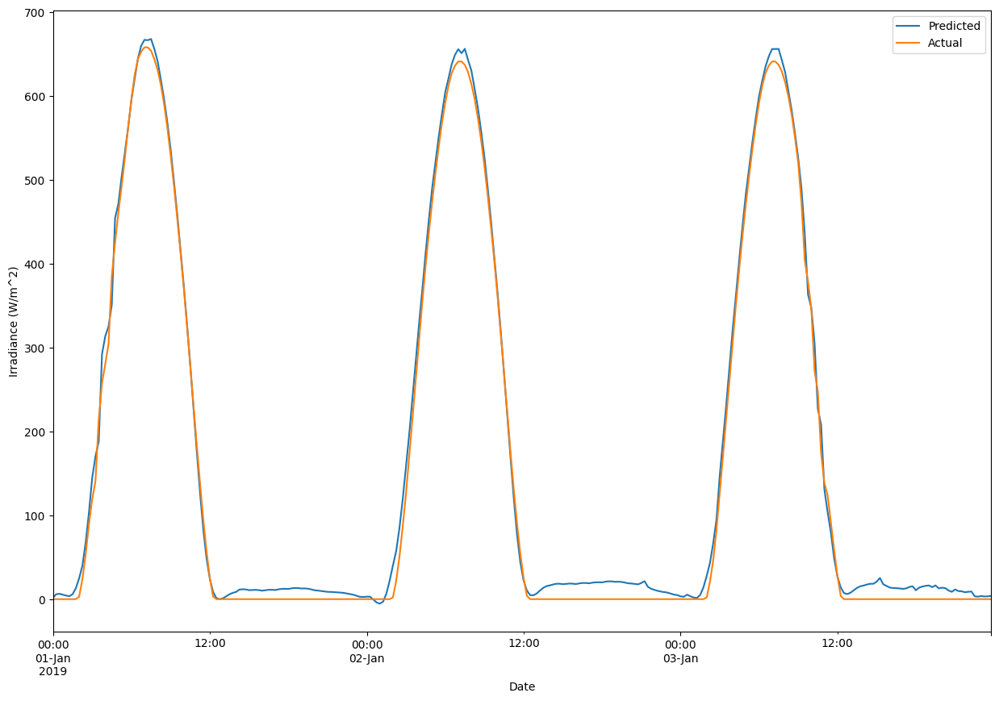

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(bh_val_x))
print("r2_Score",r2_score(s1_4.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

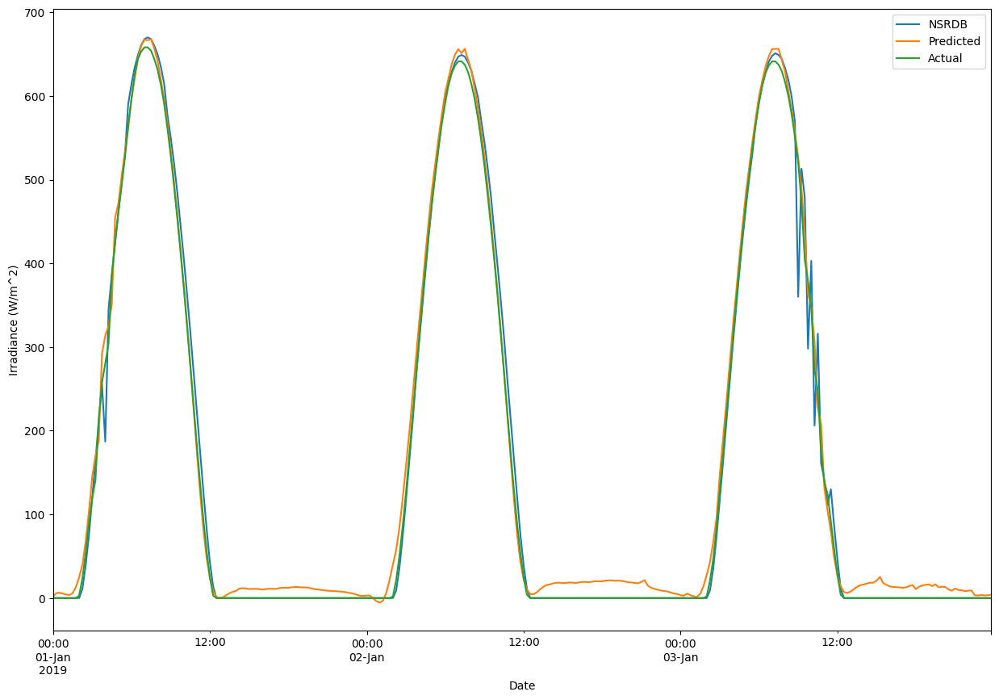

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9949371970224329
Root Mean Sqaured Error 21.86364085006174
Mean Absolute Error 13.102282102850914


Text(0, 0.5, 'Irradiance (W/m^2)')

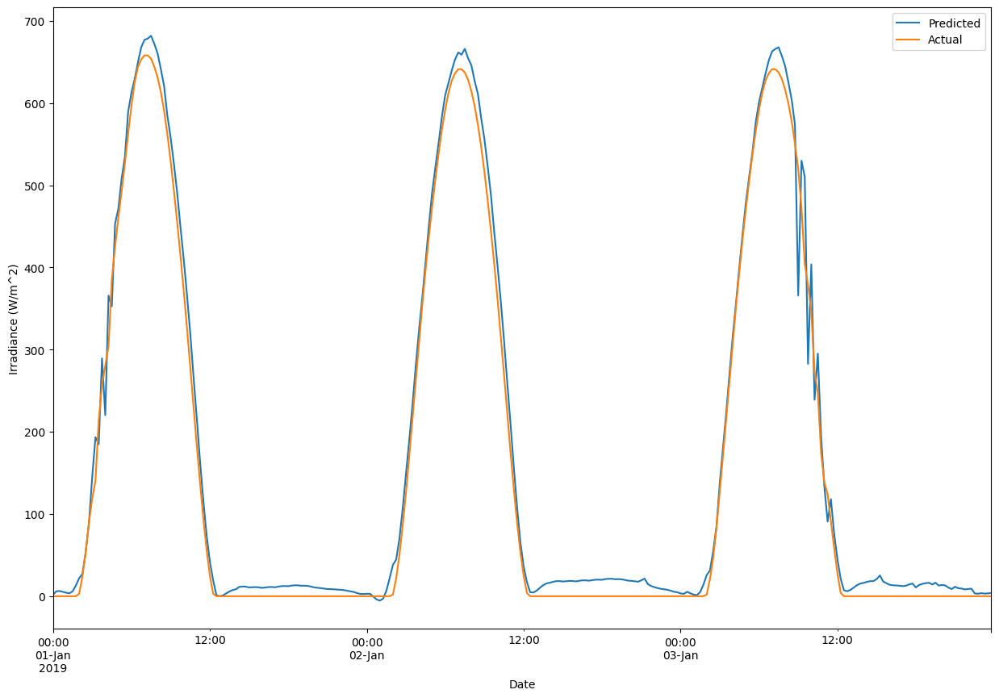

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

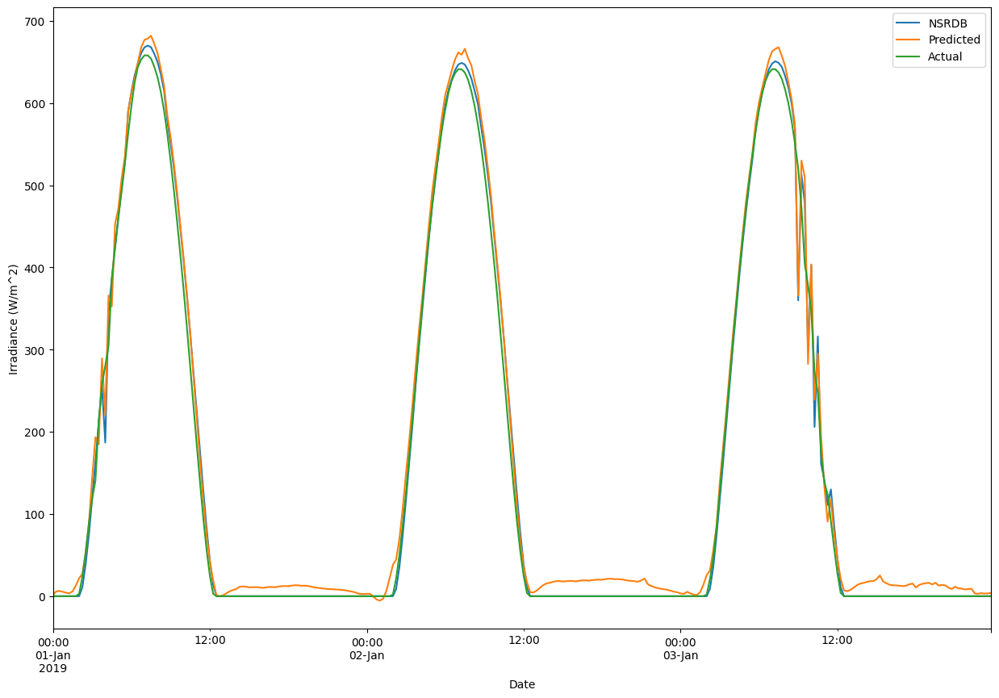

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S1_8.h5')

1095/1095 [==============================] - 15s 14ms/step
r2_Score 0.9950277621611968
Root Mean Sqaured Error 20.73607
Mean Absolute Error 12.193013


Text(0, 0.5, 'Irradiance (W/m^2)')

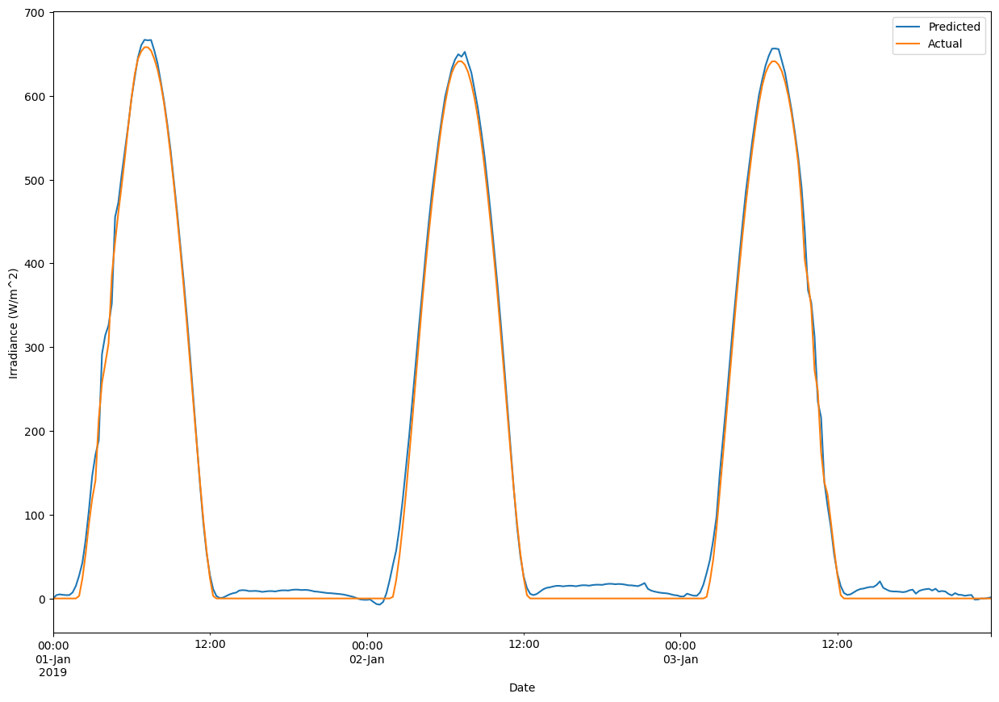

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(bh_val_x))
print("r2_Score",r2_score(s1_4.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

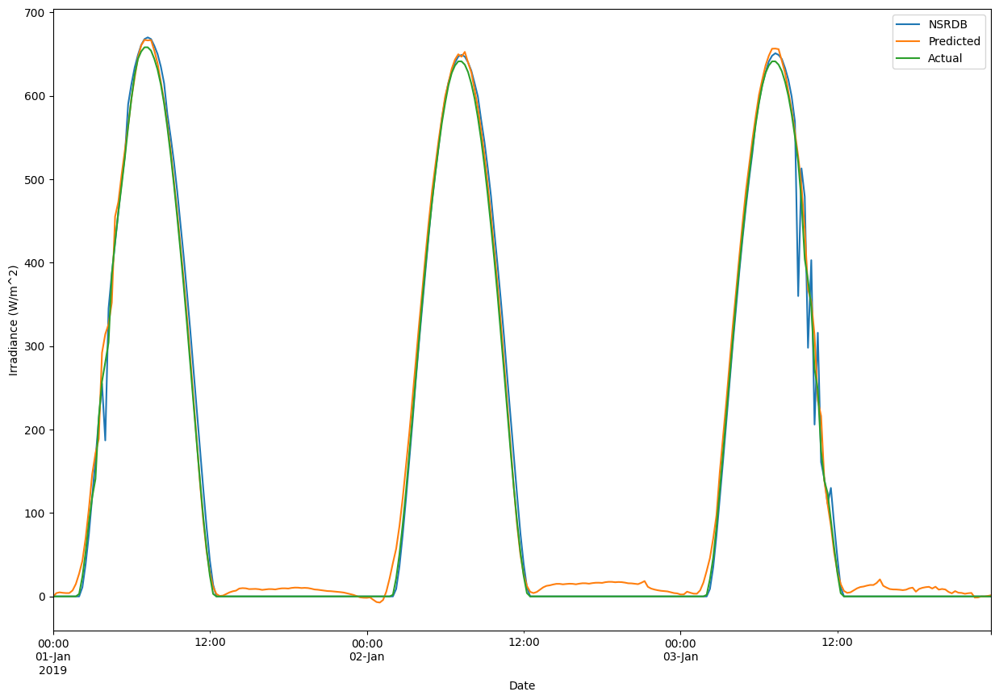

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.995445937088724
Root Mean Sqaured Error 20.736071617589996
Mean Absolute Error 12.19301372338913


Text(0, 0.5, 'Irradiance (W/m^2)')

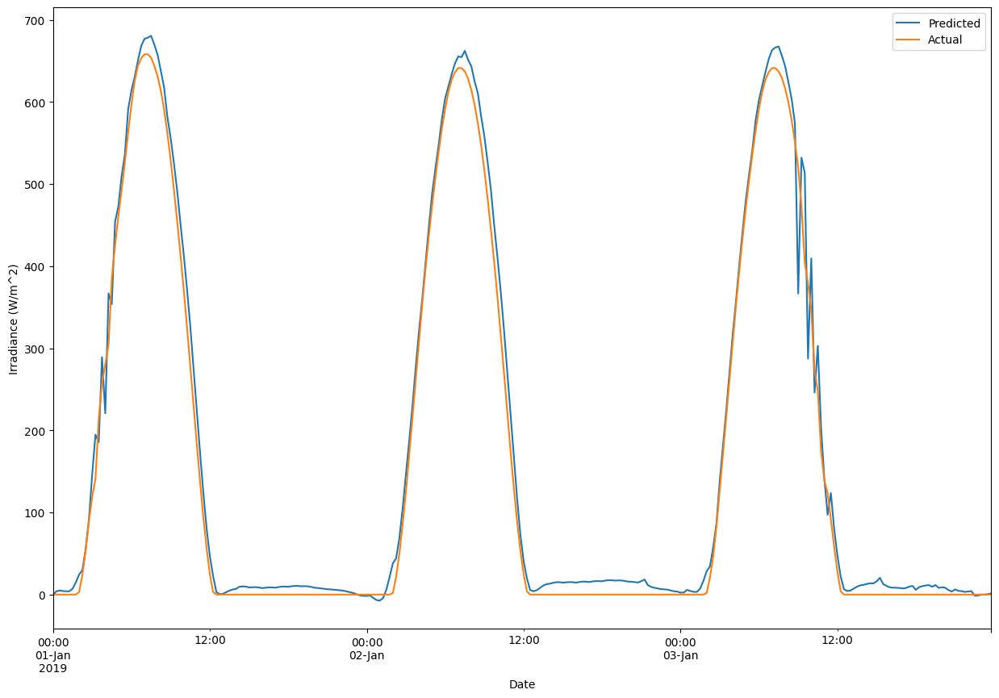

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

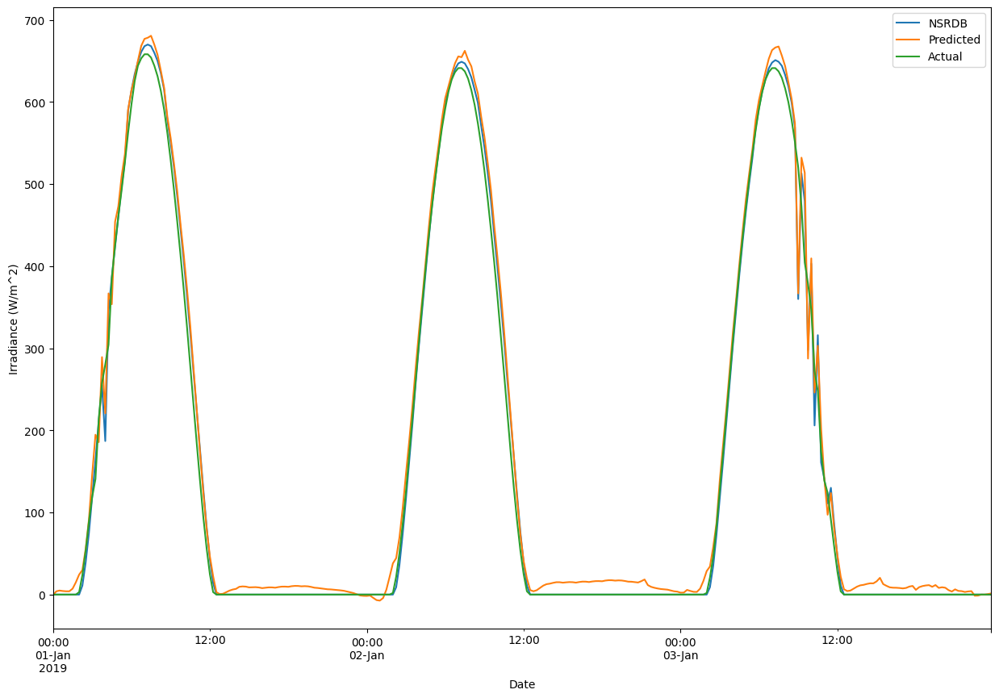

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s1_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S1_12.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9950560631343806
Root Mean Sqaured Error 20.559788
Mean Absolute Error 11.752455


Text(0, 0.5, 'Irradiance (W/m^2)')

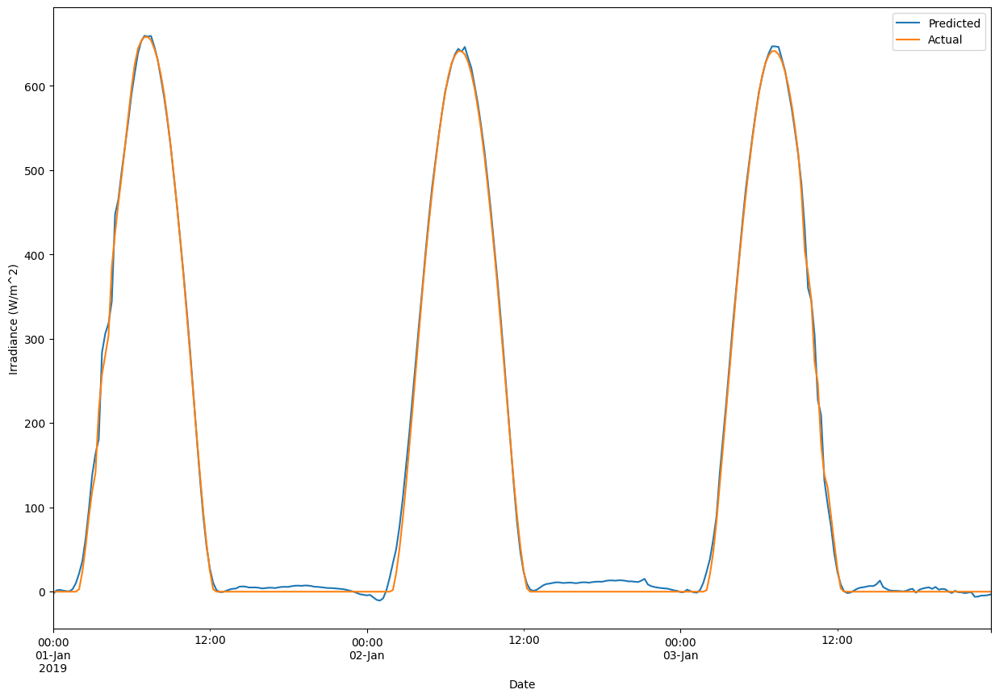

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s1_12.predict(bh_val_x))
print("r2_Score",r2_score(s1_12.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

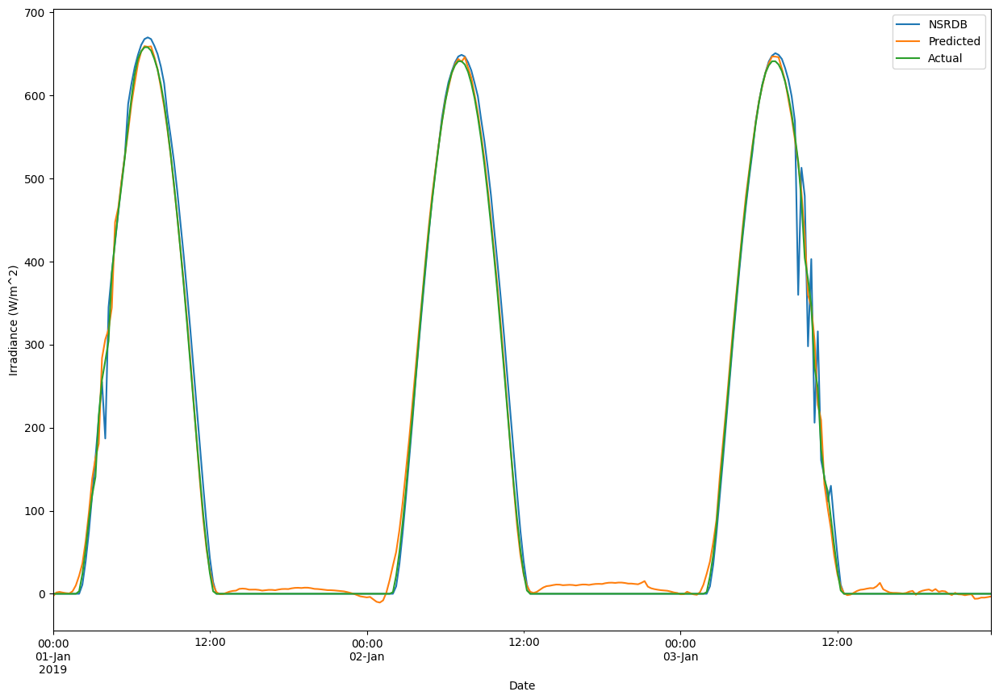

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9955230392814279
Root Mean Sqaured Error 20.559787100534283
Mean Absolute Error 11.752455026113662


Text(0, 0.5, 'Irradiance (W/m^2)')

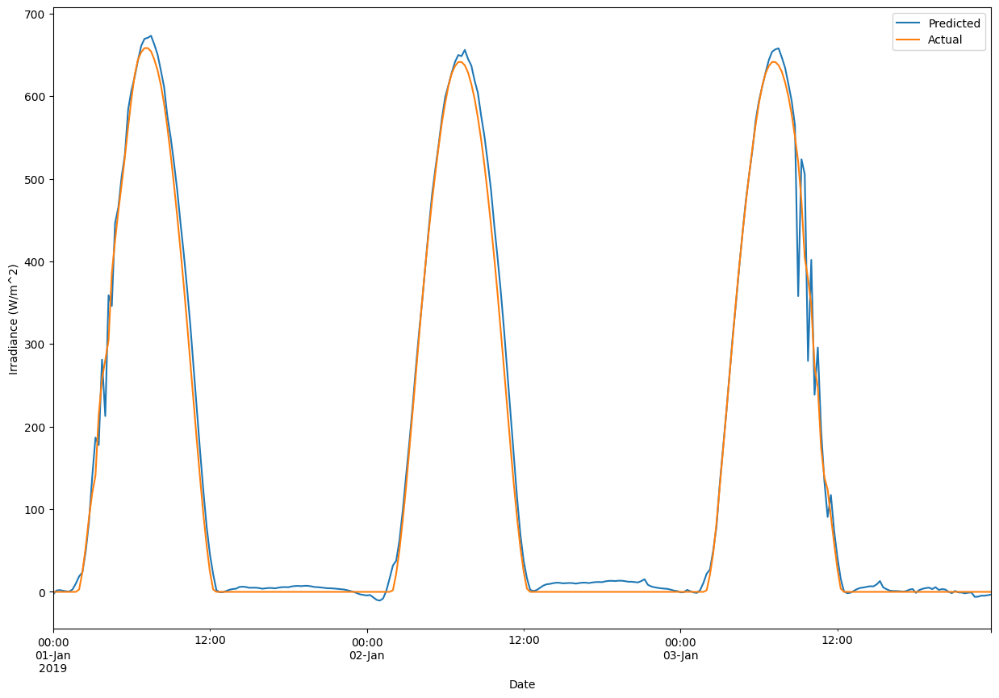

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

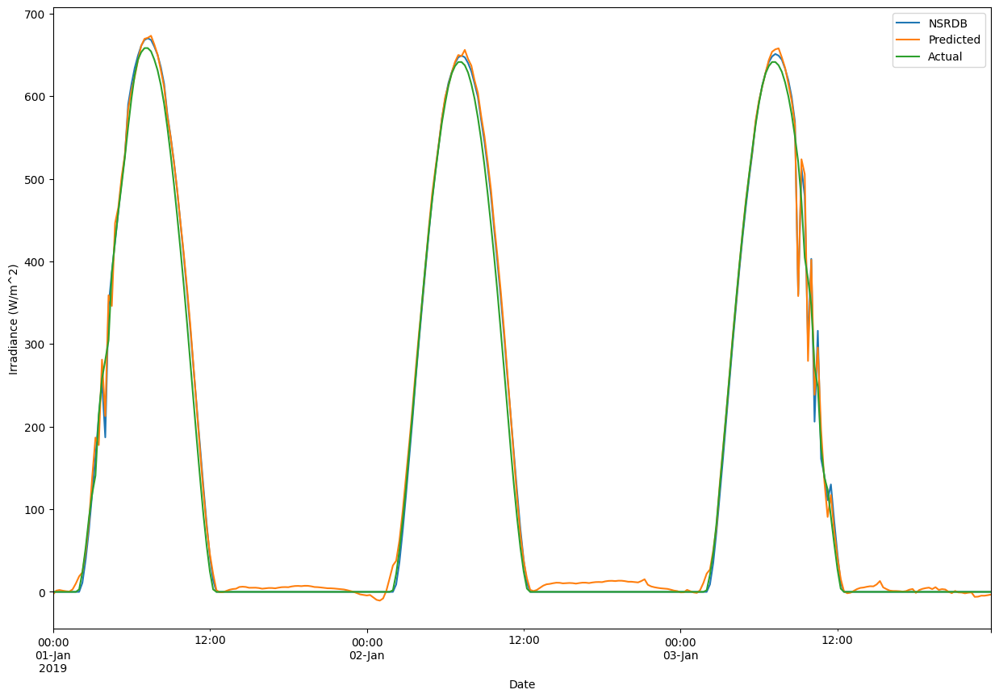

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S2 validation

## S3_4

In [ ]:
s2_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S2_4.h5.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9950442098408933
Root Mean Sqaured Error 21.110746
Mean Absolute Error 10.898089


Text(0, 0.5, 'Irradiance (W/m^2)')

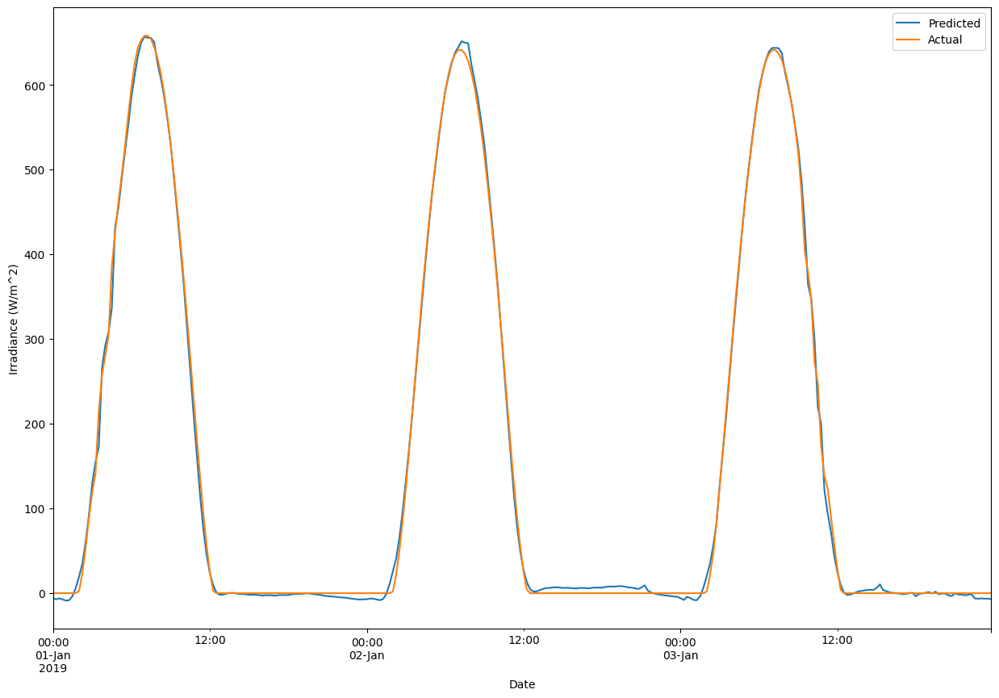

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s2_4.predict(bh_val_x))
print("r2_Score",r2_score(s2_4.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

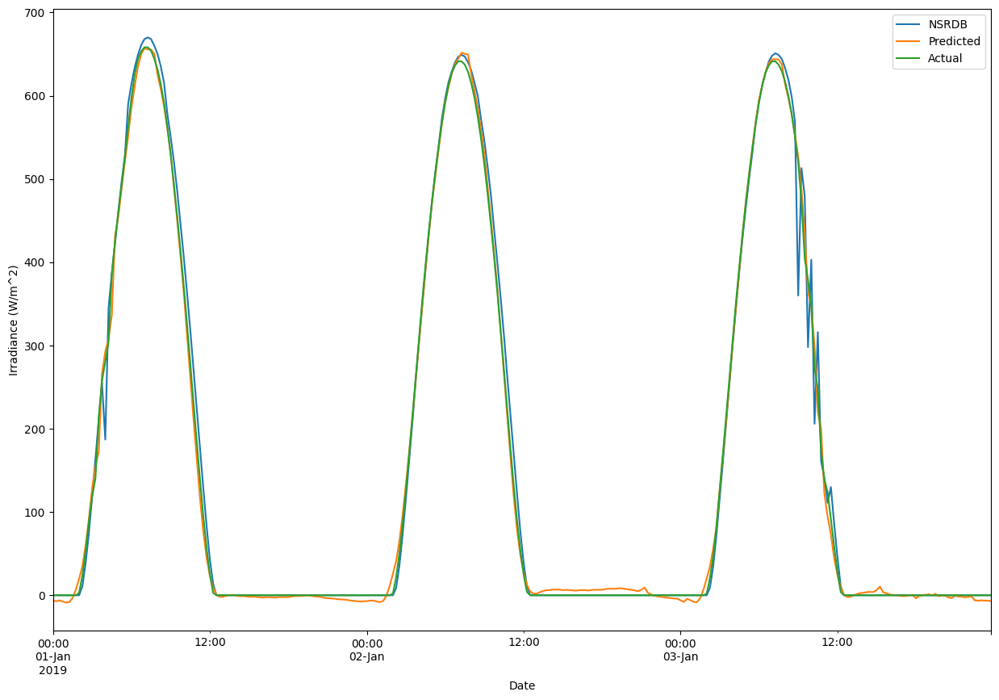

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9952798773367599
Root Mean Sqaured Error 21.110747616994743
Mean Absolute Error 10.898089187239002


Text(0, 0.5, 'Irradiance (W/m^2)')

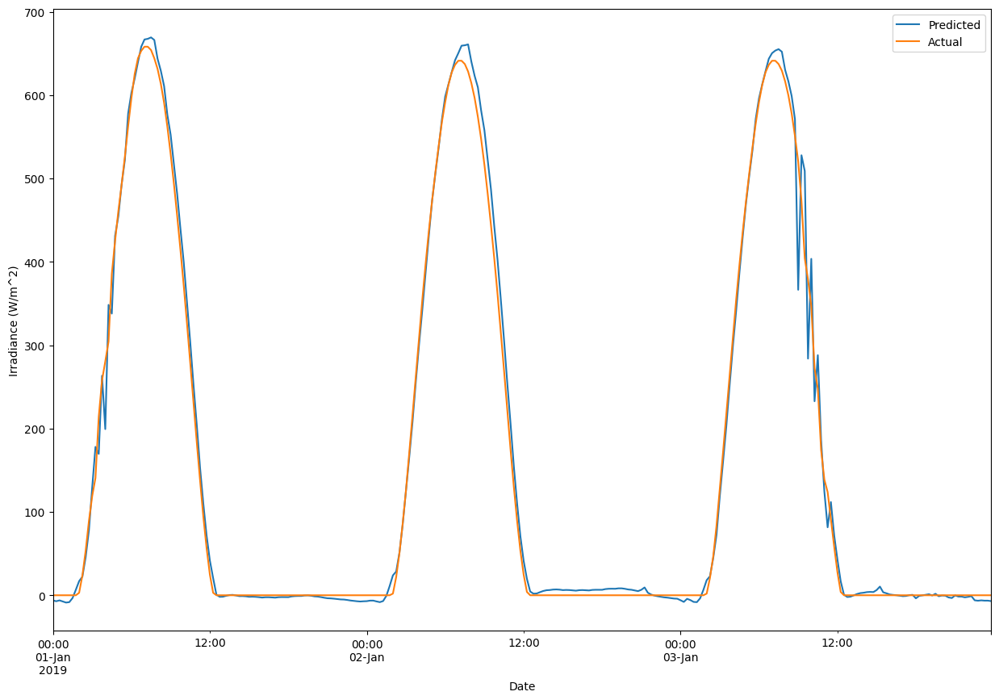

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

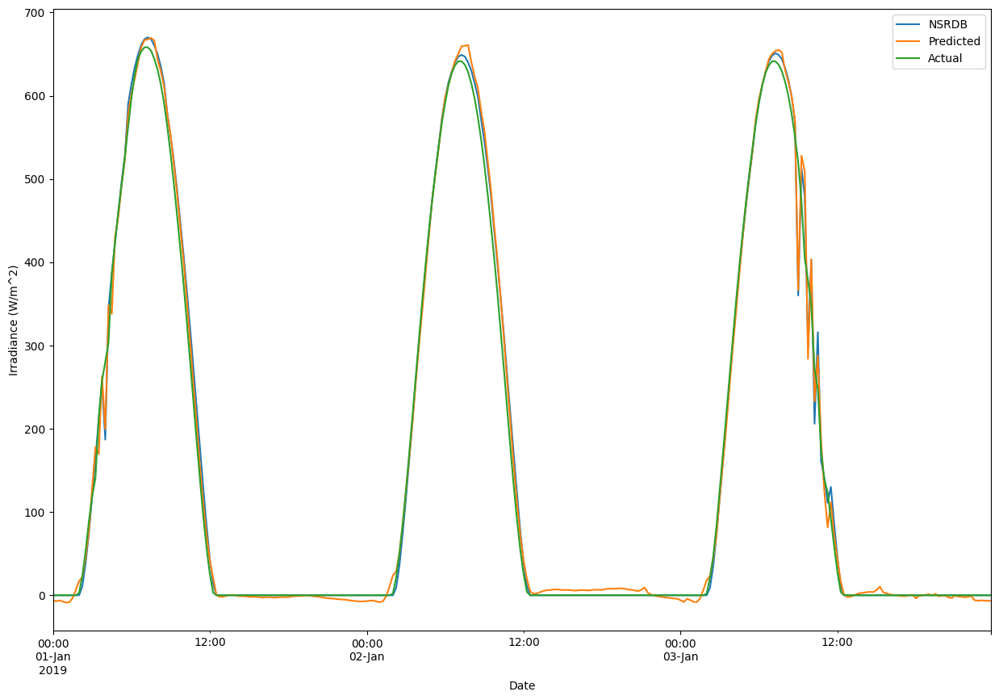

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s2_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S2_8.h5.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9955196093195873
Root Mean Sqaured Error 19.569475
Mean Absolute Error 9.824611


Text(0, 0.5, 'Irradiance (W/m^2)')

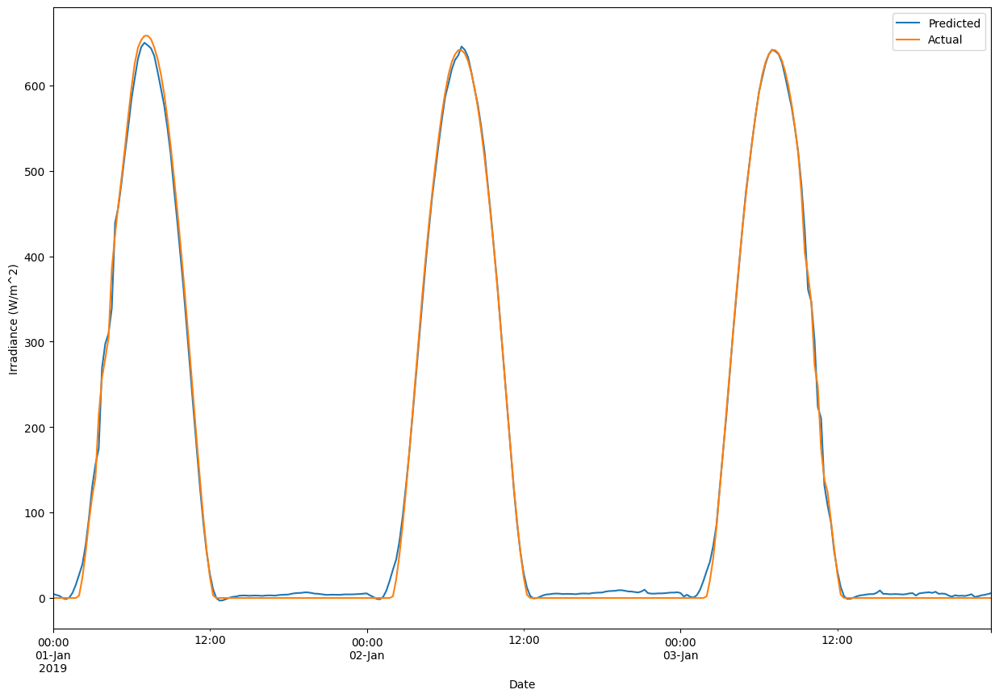

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s2_8.predict(bh_val_x))
print("r2_Score",r2_score(s2_8.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

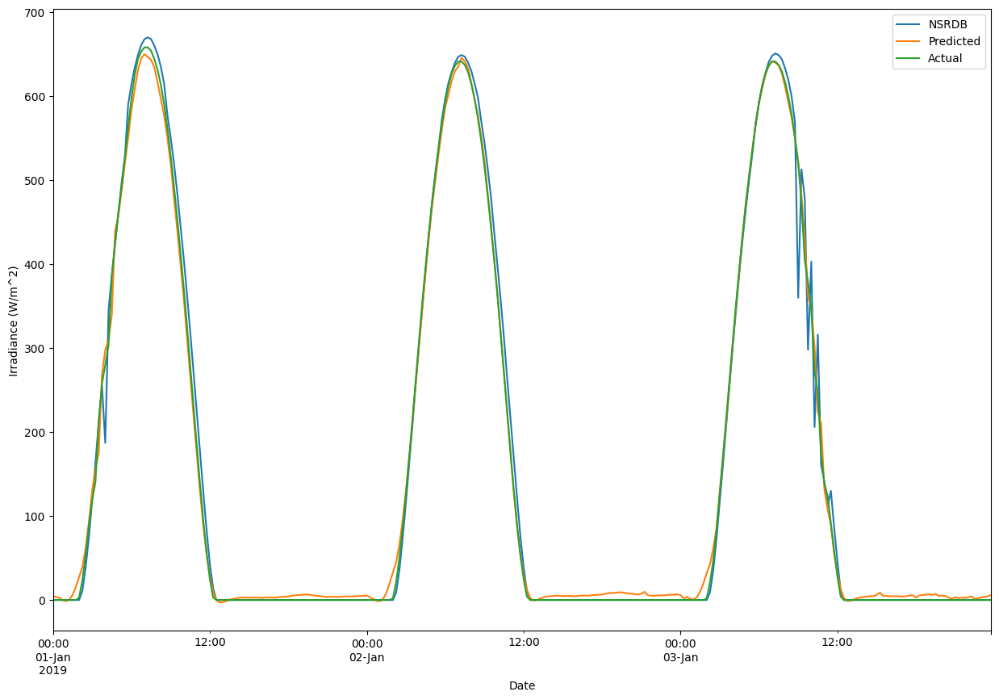

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9959439397144803
Root Mean Sqaured Error 19.56947487045313
Mean Absolute Error 9.824610657114127


Text(0, 0.5, 'Irradiance (W/m^2)')

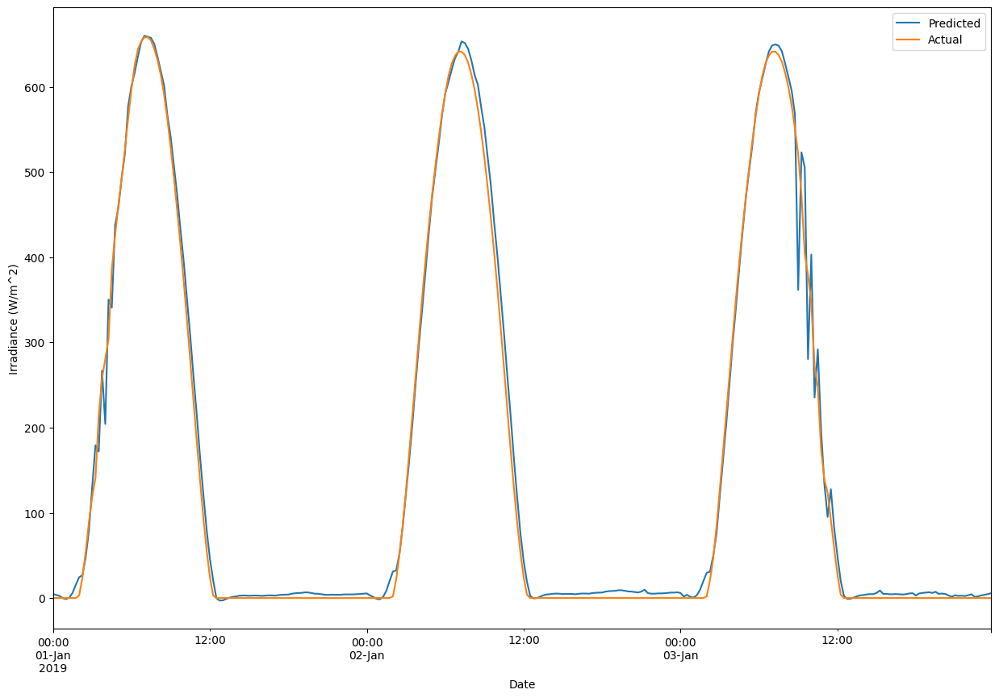

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

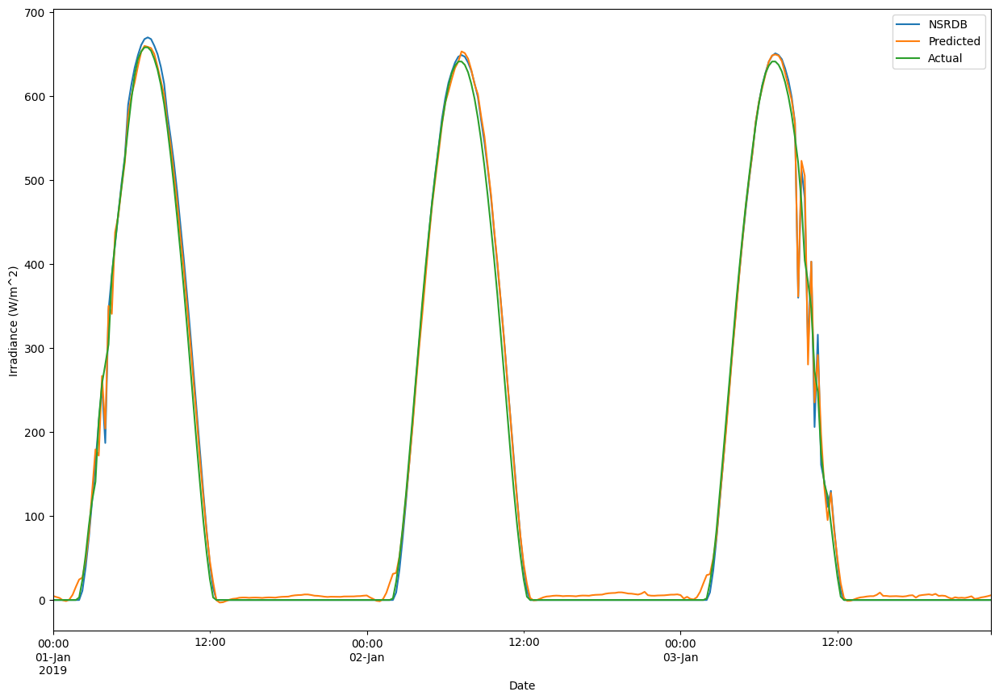

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S2_12.h5.h5')

1095/1095 [==============================] - 10s 10ms/step
r2_Score 0.9947114728334766
Root Mean Sqaured Error 21.802725
Mean Absolute Error 12.610999


Text(0, 0.5, 'Irradiance (W/m^2)')

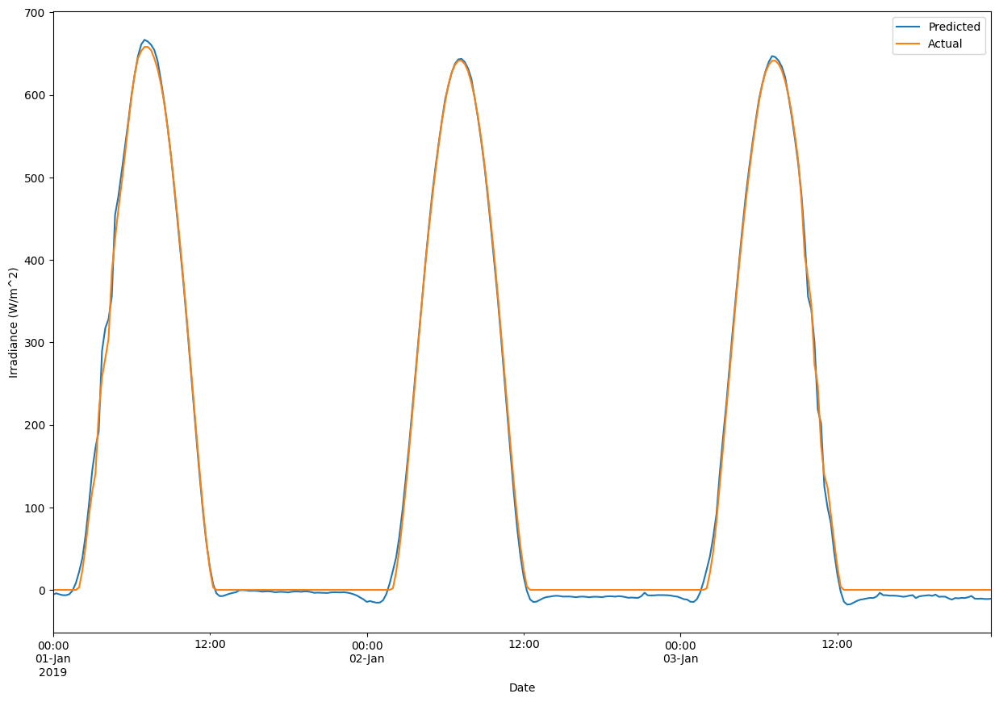

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s2_12.predict(bh_val_x))
print("r2_Score",r2_score(s2_12.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

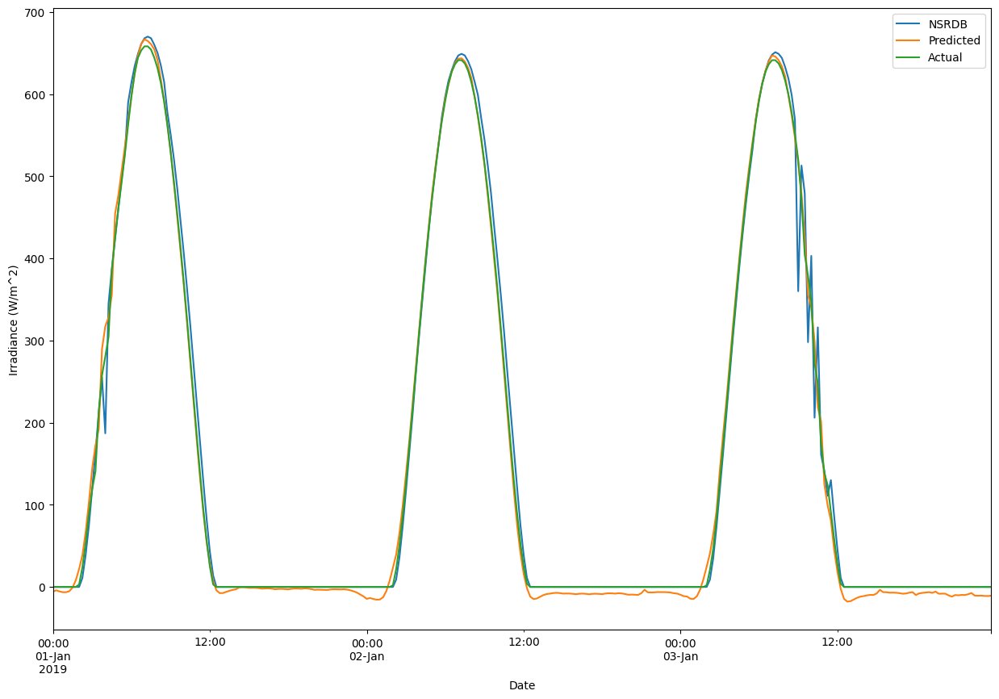

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9949653696743682
Root Mean Sqaured Error 21.80272439404256
Mean Absolute Error 12.610999104171253


Text(0, 0.5, 'Irradiance (W/m^2)')

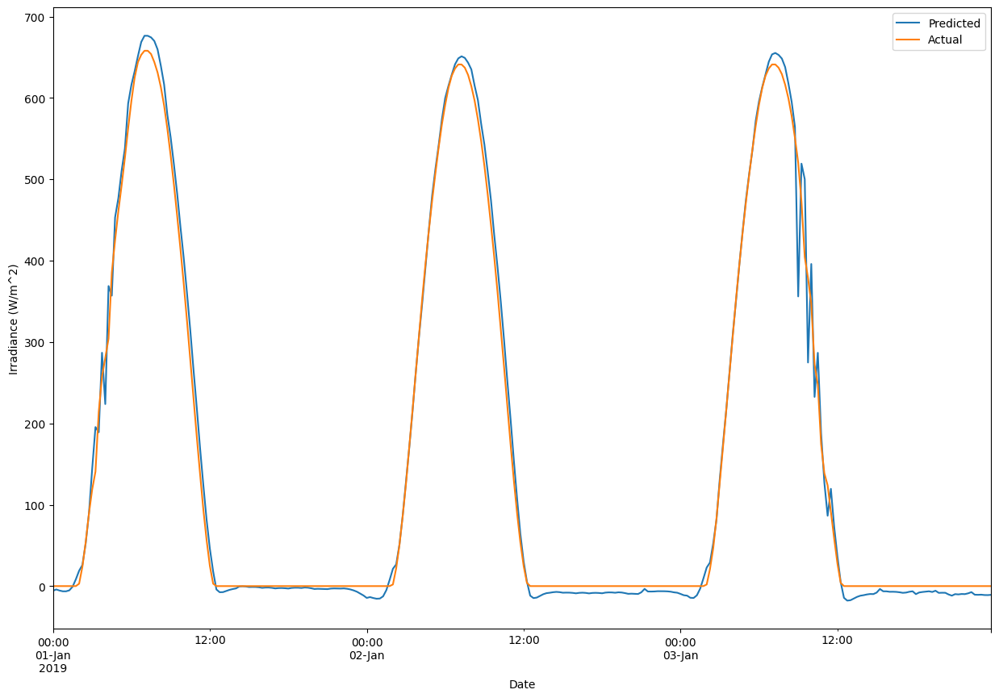

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

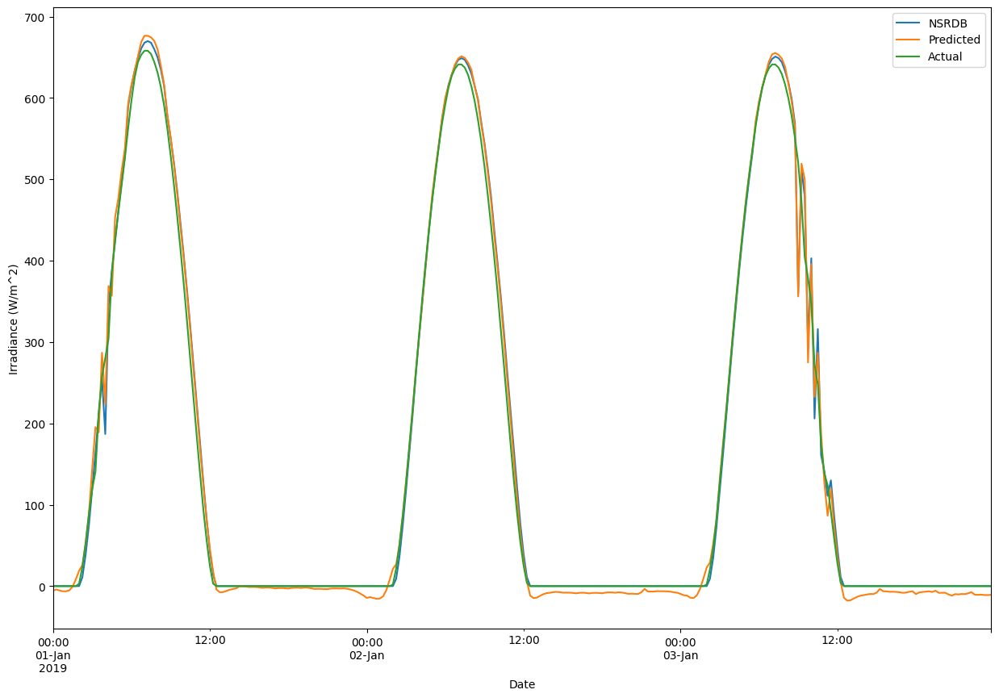

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S3 validation

## S3_4

In [ ]:
s3_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S3_4.h5')

1095/1095 [==============================] - 10s 10ms/step
r2_Score 0.9930097794850058
Root Mean Sqaured Error 25.721119
Mean Absolute Error 15.136358


Text(0, 0.5, 'Irradiance (W/m^2)')

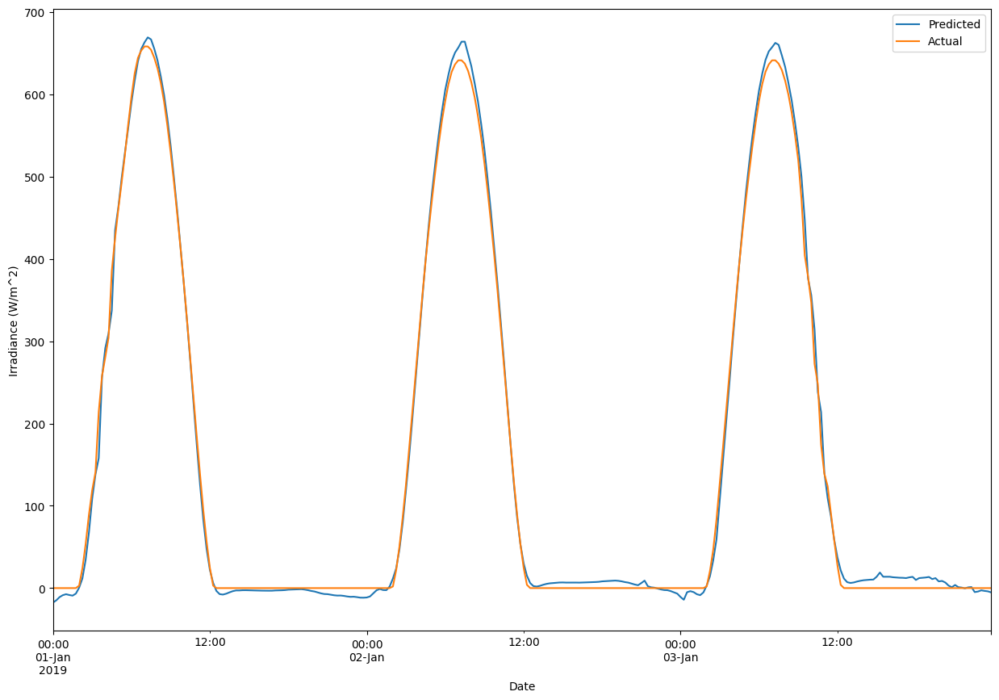

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s3_4.predict(bh_val_x))
print("r2_Score",r2_score(s3_4.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

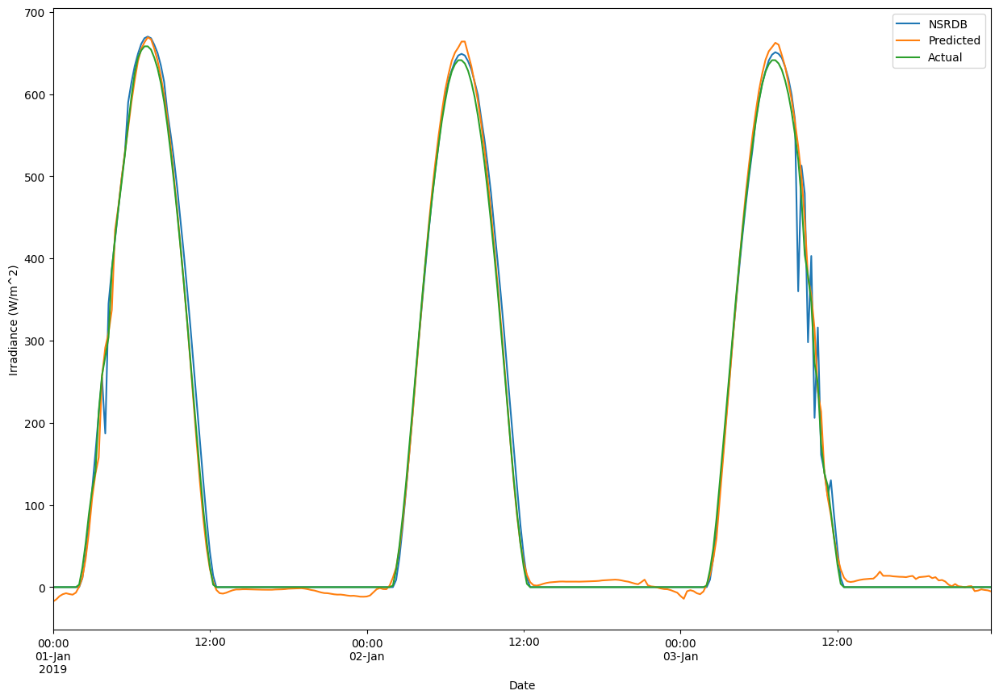

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.992993103090856
Root Mean Sqaured Error 25.72111760742816
Mean Absolute Error 15.136359047974443


Text(0, 0.5, 'Irradiance (W/m^2)')

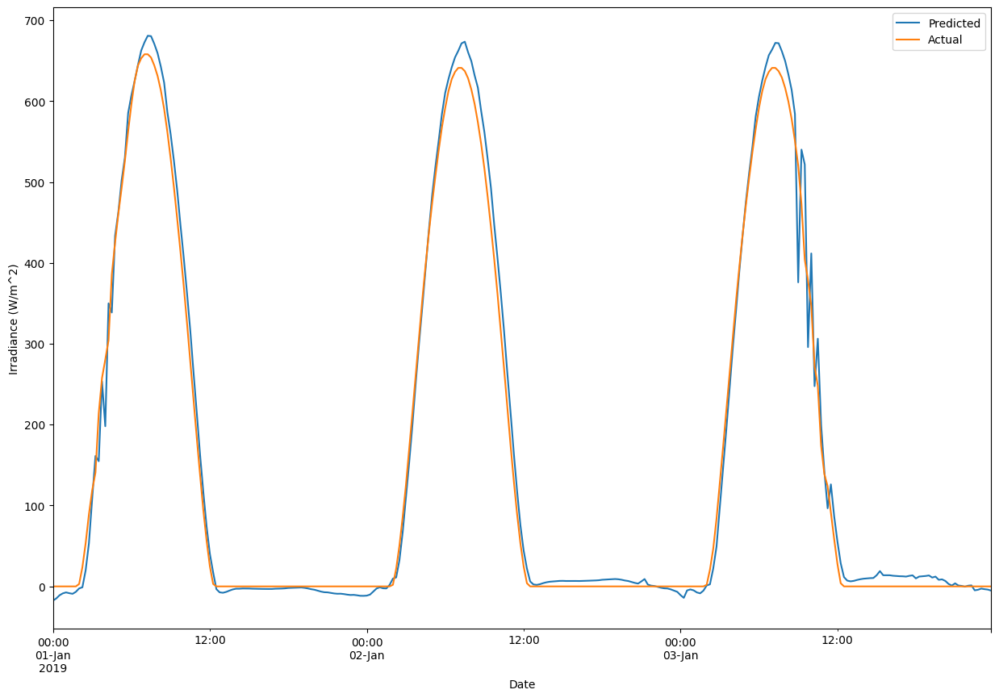

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

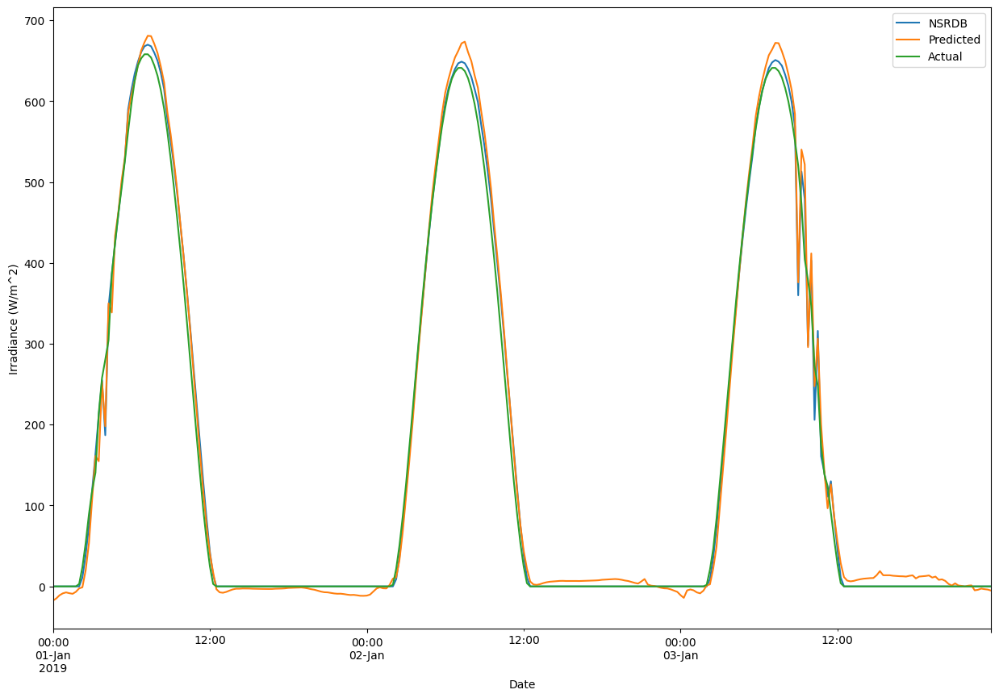

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_8 

In [ ]:
s3_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S3_8.h5')

1095/1095 [==============================] - 9s 9ms/step
r2_Score 0.9935423768413943
Root Mean Sqaured Error 24.275932
Mean Absolute Error 15.332117


Text(0, 0.5, 'Irradiance (W/m^2)')

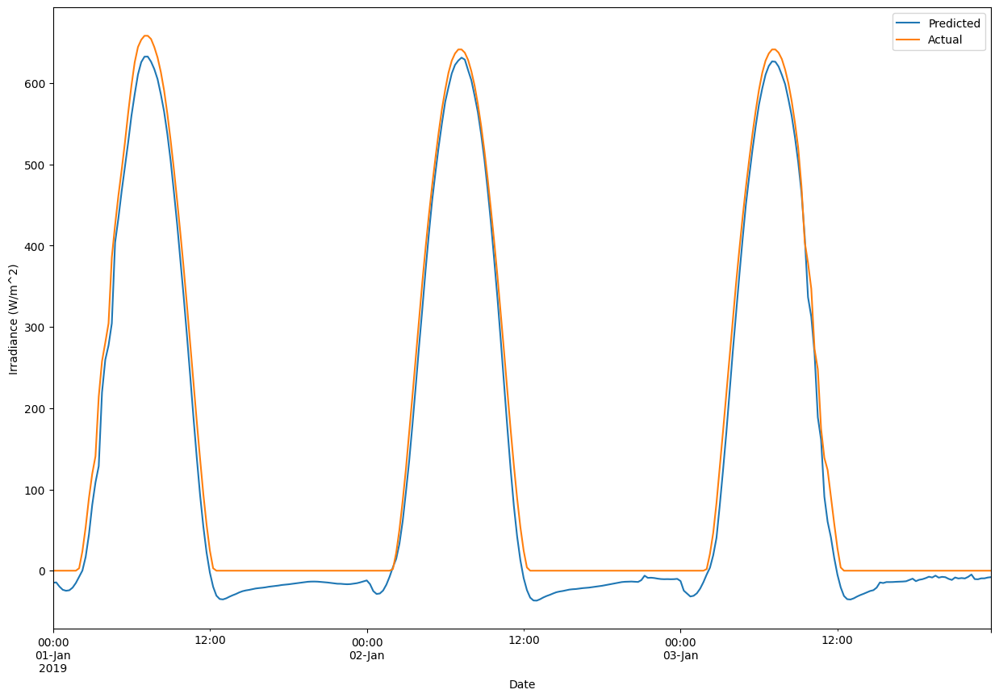

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s3_8.predict(bh_val_x))
print("r2_Score",r2_score(s3_8.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

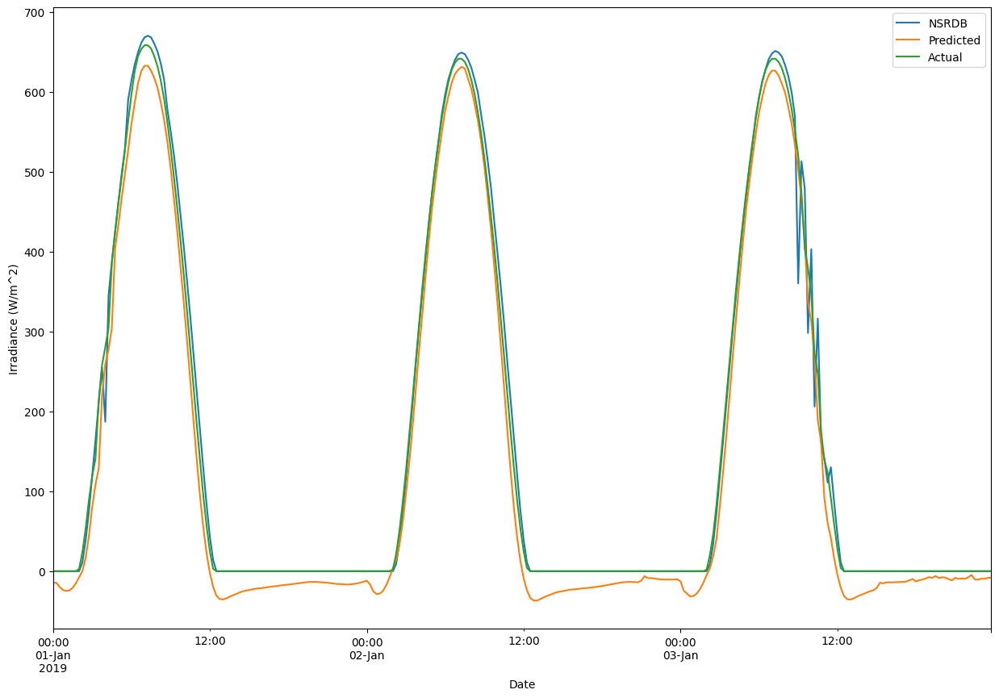

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9937583716430001
Root Mean Sqaured Error 24.275932669051098
Mean Absolute Error 15.332116741440142


Text(0, 0.5, 'Irradiance (W/m^2)')

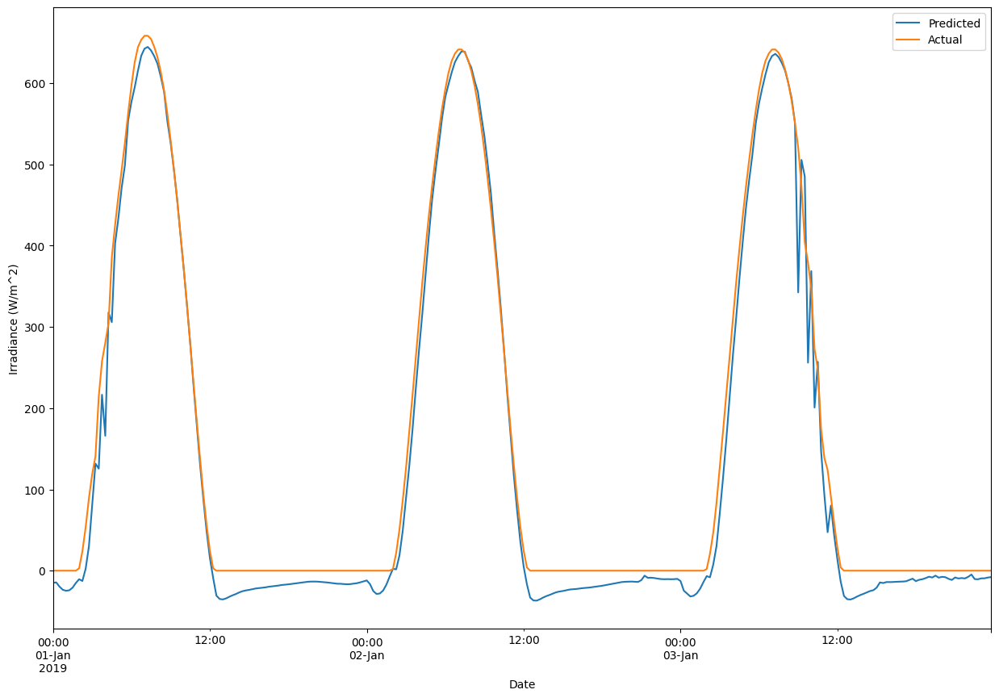

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

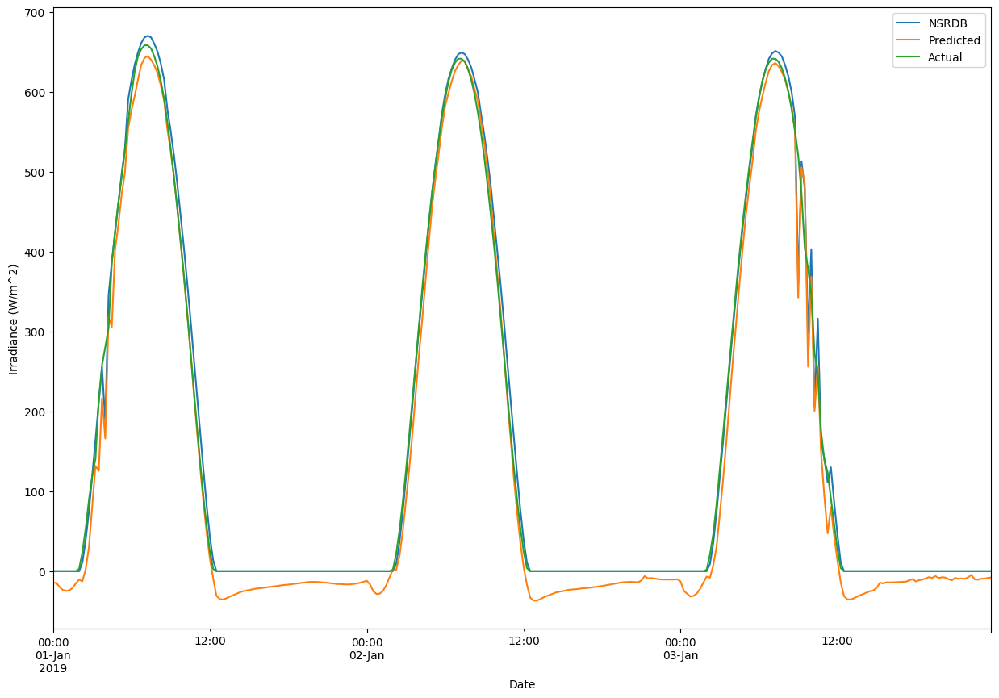

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/S3_12.h5')

1095/1095 [==============================] - 11s 10ms/step
r2_Score 0.9925626071190151
Root Mean Sqaured Error 25.081045
Mean Absolute Error 14.495887


Text(0, 0.5, 'Irradiance (W/m^2)')

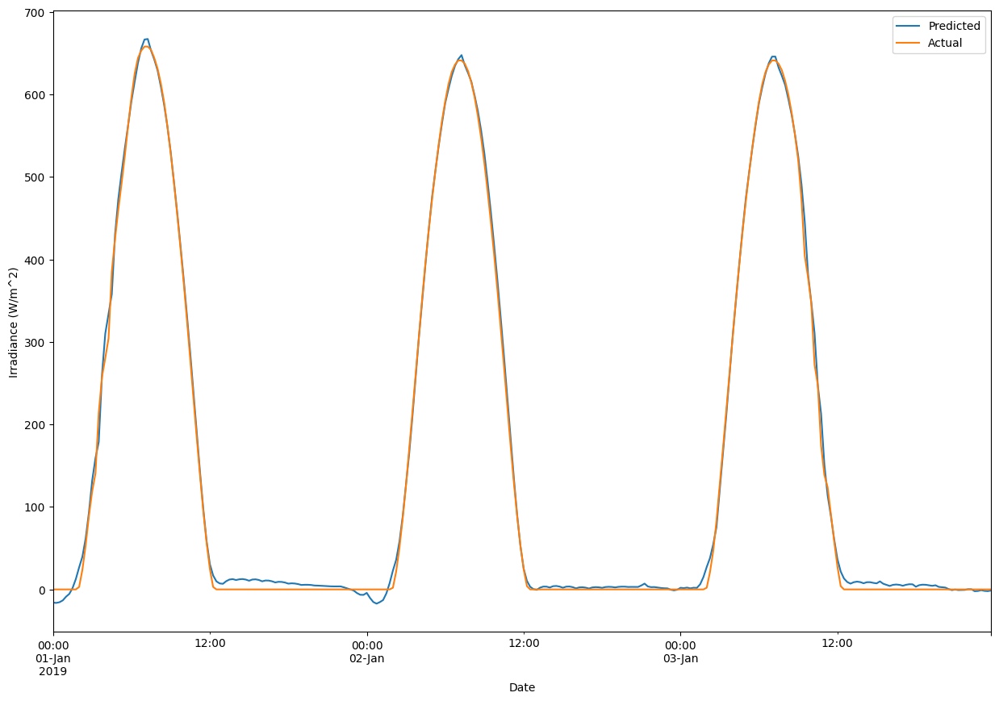

In [ ]:
df_date_bh_val['Actual']=scaler_y.inverse_transform(bh_val_y)
df_date_bh_val['Predicted']=scaler_y.inverse_transform(s3_12.predict(bh_val_x))
print("r2_Score",r2_score(s3_12.predict(bh_val_x),bh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['Actual'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['NSRDB']=bh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

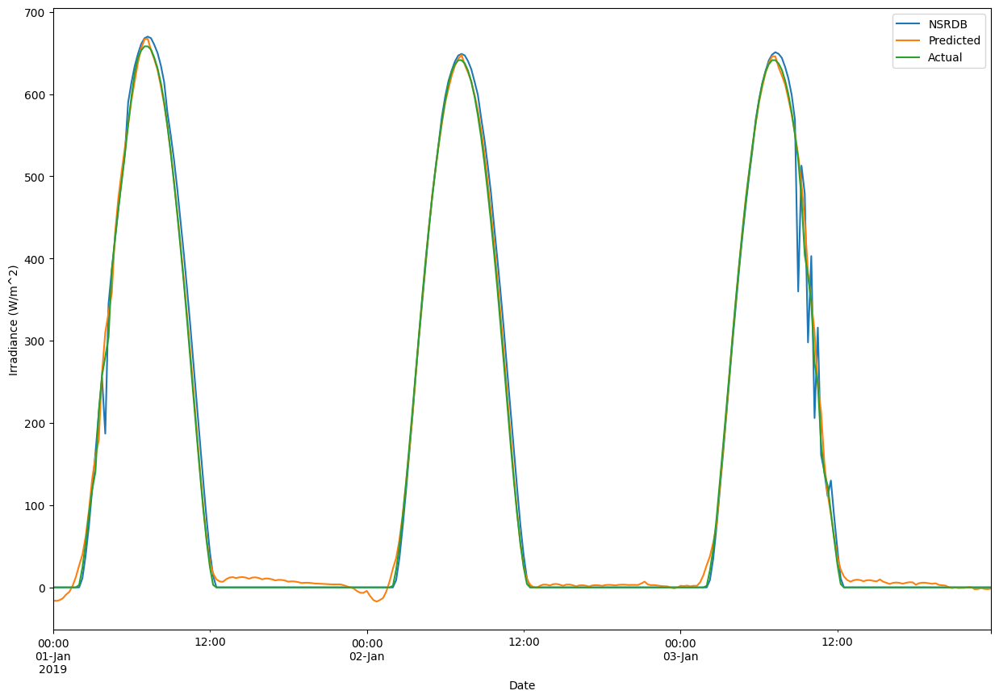

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_bh_val['Error']=df_date_bh_val['Actual']-df_date_bh_val['NSRDB']

In [ ]:
df_date_bh_val['Predicted']=df_date_bh_val['Predicted']- df_date_bh_val['Error']

r2_Score 0.9933374982720767
Root Mean Sqaured Error 25.081045646448683
Mean Absolute Error 14.495886532812696


Text(0, 0.5, 'Irradiance (W/m^2)')

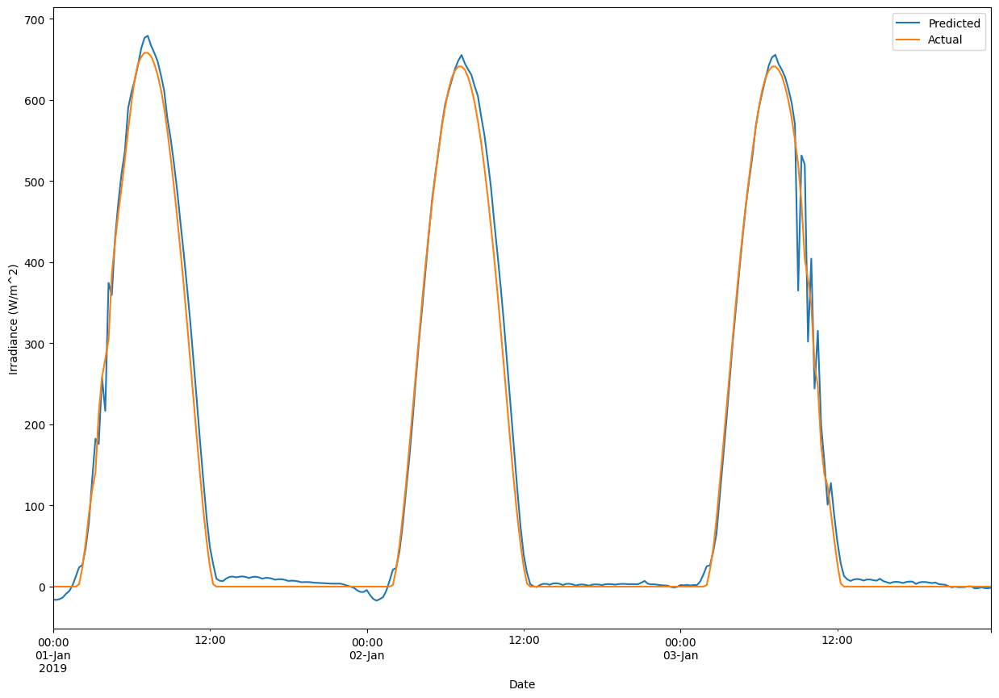

In [ ]:
print("r2_Score",r2_score(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_bh_val['NSRDB'],df_date_bh_val['Predicted']))
df_date_bh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

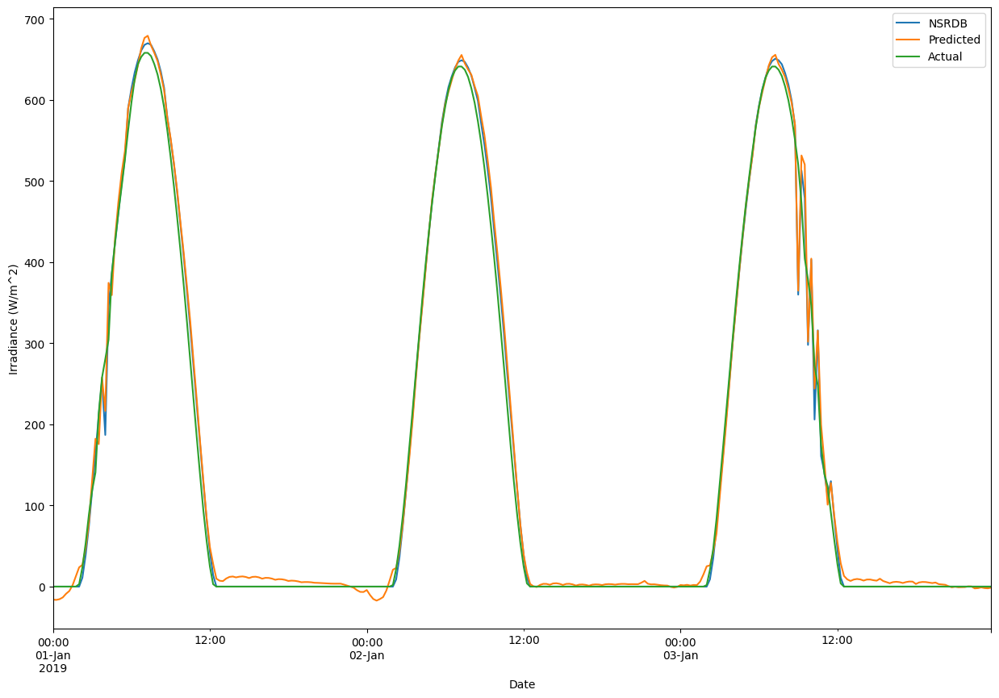

In [ ]:
df_date_bh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# REW

# S1 validation

## s1_4

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S1_4.h5')

1095/1095 [==============================] - 11s 10ms/step
r2_Score 0.9929333356519597
Root Mean Sqaured Error 25.90427
Mean Absolute Error 15.501851


Text(0, 0.5, 'Irradiance (W/m^2)')

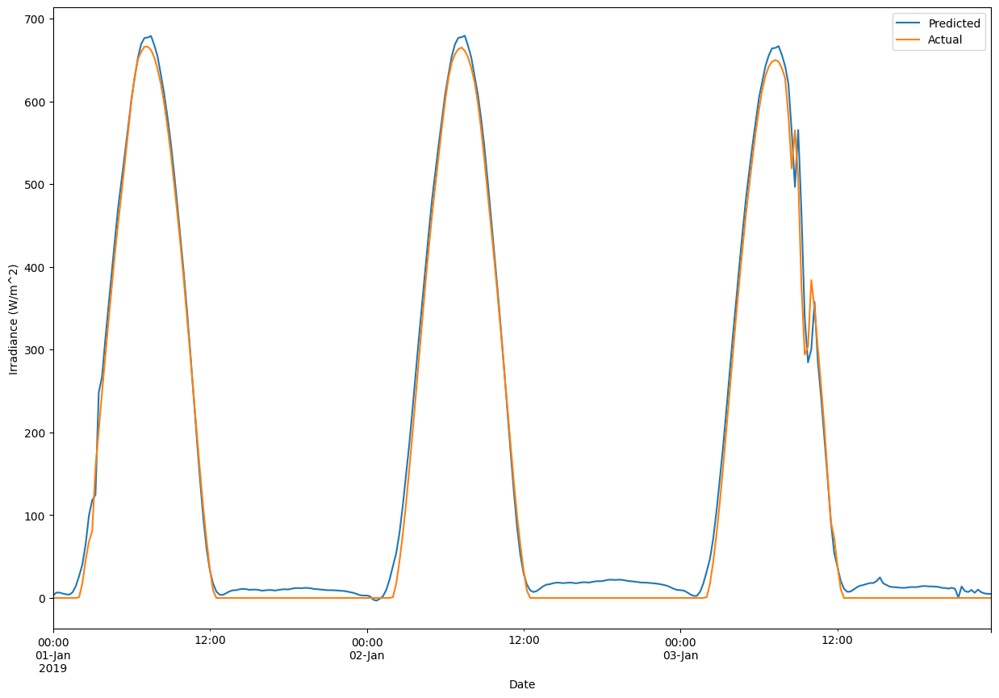

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(dh_val_x))
print("r2_Score",r2_score(s1_4.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

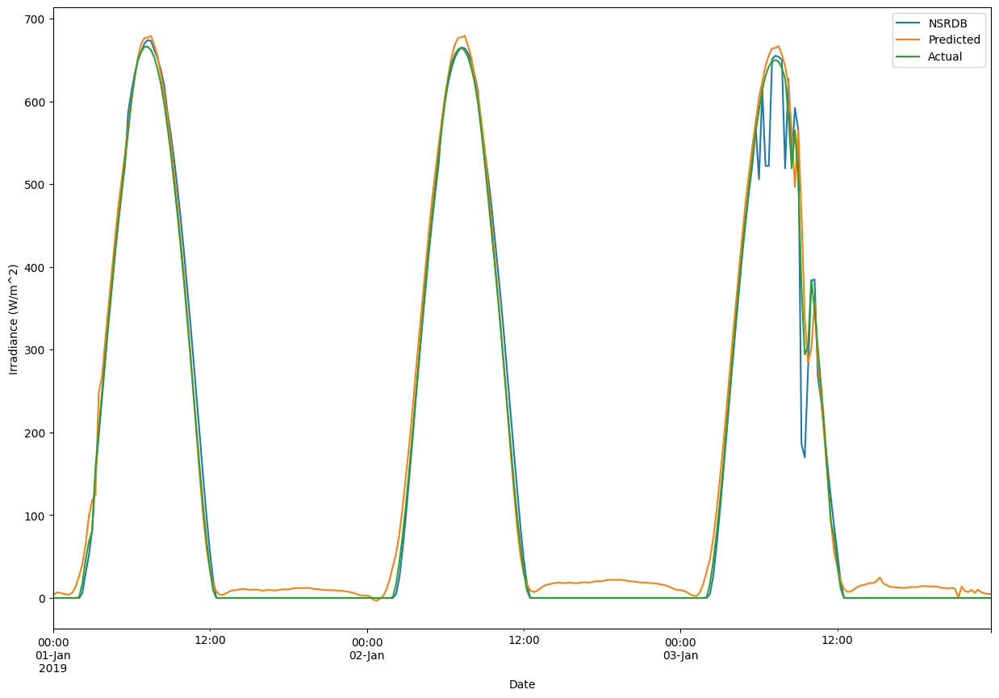

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9931208696107023
Root Mean Sqaured Error 25.904269893091538
Mean Absolute Error 15.501851053244232


Text(0, 0.5, 'Irradiance (W/m^2)')

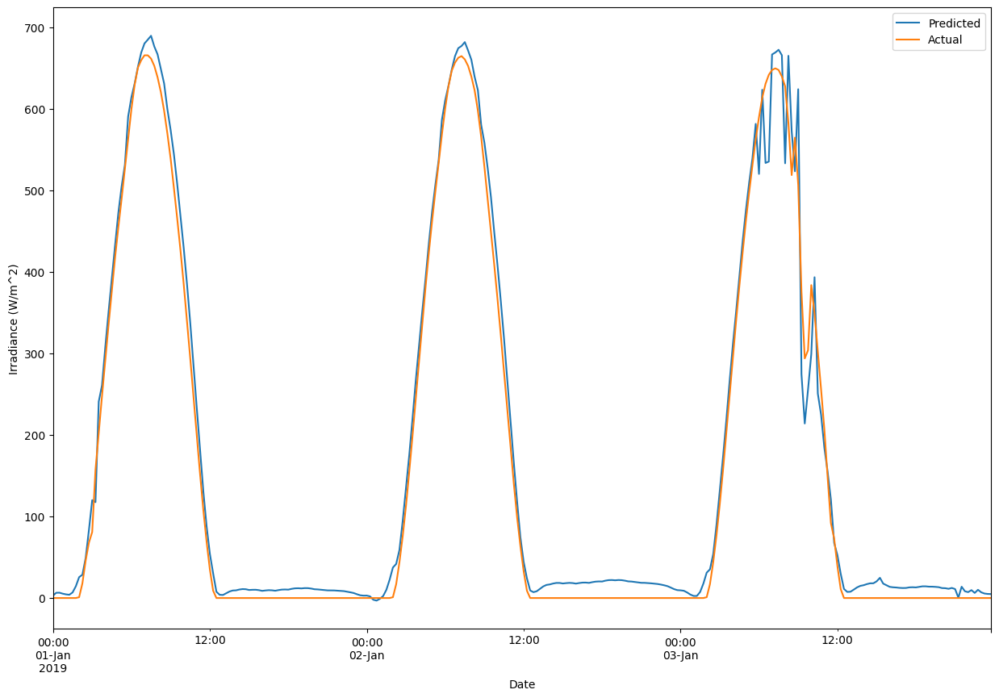

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

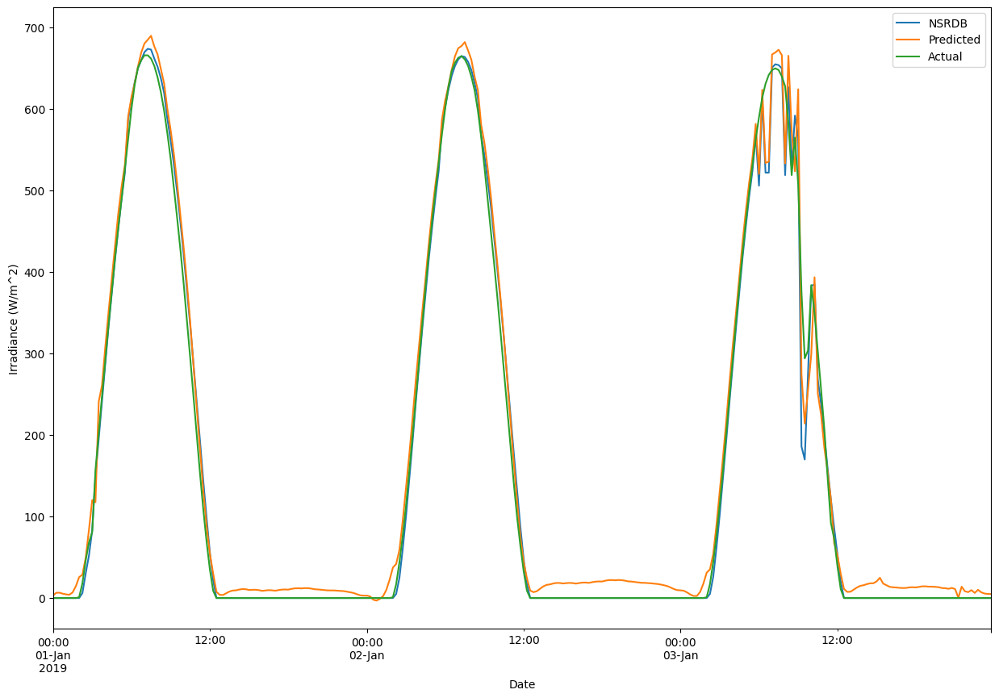

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S1_8.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.994376112713693
Root Mean Sqaured Error 22.579748
Mean Absolute Error 12.224246


Text(0, 0.5, 'Irradiance (W/m^2)')

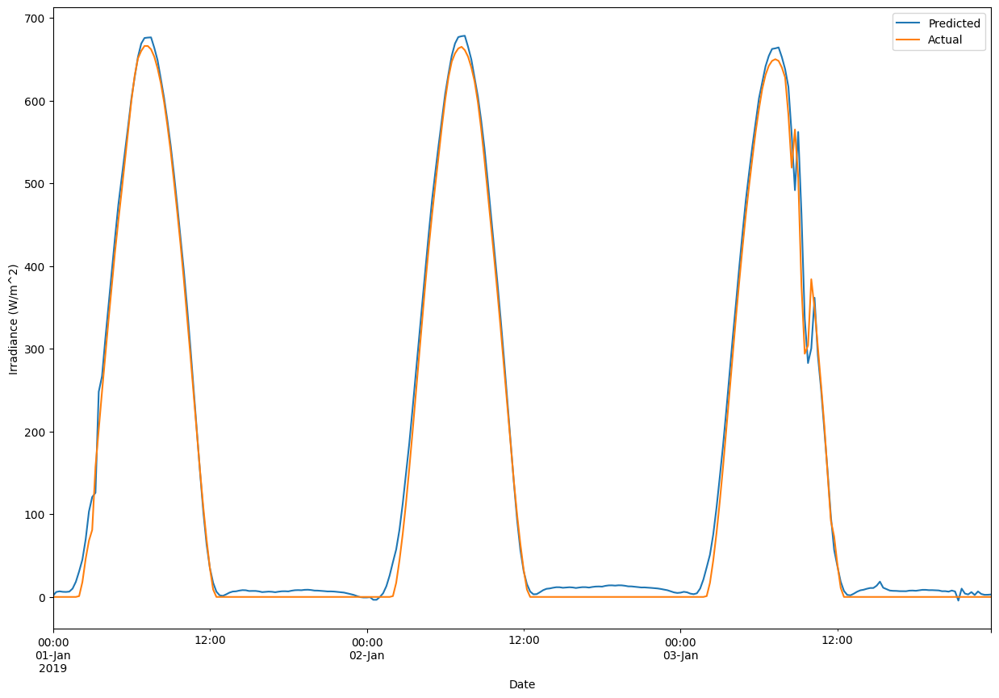

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(dh_val_x))
print("r2_Score",r2_score(s1_4.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

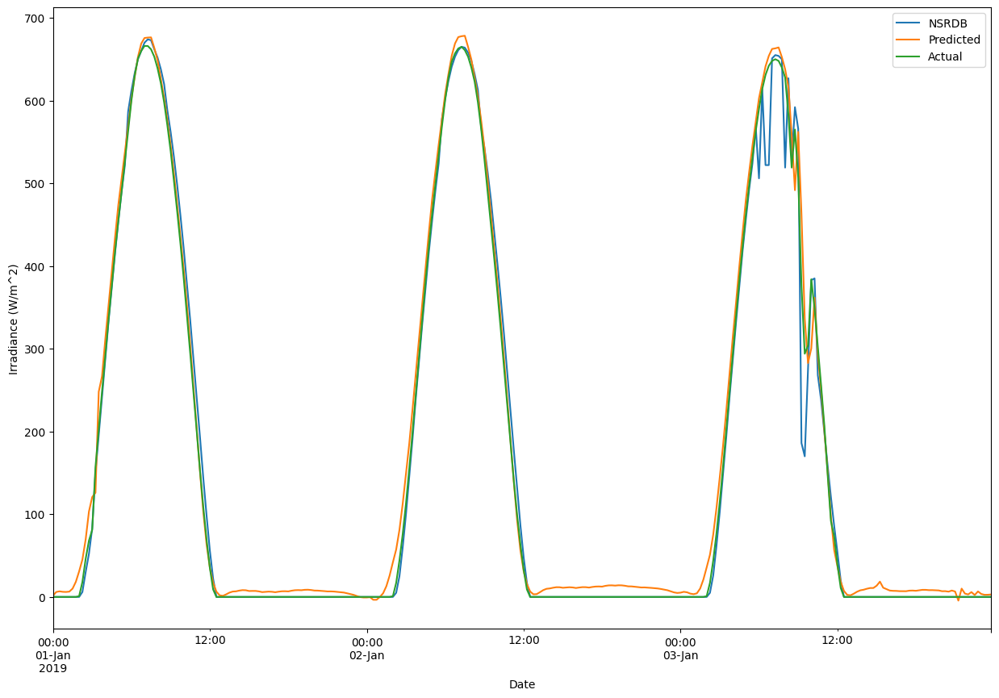

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9947732831848507
Root Mean Sqaured Error 22.579746971714517
Mean Absolute Error 12.22424645567157


Text(0, 0.5, 'Irradiance (W/m^2)')

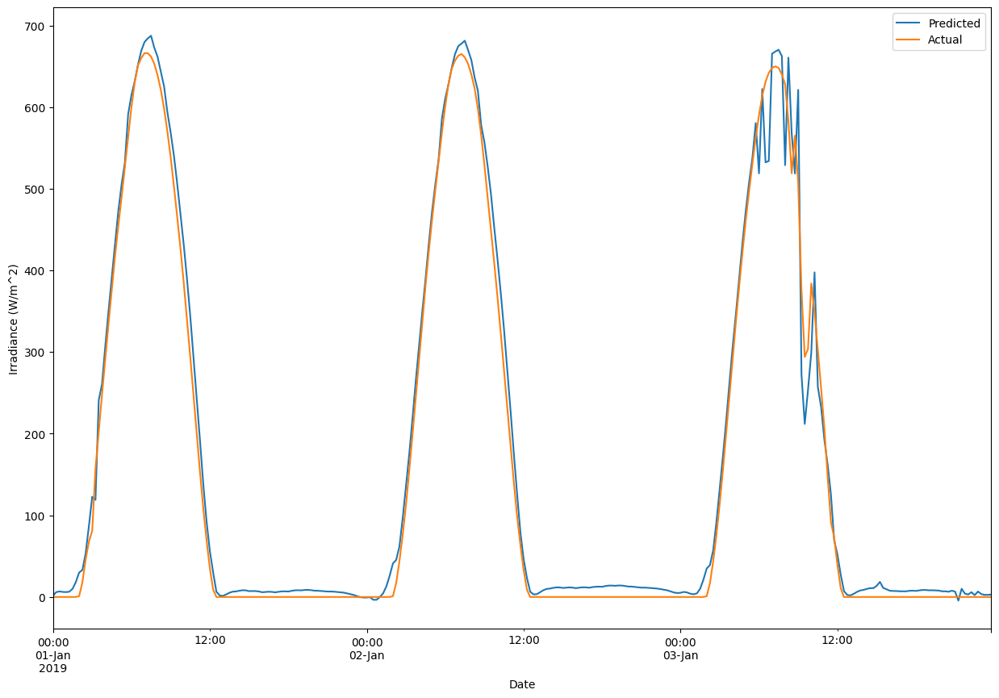

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

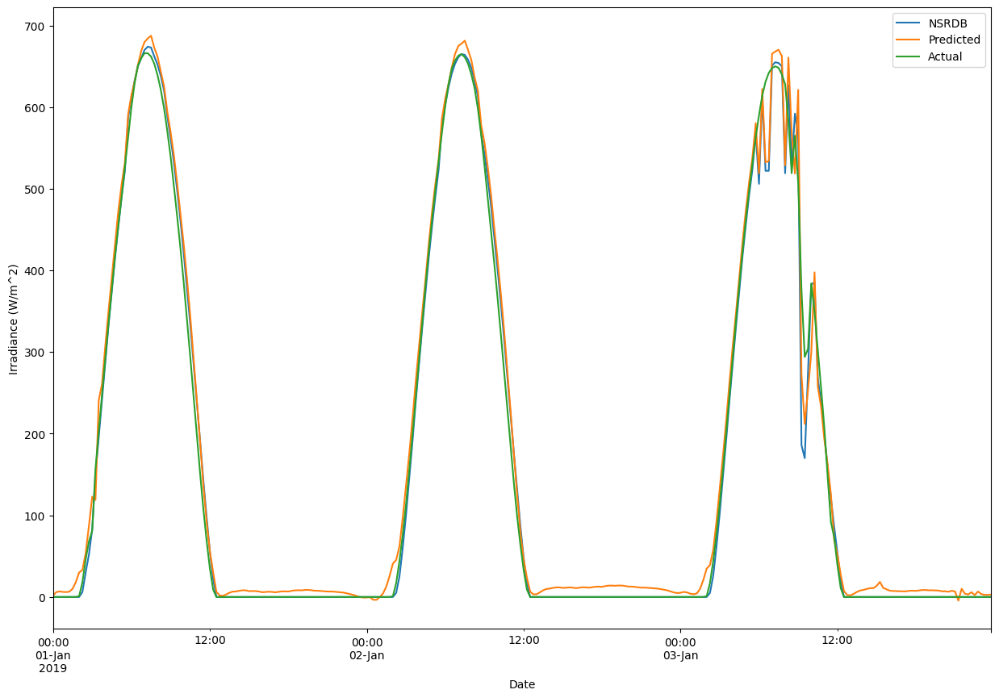

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s1_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S1_12.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9945115503146063
Root Mean Sqaured Error 22.281046
Mean Absolute Error 11.895721


Text(0, 0.5, 'Irradiance (W/m^2)')

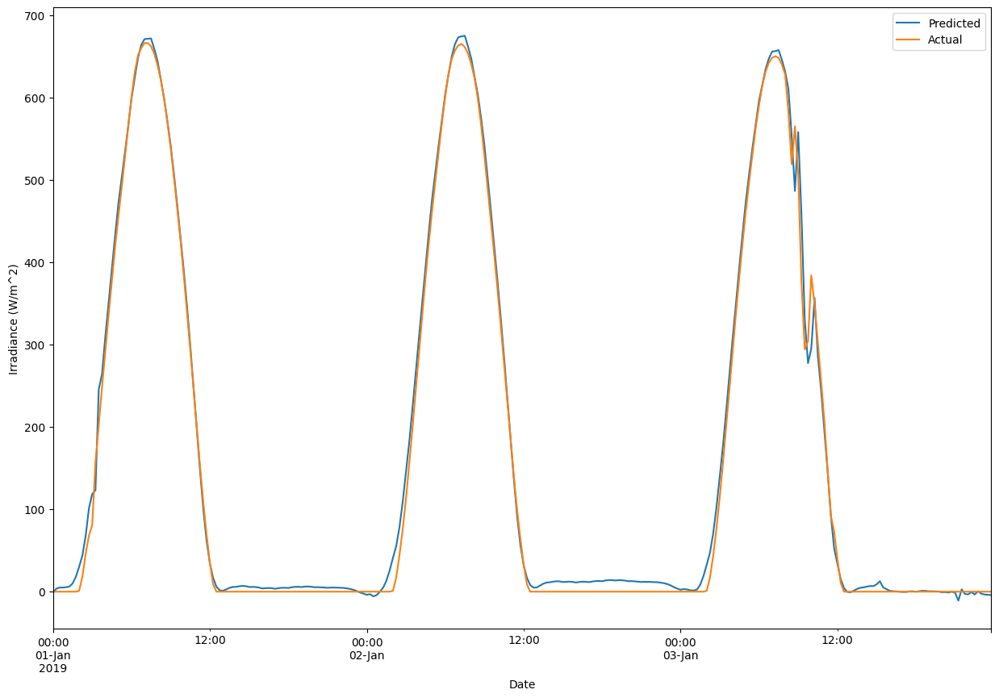

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s1_12.predict(dh_val_x))
print("r2_Score",r2_score(s1_12.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

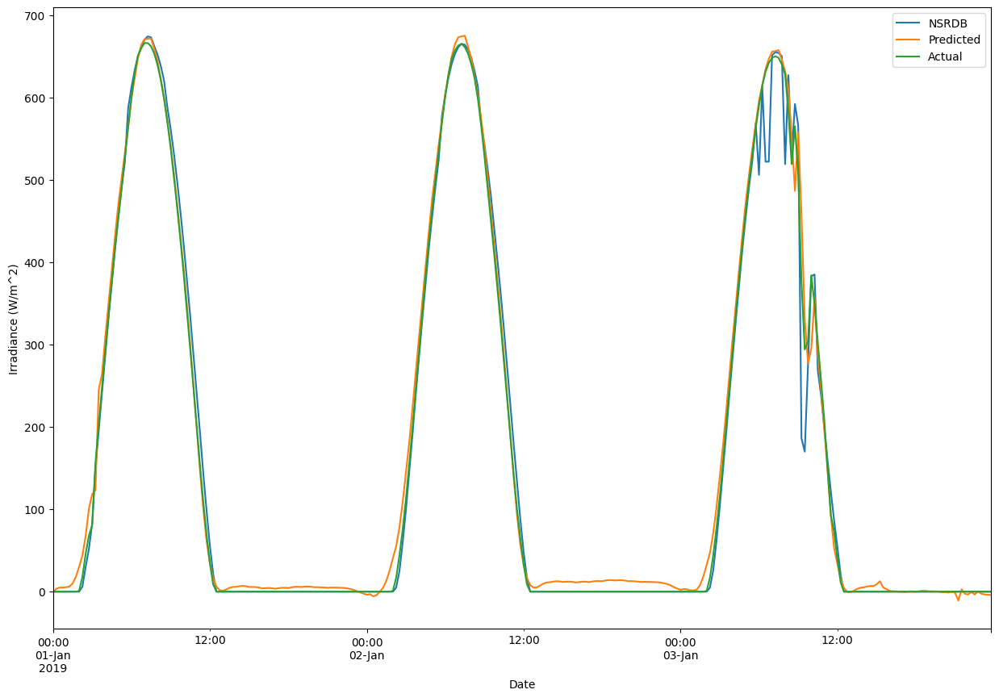

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9949106544054888
Root Mean Sqaured Error 22.281045067265904
Mean Absolute Error 11.895721294948927


Text(0, 0.5, 'Irradiance (W/m^2)')

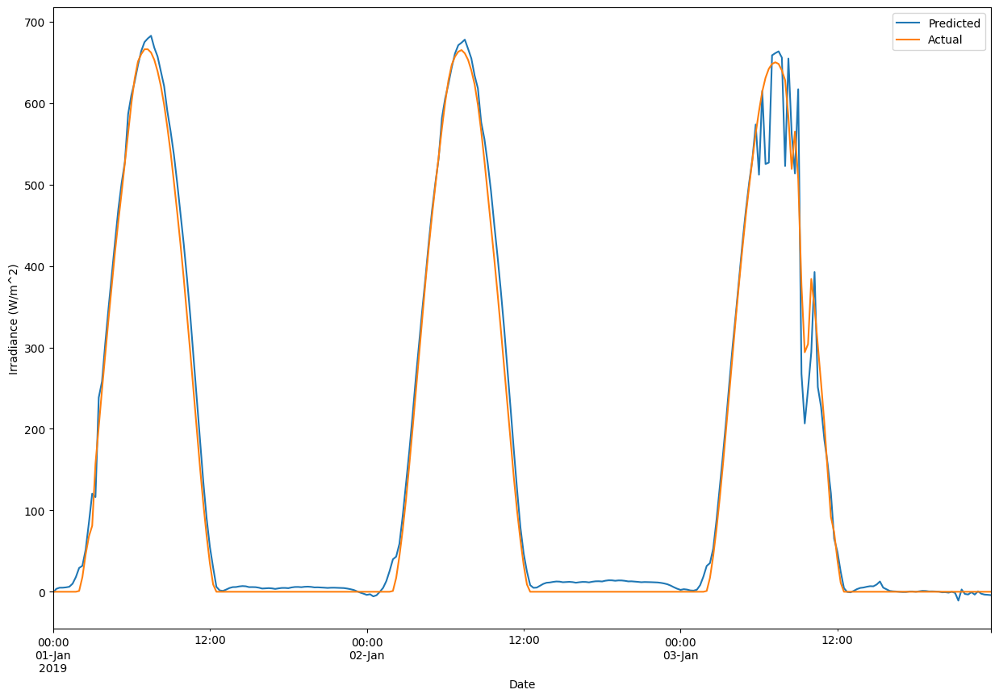

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

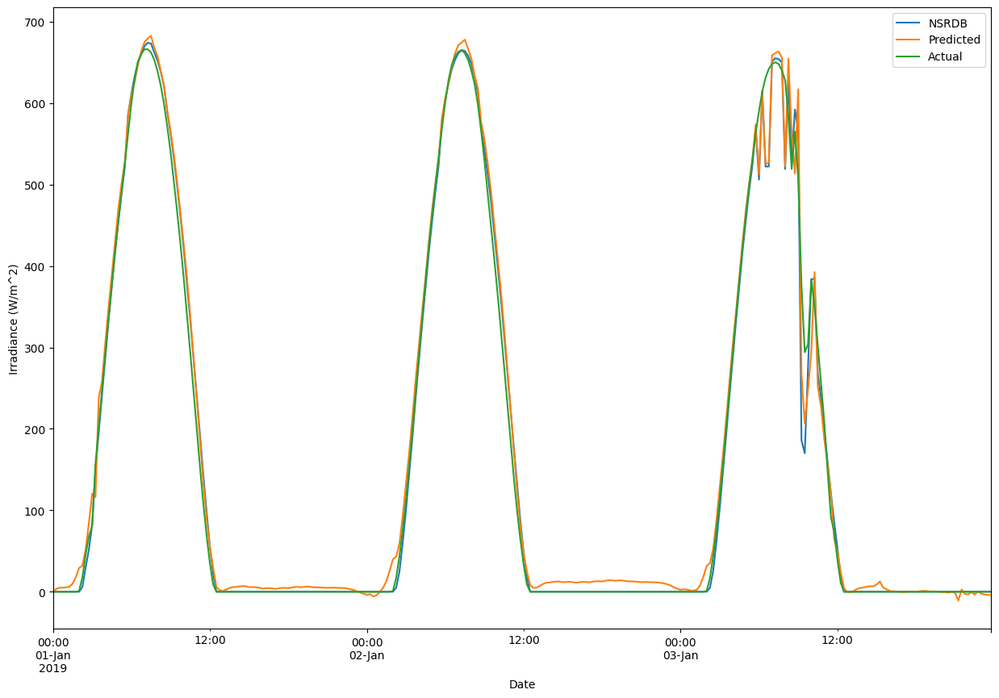

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S2 validation

## S2_4

In [ ]:
s2_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S2_4.h5.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9942019192158068
Root Mean Sqaured Error 23.35234
Mean Absolute Error 11.199189


Text(0, 0.5, 'Irradiance (W/m^2)')

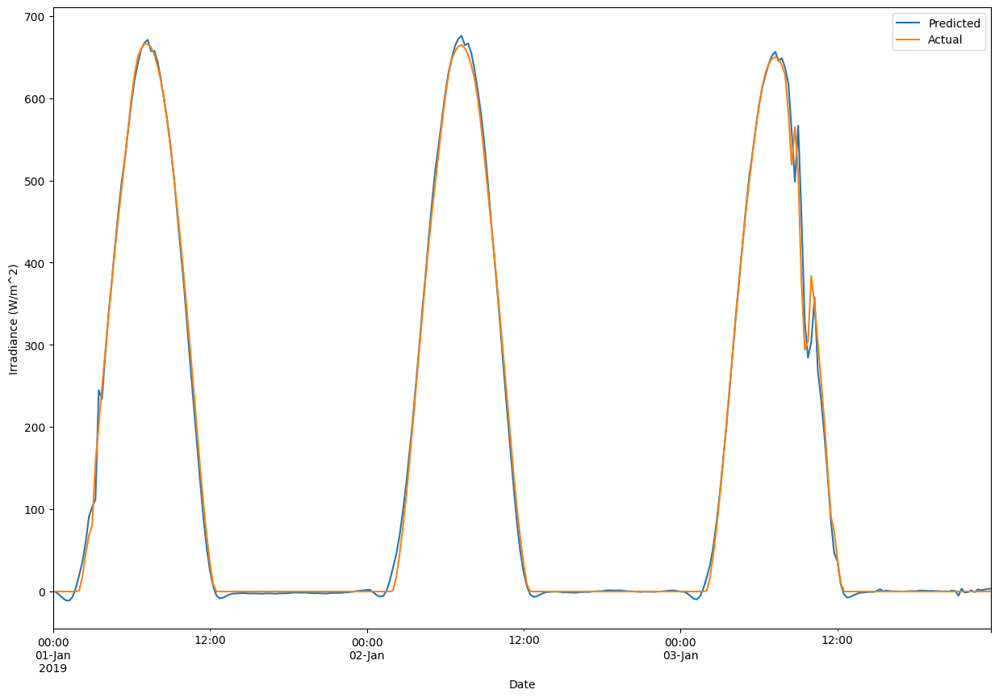

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s2_4.predict(dh_val_x))
print("r2_Score",r2_score(s2_4.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

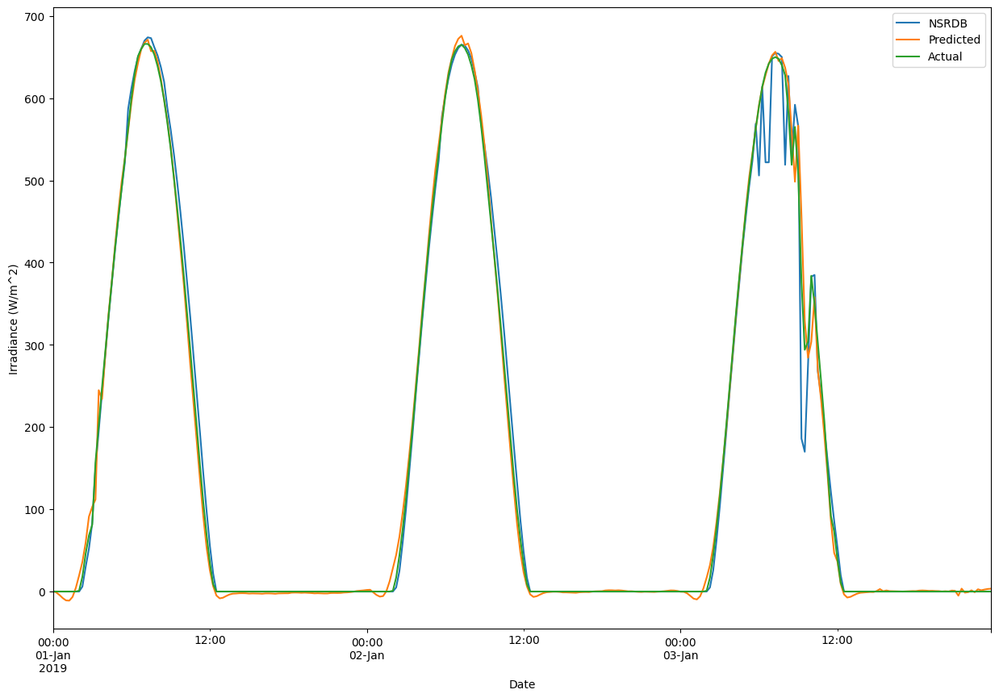

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9944094871754501
Root Mean Sqaured Error 23.352340242822187
Mean Absolute Error 11.19919056426064


Text(0, 0.5, 'Irradiance (W/m^2)')

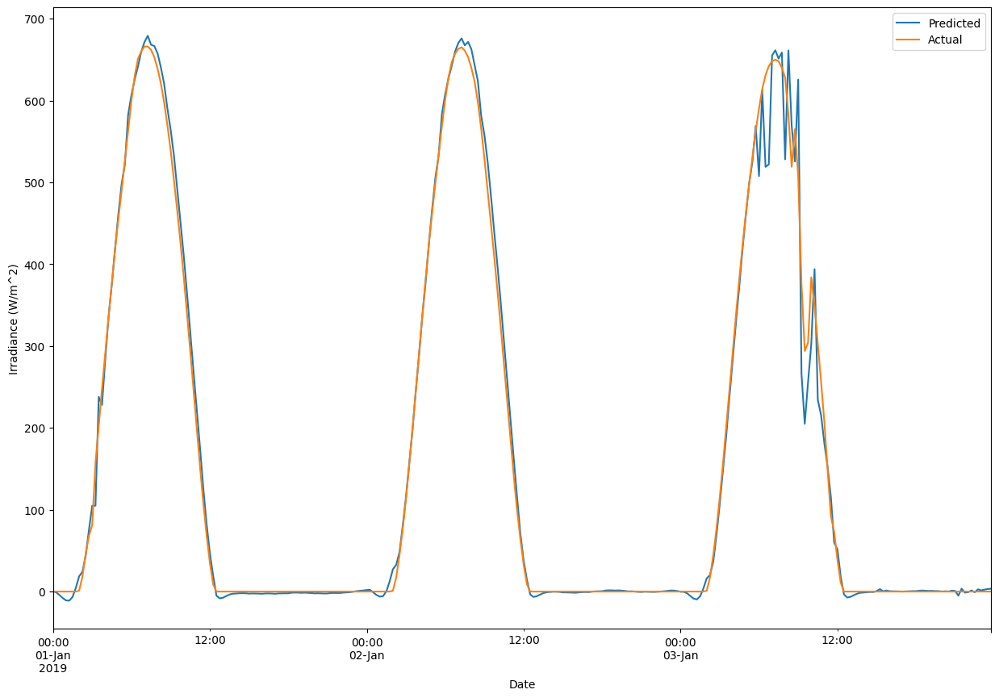

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

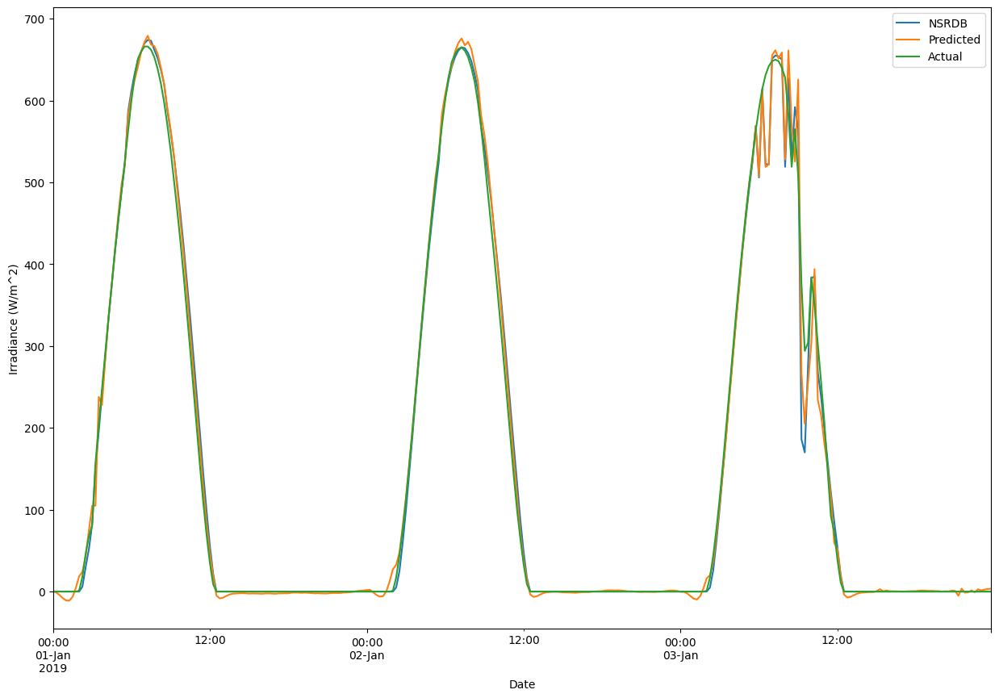

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_8 

In [ ]:
s2_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S2_8.h5.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9946630748162675
Root Mean Sqaured Error 22.225216
Mean Absolute Error 10.983731


Text(0, 0.5, 'Irradiance (W/m^2)')

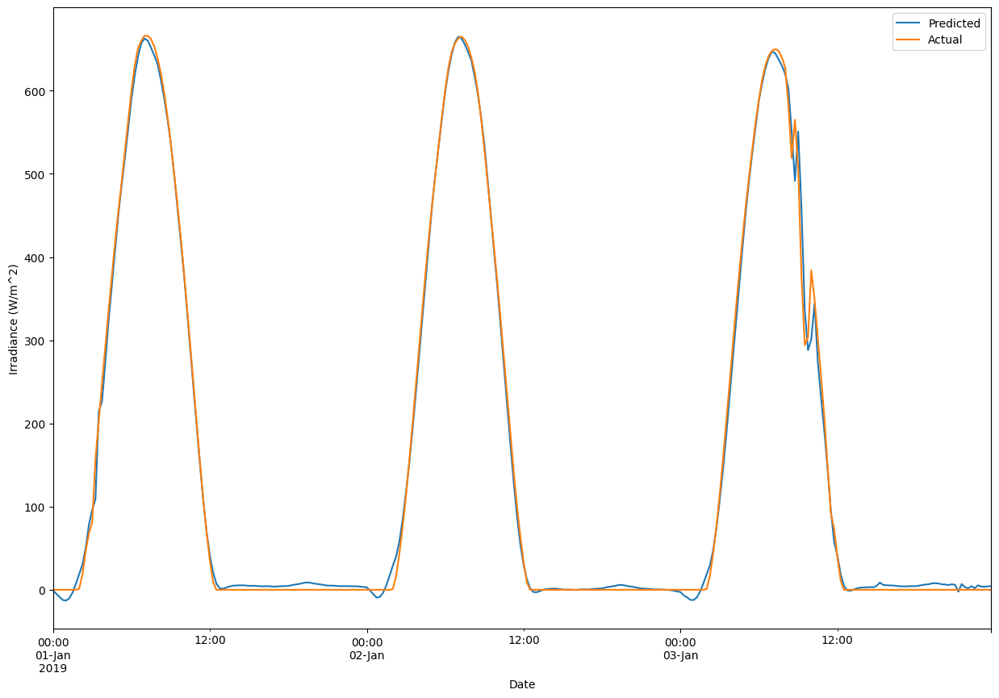

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s2_8.predict(dh_val_x))
print("r2_Score",r2_score(s2_8.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

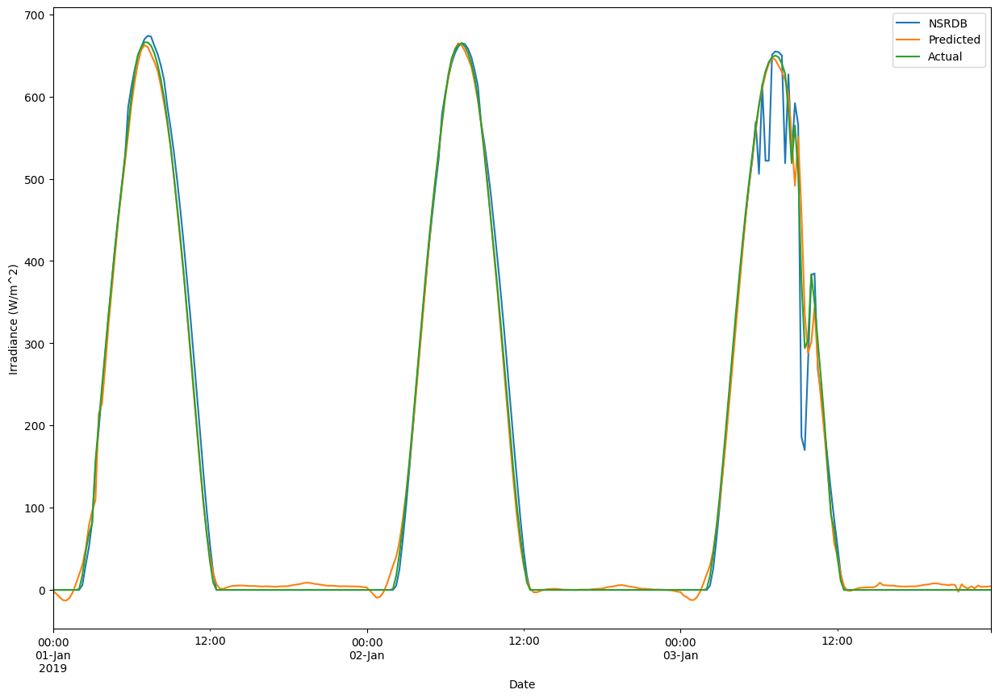

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9949361269747027
Root Mean Sqaured Error 22.225215943496835
Mean Absolute Error 10.983730312117647


Text(0, 0.5, 'Irradiance (W/m^2)')

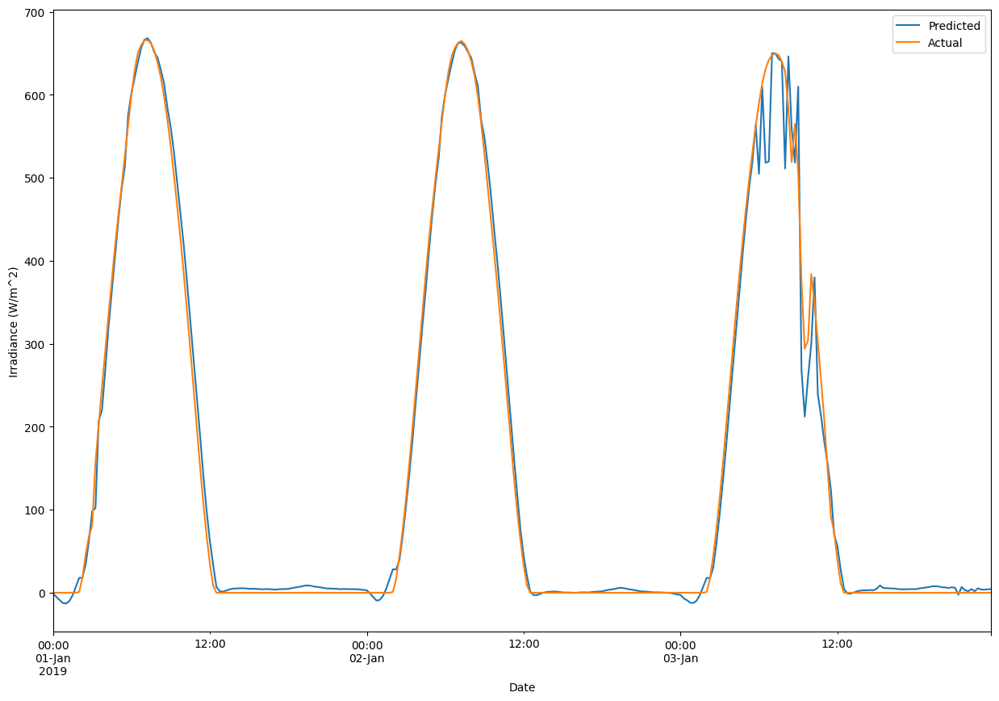

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

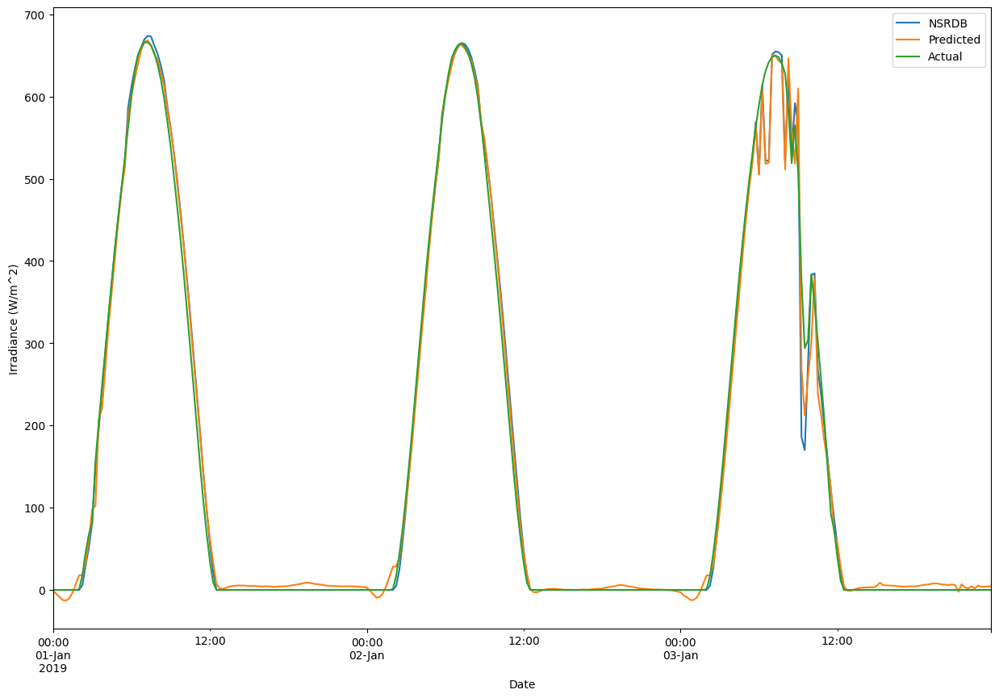

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S2_12.h5.h5')

1095/1095 [==============================] - 10s 10ms/step
r2_Score 0.9942731071100825
Root Mean Sqaured Error 23.149273
Mean Absolute Error 12.390211


Text(0, 0.5, 'Irradiance (W/m^2)')

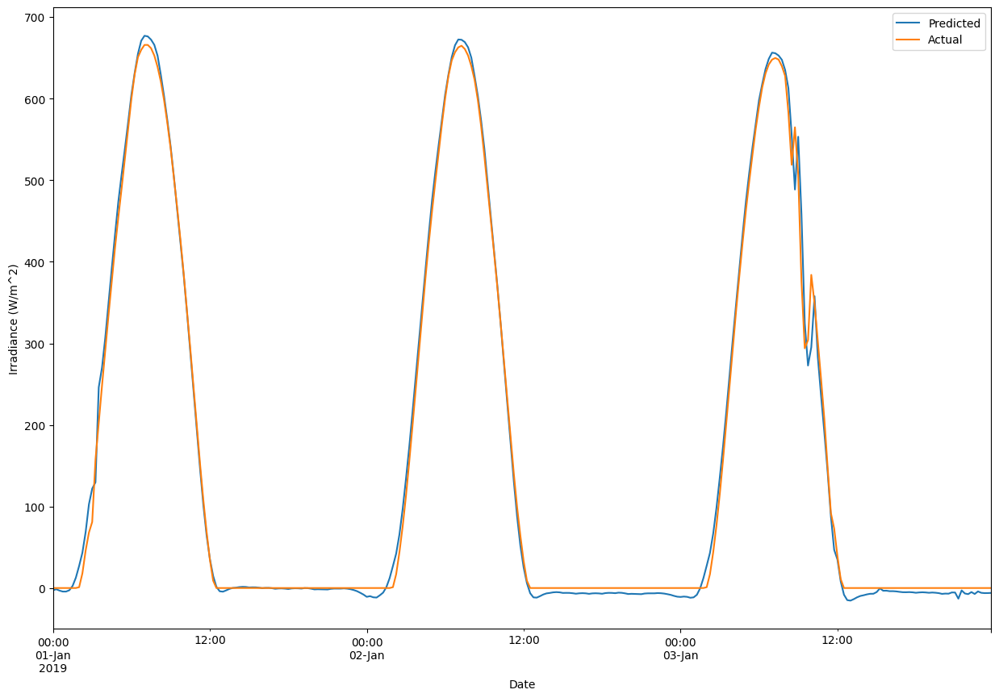

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s2_12.predict(dh_val_x))
print("r2_Score",r2_score(s2_12.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

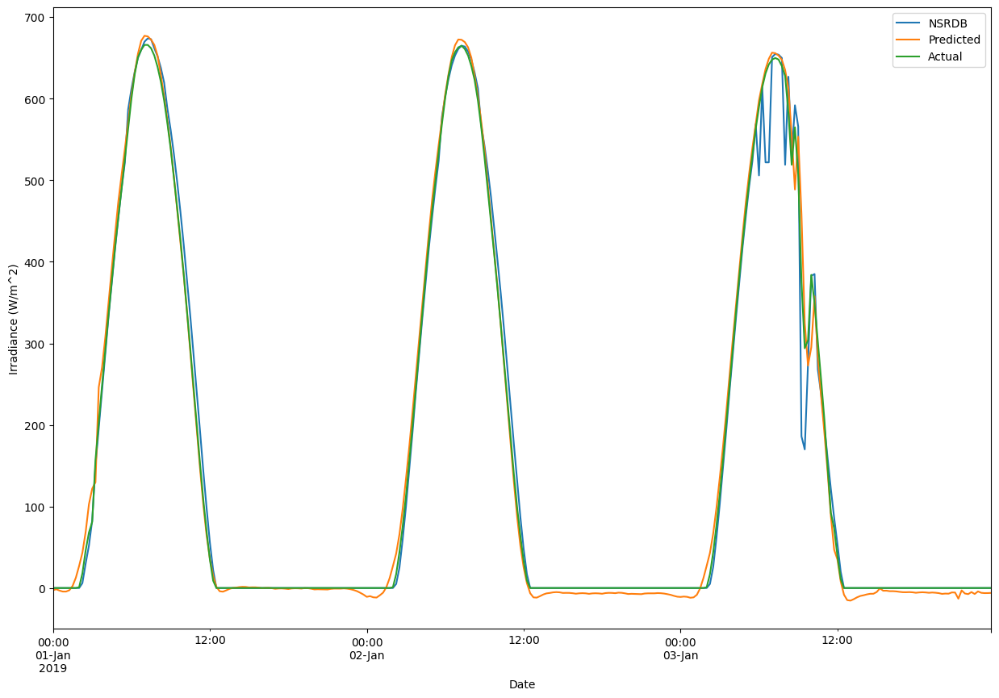

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

r2_Score 0.9945062920535198
Root Mean Sqaured Error 23.14927369428284
Mean Absolute Error 12.390210938357658


Text(0, 0.5, 'Irradiance (W/m^2)')

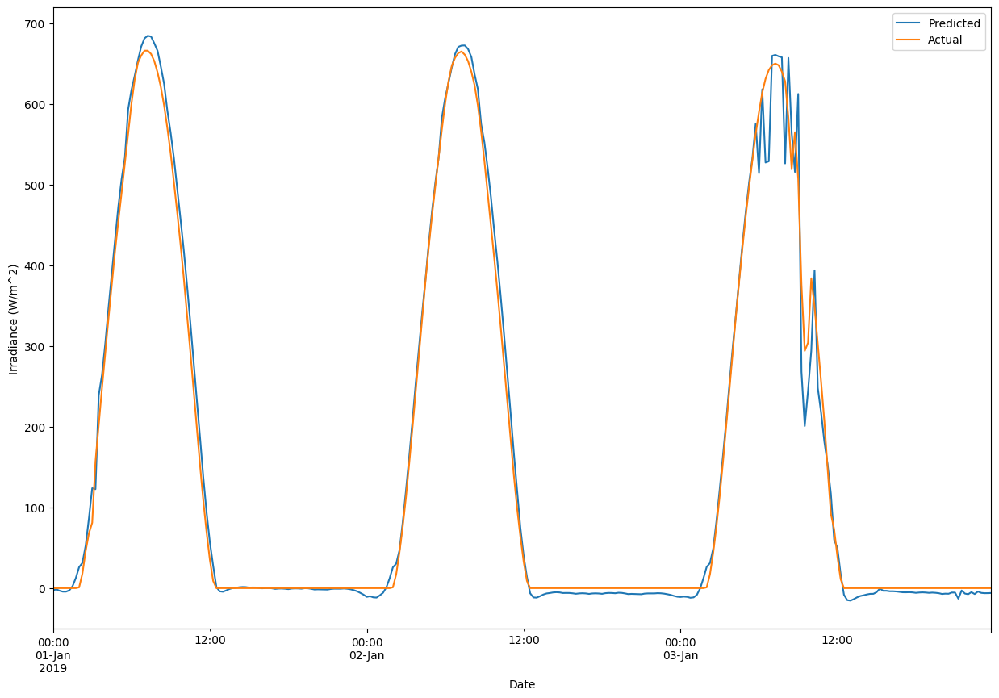

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

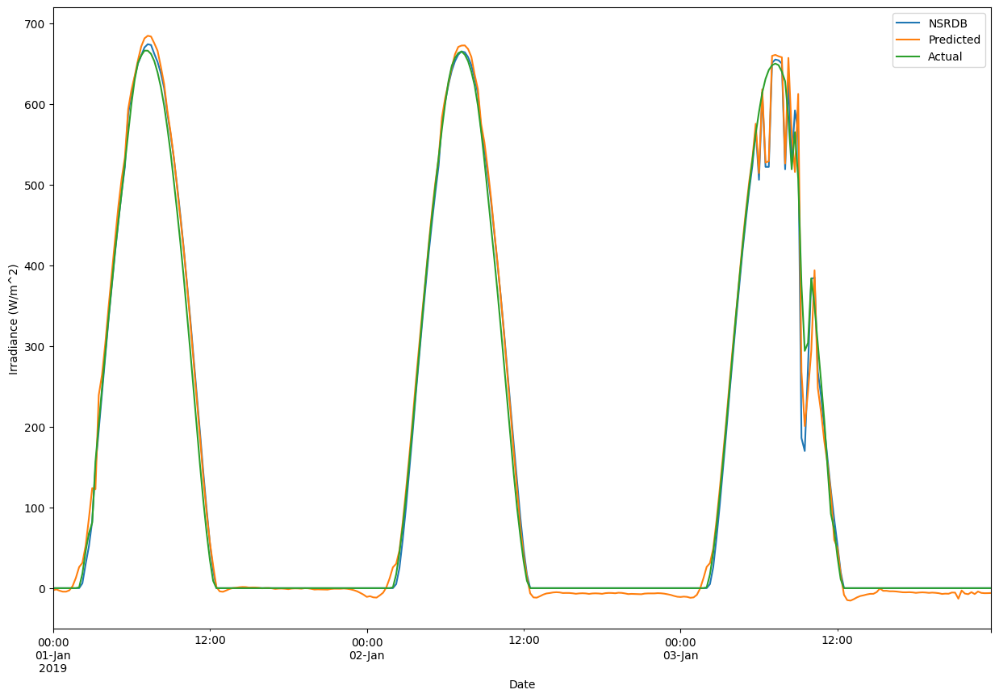

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S3 validation

## S3_4

In [ ]:
s3_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S3_4.h5')

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s3_4.predict(dh_val_x))
print("r2_Score",r2_score(s3_4.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_8 

In [ ]:
s3_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/S3_8.h5')

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s3_8.predict(dh_val_x))
print("r2_Score",r2_score(s3_8.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/S3_12.h5')

In [ ]:
df_date_dh_val['Actual']=scaler_y.inverse_transform(dh_val_y)
df_date_dh_val['Predicted']=scaler_y.inverse_transform(s3_12.predict(dh_val_x))
print("r2_Score",r2_score(s3_12.predict(dh_val_x),dh_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['Actual'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['NSRDB']=dh_val_ns['GHI'].to_list()

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val['Error']=df_date_dh_val['Actual']-df_date_dh_val['NSRDB']

In [ ]:
df_date_dh_val['Predicted']=df_date_dh_val['Predicted']- df_date_dh_val['Error']

In [ ]:
print("r2_Score",r2_score(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_dh_val['NSRDB'],df_date_dh_val['Predicted']))
df_date_dh_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_dh_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')